## Problem Statement
 

### Business Problem Overview

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal. 

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. 

In this project, you will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

### Understanding and Defining Churn:

1. There are two main models of payment in the telecom industry - postpaid (customers pay a monthly/annual bill after using the services) and prepaid (customers pay/recharge with a certain amount in advance and then use the services).


2. In the postpaid model, when customers want to switch to another operator, they usually inform the existing operator to terminate the services, and you directly know that this is an instance of churn.


3. However, in the prepaid model, customers who want to switch to another network can simply stop using the services without any notice, and it is hard to know whether someone has actually churned or is simply not using the services temporarily (e.g. someone may be on a trip abroad for a month or two and then intend to resume using the services again).

4. Thus, churn prediction is usually more critical (and non-trivial) for prepaid customers, and the term ‘churn’ should be defined carefully.  Also, prepaid is the most common model in India and southeast Asia, while postpaid is more common in Europe in North America.

This project is based on the Indian and Southeast Asian market.

Definitions of Churn:

There are various ways to define churn, such as:

1. Revenue-based churn: Customers who have not utilised any revenue-generating facilities such as mobile internet, outgoing calls, SMS etc. over a given period of time. One could also use aggregate metrics such as ‘customers who have generated less than INR 4 per month in total/average/median revenue’.

2. The main shortcoming of this definition is that there are customers who only receive calls/SMSes from their wage-earning counterparts, i.e. they don’t generate revenue but use the services. For example, many users in rural areas only receive calls from their wage-earning siblings in urban areas.

3. Usage-based churn: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.

4. A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. For e.g., if you define churn based on a ‘two-months zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.

In this project, you will use the usage-based definition to define churn.

1. High-value Churn:

1. In the Indian and the southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

2. In this project, you will define high-value customers based on a certain metric (mentioned later below) and predict churn only on high-value customers.

 

### Understanding the Business Objective and the Data:

1. The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 


2. The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.


### Understanding Customer Behaviour During Churn:

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of customer lifecycle :

1. The ‘good’ phase: 
In this phase, the customer is happy with the service and behaves as usual.

2. The ‘action’ phase: 
The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. The ‘churn’ phase: 
In this phase, the customer is said to have churned. You define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to you for prediction. Thus, after tagging churn as 1/0 based on this phase, you discard all data corresponding to this phase.

 
In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month is the ‘churn’ phase.

### Data Dictionary:

The dataset can be download using this link. The data dictionary is provided for download below.

1. Data Dictionary - Telecom Churnfile_download	Download
The data dictionary contains meanings of abbreviations. Some frequent ones are loc (local), IC (incoming), OG (outgoing), T2T (telecom operator to telecom operator), T2O (telecom operator to another operator), RECH (recharge) etc.

 
2. The attributes containing 6, 7, 8, 9 as suffixes imply that those correspond to the months 6, 7, 8, 9 respectively.

### Data Preparation:

The following data preparation steps are crucial for this problem:


1. Derive new features

This is one of the most important parts of data preparation since good features are often the differentiators between good and bad models. Use your business understanding to derive features you think could be important indicators of churn.

 
2. Filter high-value customers

As mentioned above, you need to predict churn only for the high-value customers. Define high-value customers as follows: Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

 After filtering the high-value customers, you should get about 29.9k rows.

3. Tag churners and remove attributes of the churn phase

Now tag the churned customers (churn=1, else 0) based on the fourth month as follows: Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes you need to use to tag churners are:

total_ic_mou_9

total_og_mou_9

vol_2g_mb_9

vol_3g_mb_9


After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

### Modelling:

Build models to predict churn. The predictive model that you’re going to build will serve two purposes:

It will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

It will be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

In some cases, both of the above-stated goals can be achieved by a single machine learning model. But here, you have a large number of attributes, and thus you should try using a dimensionality reduction technique such as PCA and then build a predictive model. After PCA, you can use any classification model.

Also, since the rate of churn is typically low (about 5-10%, this is called class-imbalance) - try using techniques to handle class imbalance. 


You can take the following suggestive steps to build the model:

1. Preprocess data (convert columns to appropriate formats, handle missing values, etc.)

Conduct appropriate exploratory analysis to extract useful insights (whether directly useful for business or for eventual modelling/feature engineering).

2. Derive new features.

3. Reduce the number of variables using PCA.

4. Train a variety of models, tune model hyperparameters, etc. (handle class imbalance using appropriate techniques).

5. Evaluate the models using appropriate evaluation metrics. Note that is is more important to identify churners than the non-churners accurately - choose an appropriate evaluation metric which reflects this business goal.

6. Finally, choose a model based on some evaluation metric.

7. The above model will only be able to achieve one of the two goals - to predict customers who will churn. You can’t use the above model to identify the important features for churn. That’s because PCA usually creates components which are not easy to interpret.

8. Therefore, build another model with the main objective of identifying important predictor attributes which help the business understand indicators of churn. A good choice to identify important variables is a logistic regression model or a model from the tree family. In case of logistic regression, make sure to handle multi-collinearity.

9. After identifying important predictors, display them visually - you can use plots, summary tables etc. - whatever you think best conveys the importance of features. 

10. Finally, recommend strategies to manage customer churn based on your observations.
 

Note: Everything has to be submitted in one Jupyter notebook.

 

The evaluation rubrics are mentioned on the next page.

## 1. Data Reading & Understanding:

In [1]:
# Import the Necessary Libraries

import numpy as np
import pandas as pd

# Import Visualisation libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Import the logistic regression 
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Import the scaler, KMeans etc.,
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree
import os

# Supress the warnings
import warnings
warnings.filterwarnings('ignore')


In [2]:
# Read the Csv file & Read the few coloumns and rows of the file. 

Churn = pd.read_csv('Downloads//telecom_churn_data.csv')
Churn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [3]:
# Let us check the data shape
Churn.shape

(99999, 226)

In [4]:
# We have 99999 rows and 226 coloumns. 
# Let us check then datatype 
Churn.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
mobile_number               int64
circle_id                   int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6        object
last_date_of_month_7        object
last_date_of_month_8        object
last_date_of_month_9        object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float6

In [5]:
# Let us check the statistics 
Churn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


## 2. Data Cleaning:

In [6]:
# Let us see the NAN values % in ascending order wise
round(Churn.isnull().mean(axis=0).sort_values(ascending=False)*100,2)

count_rech_2g_6             74.85
date_of_last_rech_data_6    74.85
count_rech_3g_6             74.85
av_rech_amt_data_6          74.85
max_rech_data_6             74.85
total_rech_data_6           74.85
arpu_3g_6                   74.85
arpu_2g_6                   74.85
night_pck_user_6            74.85
fb_user_6                   74.85
arpu_3g_7                   74.43
count_rech_2g_7             74.43
fb_user_7                   74.43
count_rech_3g_7             74.43
arpu_2g_7                   74.43
av_rech_amt_data_7          74.43
max_rech_data_7             74.43
night_pck_user_7            74.43
total_rech_data_7           74.43
date_of_last_rech_data_7    74.43
night_pck_user_9            74.08
date_of_last_rech_data_9    74.08
fb_user_9                   74.08
arpu_2g_9                   74.08
max_rech_data_9             74.08
arpu_3g_9                   74.08
total_rech_data_9           74.08
av_rech_amt_data_9          74.08
count_rech_3g_9             74.08
count_rech_2g_

In [7]:
# Lot of values is having more than 70% of the data null. We need to check the unique values first and deal it one by one.

In [8]:
# Let us check the unique values in sorting order and check the data / value first.
Churn.nunique().sort_values()

std_ic_t2o_mou_6            1
std_og_t2c_mou_8            1
std_og_t2c_mou_9            1
std_ic_t2o_mou_9            1
std_ic_t2o_mou_8            1
std_og_t2c_mou_7            1
std_ic_t2o_mou_7            1
last_date_of_month_9        1
std_og_t2c_mou_6            1
last_date_of_month_7        1
circle_id                   1
loc_og_t2o_mou              1
std_og_t2o_mou              1
loc_ic_t2o_mou              1
last_date_of_month_8        1
last_date_of_month_6        1
night_pck_user_7            2
night_pck_user_8            2
night_pck_user_9            2
night_pck_user_6            2
fb_user_9                   2
fb_user_8                   2
fb_user_7                   2
fb_user_6                   2
monthly_2g_9                5
monthly_2g_6                5
monthly_2g_7                6
monthly_2g_8                6
monthly_3g_9               11
monthly_3g_6               12
                        ...  
onnet_mou_7             24336
loc_og_mou_9            25376
loc_og_mou

In [9]:
## Missing values percentage of all the coloumns in sorting fashion
round(Churn.isnull().mean(axis=0).sort_values(ascending=False)*100,2)

count_rech_2g_6             74.85
date_of_last_rech_data_6    74.85
count_rech_3g_6             74.85
av_rech_amt_data_6          74.85
max_rech_data_6             74.85
total_rech_data_6           74.85
arpu_3g_6                   74.85
arpu_2g_6                   74.85
night_pck_user_6            74.85
fb_user_6                   74.85
arpu_3g_7                   74.43
count_rech_2g_7             74.43
fb_user_7                   74.43
count_rech_3g_7             74.43
arpu_2g_7                   74.43
av_rech_amt_data_7          74.43
max_rech_data_7             74.43
night_pck_user_7            74.43
total_rech_data_7           74.43
date_of_last_rech_data_7    74.43
night_pck_user_9            74.08
date_of_last_rech_data_9    74.08
fb_user_9                   74.08
arpu_2g_9                   74.08
max_rech_data_9             74.08
arpu_3g_9                   74.08
total_rech_data_9           74.08
av_rech_amt_data_9          74.08
count_rech_3g_9             74.08
count_rech_2g_

## 3. Data Imputation :

In [10]:
# As We see more than 40% of varaibles are needed for solving the business problem. We need to imute it rather than drop it.
# Let us make a custom function for the data cleaning part.
# Create a funciton and check the % values and print the missing nos. 
def checknull(per_cutoff):
    missing = round(100*(Churn.isnull().sum()/Churn.shape[0]))
    print("There are {} features having more than {}% missing value".format(len(missing.loc[missing > per_cutoff]),per_cutoff))
    return missing.loc[missing > per_cutoff]

In [11]:
# Let us also create the Imute functions so that we can imute it one by one. 
def imputenan(data,imputeColList=False,missingColList=False):
    # Function impute the nan with 0
    # argument: colList, list of columns for which nan is to be replaced with 0
    if imputeColList:
        for column in [x + y for y in ['_6','_7','_8','_9'] for x in imputeColList]:
            data[column].fillna(0, inplace=True)
    else:    
        for column in missingColList:
            data[column].fillna(0, inplace=True)

In [12]:
# Check the missing values again
checknull(70)

There are 40 features having more than 70% missing value


date_of_last_rech_data_6    75.0
date_of_last_rech_data_7    74.0
date_of_last_rech_data_8    74.0
date_of_last_rech_data_9    74.0
total_rech_data_6           75.0
total_rech_data_7           74.0
total_rech_data_8           74.0
total_rech_data_9           74.0
max_rech_data_6             75.0
max_rech_data_7             74.0
max_rech_data_8             74.0
max_rech_data_9             74.0
count_rech_2g_6             75.0
count_rech_2g_7             74.0
count_rech_2g_8             74.0
count_rech_2g_9             74.0
count_rech_3g_6             75.0
count_rech_3g_7             74.0
count_rech_3g_8             74.0
count_rech_3g_9             74.0
av_rech_amt_data_6          75.0
av_rech_amt_data_7          74.0
av_rech_amt_data_8          74.0
av_rech_amt_data_9          74.0
arpu_3g_6                   75.0
arpu_3g_7                   74.0
arpu_3g_8                   74.0
arpu_3g_9                   74.0
arpu_2g_6                   75.0
arpu_2g_7                   74.0
arpu_2g_8 

In [13]:
# We can see the KPI's are also there in the above sets. we need to imute it rather than drop it. Let us impute it with the zero.
imputeCol = ['av_rech_amt_data', 'arpu_2g', 'arpu_3g', 'count_rech_2g', 'count_rech_3g',
             'max_rech_data', 'total_rech_data','fb_user','night_pck_user']
imputenan(Churn,imputeCol)


In [14]:
# Check the data again now.
checknull(70)

There are 4 features having more than 70% missing value


date_of_last_rech_data_6    75.0
date_of_last_rech_data_7    74.0
date_of_last_rech_data_8    74.0
date_of_last_rech_data_9    74.0
dtype: float64

In [15]:
# dropping the columns having more than 50% missing values
missingcol = list(checknull(70).index)
Churn.drop(missingcol,axis=1,inplace=True)
Churn.shape


There are 4 features having more than 70% missing value


(99999, 222)

In [16]:
# Check the head again
Churn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,0.0,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,0.0,1.0,1.0,0.0,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,0.0,0.0,0.0,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,0.0,0.0,0.0,0.0,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,0.0,0.0,0.0,1526,0.0,0.0,0.00,0.00


In [17]:
# the Circle id is also of no use having a unique value in this 
Chrun = Churn.drop('circle_id',axis=1,inplace = True)
Churn.head()

,mobile_number,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,...,0,1.0,1.0,1.0,0.0,968,30.4,0.0,101.20,3.58
1,7001865778,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,...,0,0.0,1.0,1.0,0.0,1006,0.0,0.0,0.00,0.00
2,7001625959,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,189.058,...,0,0.0,0.0,0.0,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,251.102,...,0,0.0,0.0,0.0,0.0,2491,0.0,0.0,0.00,0.00
4,7000142493,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,309.876,...,0,0.0,0.0,0.0,0.0,1526,0.0,0.0,0.00,0.00


In [18]:
# check again the missing values back in the data sets.
checknull(5)

There are 29 features having more than 5% missing value


onnet_mou_9         8.0
offnet_mou_9        8.0
roam_ic_mou_9       8.0
roam_og_mou_9       8.0
loc_og_t2t_mou_9    8.0
loc_og_t2m_mou_9    8.0
loc_og_t2f_mou_9    8.0
loc_og_t2c_mou_9    8.0
loc_og_mou_9        8.0
std_og_t2t_mou_9    8.0
std_og_t2m_mou_9    8.0
std_og_t2f_mou_9    8.0
std_og_t2c_mou_9    8.0
std_og_mou_9        8.0
isd_og_mou_9        8.0
spl_og_mou_9        8.0
og_others_9         8.0
loc_ic_t2t_mou_9    8.0
loc_ic_t2m_mou_9    8.0
loc_ic_t2f_mou_9    8.0
loc_ic_mou_9        8.0
std_ic_t2t_mou_9    8.0
std_ic_t2m_mou_9    8.0
std_ic_t2f_mou_9    8.0
std_ic_t2o_mou_9    8.0
std_ic_mou_9        8.0
spl_ic_mou_9        8.0
isd_ic_mou_9        8.0
ic_others_9         8.0
dtype: float64

In [19]:
# We can see still there are 29 features having more than missing values. let us check it first.
missingcol = list(checknull(5).index)
print ("There are %d customers missing values for %s"%(len(Churn[Churn[missingcol].isnull().all(axis=1)]),missingcol))
Churn[Churn[missingcol].isnull().all(axis=1)][missingcol].head()

There are 29 features having more than 5% missing value
There are 7745 customers missing values for ['onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_t2o_mou_9', 'std_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9']


,onnet_mou_9,offnet_mou_9,roam_ic_mou_9,roam_og_mou_9,loc_og_t2t_mou_9,loc_og_t2m_mou_9,loc_og_t2f_mou_9,loc_og_t2c_mou_9,loc_og_mou_9,std_og_t2t_mou_9,...,loc_ic_t2f_mou_9,loc_ic_mou_9,std_ic_t2t_mou_9,std_ic_t2m_mou_9,std_ic_t2f_mou_9,std_ic_t2o_mou_9,std_ic_mou_9,spl_ic_mou_9,isd_ic_mou_9,ic_others_9
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
# Let us immute it with zero of these customers as we have huge nos. 7745. 
imputenan(Churn,missingColList=missingcol)

In [21]:
# Check the missing null. 
Churn=Churn[~Churn[missingcol].isnull().all(axis=1)]
Churn.shape

(99999, 221)

In [22]:
# Let us check the data set again with more than 2% nan values
checknull(2)

There are 89 features having more than 2% missing value


onnet_mou_6            4.0
onnet_mou_7            4.0
onnet_mou_8            5.0
offnet_mou_6           4.0
offnet_mou_7           4.0
offnet_mou_8           5.0
roam_ic_mou_6          4.0
roam_ic_mou_7          4.0
roam_ic_mou_8          5.0
roam_og_mou_6          4.0
roam_og_mou_7          4.0
roam_og_mou_8          5.0
loc_og_t2t_mou_6       4.0
loc_og_t2t_mou_7       4.0
loc_og_t2t_mou_8       5.0
loc_og_t2m_mou_6       4.0
loc_og_t2m_mou_7       4.0
loc_og_t2m_mou_8       5.0
loc_og_t2f_mou_6       4.0
loc_og_t2f_mou_7       4.0
loc_og_t2f_mou_8       5.0
loc_og_t2c_mou_6       4.0
loc_og_t2c_mou_7       4.0
loc_og_t2c_mou_8       5.0
loc_og_mou_6           4.0
loc_og_mou_7           4.0
loc_og_mou_8           5.0
std_og_t2t_mou_6       4.0
std_og_t2t_mou_7       4.0
std_og_t2t_mou_8       5.0
                      ... 
loc_ic_t2f_mou_8       5.0
loc_ic_mou_6           4.0
loc_ic_mou_7           4.0
loc_ic_mou_8           5.0
std_ic_t2t_mou_6       4.0
std_ic_t2t_mou_7       4.0
s

In [23]:
# WE could see still there are 89 features are there. Let us check it first 
missingcol = list(checknull(2).index)
print ("There are %d customers missing values for %s"%(len(Churn[Churn[missingcol].isnull().all(axis=1)]),missingcol))
Churn[Churn[missingcol].isnull().all(axis=1)][missingcol].head()

There are 89 features having more than 2% missing value
There are 381 customers missing values for ['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og

,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,...,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,date_of_last_rech_8,date_of_last_rech_9
202,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1206,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1232,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
# check the missing null and shape again.
Churn=Churn[~Churn[missingcol].isnull().all(axis=1)]
Churn.shape

(99618, 221)

In [25]:
# There are 381 customers having 89 features. we can imute it with zero.
missingcol.remove('date_of_last_rech_8')
missingcol.remove('date_of_last_rech_9')
imputenan(Churn,missingColList=missingcol)


In [26]:
# Let us check the missing nan again
# Let us check the data set again
checknull(0)

There are 9 features having more than 0% missing value


loc_og_t2o_mou          1.0
std_og_t2o_mou          1.0
loc_ic_t2o_mou          1.0
last_date_of_month_8    1.0
last_date_of_month_9    1.0
date_of_last_rech_6     1.0
date_of_last_rech_7     1.0
date_of_last_rech_8     3.0
date_of_last_rech_9     4.0
dtype: float64

In [27]:
# Let us create the new data frame and store these features and run the uniqueness to impute it further .
columns = ['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','last_date_of_month_8','last_date_of_month_9','date_of_last_rech_6','date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9']
for x in columns: 
    print("Unique values in column %s are %s" % (x,Churn[x].unique()))

Unique values in column loc_og_t2o_mou are [ 0. nan]
Unique values in column std_og_t2o_mou are [ 0. nan]
Unique values in column loc_ic_t2o_mou are [ 0. nan]
Unique values in column last_date_of_month_8 are ['8/31/2014' nan]
Unique values in column last_date_of_month_9 are ['9/30/2014' nan]
Unique values in column date_of_last_rech_6 are ['6/21/2014' '6/29/2014' '6/17/2014' '6/28/2014' '6/26/2014' '6/19/2014'
 '6/27/2014' '6/25/2014' '6/14/2014' '6/18/2014' '6/20/2014' '6/30/2014'
 '6/23/2014' nan '6/22/2014' '6/24/2014' '6/12/2014' '6/3/2014'
 '6/11/2014' '6/16/2014' '6/10/2014' '6/15/2014' '6/13/2014' '6/7/2014'
 '6/8/2014' '6/6/2014' '6/2/2014' '6/4/2014' '6/5/2014' '6/1/2014'
 '6/9/2014']
Unique values in column date_of_last_rech_7 are ['7/16/2014' '7/31/2014' '7/24/2014' '7/28/2014' '7/17/2014' '7/25/2014'
 '7/23/2014' '7/5/2014' '7/10/2014' '7/22/2014' '7/30/2014' '7/3/2014'
 '7/7/2014' '7/29/2014' '7/27/2014' '7/19/2014' '7/14/2014' '7/20/2014'
 '7/4/2014' '7/12/2014' nan '7/26

In [28]:
# It seems are single value only. we can impute it with the same.Let us impute with mode first and proceed
columns = ['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9']
for x in columns:
    print(Churn[x].value_counts())
    Churn[x].fillna(Churn[x].mode()[0], inplace=True)
print("All the above features take only one value. Lets impute the missing values in these features with the mode")

0.0    98981
Name: loc_og_t2o_mou, dtype: int64
0.0    98981
Name: std_og_t2o_mou, dtype: int64
0.0    98981
Name: loc_ic_t2o_mou, dtype: int64
7/31/2014    99300
Name: last_date_of_month_7, dtype: int64
8/31/2014    98867
Name: last_date_of_month_8, dtype: int64
9/30/2014    98321
Name: last_date_of_month_9, dtype: int64
All the above features take only one value. Lets impute the missing values in these features with the mode


In [29]:
# We have impute the variables 
checknull(0)

There are 4 features having more than 0% missing value


date_of_last_rech_6    1.0
date_of_last_rech_7    1.0
date_of_last_rech_8    3.0
date_of_last_rech_9    4.0
dtype: float64

In [30]:

# All these features are missing together
missingcol = list(checknull(0).index)
print ("There are %d rows in total having missing values for these variables."%(len(Churn[Churn[missingcol].isnull().all(axis=1)])))

There are 4 features having more than 0% missing value
There are 22 rows in total having missing values for these variables.


In [31]:
# Let us impute it with the dates frequently coming. 
Churn[Churn['date_of_last_rech_6'].isnull()]['date_of_last_rech_6'] = '6/30/2014'
Churn[Churn['date_of_last_rech_7'].isnull()]['date_of_last_rech_7'] = '7/31/2014'
Churn[Churn['date_of_last_rech_8'].isnull()]['date_of_last_rech_8'] = '8/31/2014'
Churn[Churn['date_of_last_rech_9'].isnull()]['date_of_last_rech_9'] = '9/30/2014'

In [32]:
# Now we can see that the data is completely cleaned. Let us check the head.
Churn.head()

,mobile_number,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,...,0,1.0,1.0,1.0,0.0,968,30.4,0.0,101.20,3.58
1,7001865778,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,...,0,0.0,1.0,1.0,0.0,1006,0.0,0.0,0.00,0.00
2,7001625959,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,189.058,...,0,0.0,0.0,0.0,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,251.102,...,0,0.0,0.0,0.0,0.0,2491,0.0,0.0,0.00,0.00
4,7000142493,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,309.876,...,0,0.0,0.0,0.0,0.0,1526,0.0,0.0,0.00,0.00


In [33]:
# We have lot of zeros in the coloumns as a single value. let us drop it and proceed.

Single_value =Churn.columns[(Churn == 0).all()]
print ("There are {} features only having zero as values. These features are \n{}".format(len(Single_value),Single_value))

There are 11 features only having zero as values. These features are 
Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8',
       'std_og_t2c_mou_9', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7',
       'std_ic_t2o_mou_8', 'std_ic_t2o_mou_9'],
      dtype='object')


In [34]:
# We can drop these features. 
Churn.drop(Single_value,axis=1,inplace=True)

In [35]:
# Percentage of data left after removing the missing values.
print("Percentage of data remaining after treating missing values: {}%".format(round(Churn.shape[0]/99999 *100,2)))
print ("Number of customers: {}".format(Churn.shape[0]))
print ("Number of features: {}".format(Churn.shape[1]))

Percentage of data remaining after treating missing values: 99.62%
Number of customers: 99618
Number of features: 210


In [36]:
Churn.reset_index(inplace=True,drop=True)
# list of all columns which store date
date_columns = list(Churn.filter(regex='date').columns)
date_columns

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_date_of_month_9',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_9']

In [37]:
# Converting dtype of date columns to datetime
for col in date_columns:
    Churn[col] = pd.to_datetime(Churn[col], format='%m/%d/%Y')

In [38]:
# Percentage of data left after removing the missing values.
Churn.shape

(99618, 210)

## 4. Derive New Features:

In [39]:
# Let us create the new features. Also Filter high-value customers
# Defining high-value customers as follows:
#Those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).
rech_col = Churn.filter(regex=('count')).columns
Churn[rech_col].head()


,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9
0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0
1,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [40]:

# Creating new feature: avg_rech_amt_6,avg_rech_amt_7,avg_rech_amt_8,avg_rech_amt_9
for i in range(6,10):
    Churn['avg_rech_amt_'+str(i)] = round(Churn['total_rech_amt_'+str(i)]/Churn['total_rech_num_'+str(i)]+1,2)

In [41]:
# impute the NAN values

imputenan(Churn,missingColList=['avg_rech_amt_6','avg_rech_amt_7','avg_rech_amt_8','avg_rech_amt_9'])

In [42]:
# Let us create the total recharge amounts of all the months and store it.
# total recharge amount = count of recharge 2g + count of recharge of 3g of all months and convert to integer data.
for i in range(6,10):
    Churn['total_rech_num_data_'+str(i)] = (Churn['count_rech_2g_'+str(i)]+Churn['count_rech_3g_'+str(i)]).astype(int)

In [43]:
# let us store the total recharge amount data = total rechage number data * average rechage amount data
for i in range(6,10):
    Churn['total_rech_amt_data_'+str(i)] = Churn['total_rech_num_data_'+str(i)] * Churn['av_rech_amt_data_'+str(i)]

In [44]:
# Another new feature : total month recharge = total recharge amount + total recharge data for each customer each month
for i in range(6,10):
    Churn['total_month_rech_'+str(i)] = Churn['total_rech_amt_'+str(i)]+Churn['total_rech_amt_data_'+str(i)]
Churn.filter(regex=('total_month_rech')).head()


,total_month_rech_6,total_month_rech_7,total_month_rech_8,total_month_rech_9
0,614.0,504.0,504.0,0.0
1,74.0,538.0,383.0,121.0
2,168.0,315.0,116.0,404.0
3,230.0,310.0,601.0,410.0
4,252.0,350.0,287.0,200.0


In [45]:
# calculating the avegare of first two months (good phase) total monthly recharge amount
Good_Phase_avg =(Churn.total_month_rech_6 + Churn.total_month_rech_7)/2
# finding the cutoff which is the 70th percentile of the good phase average recharge amounts
Cut_off = np.percentile(Good_Phase_avg,70)
# Filtering the users whose good phase avg. recharge amount >= to the cutoff of 70th percentile.
Highvalu_users = Churn[Good_Phase_avg >= Cut_off]
# Reset the index.
Highvalu_users.reset_index(inplace=True,drop=True)

print("Number of High-Value Customers in the Dataset: %d\n"% len(Highvalu_users ))
print("Percentage High-value users in data : {}%".format(round(len(Highvalu_users )/Churn.shape[0]*100),2))

Number of High-Value Customers in the Dataset: 29906

Percentage High-value users in data : 30%


In [46]:
## We need the tag the churners. 
#Tagging Churners. Now tag the churned customers (churn=1, else 0) based on the fourth month as follows:

#Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. The attributes we need to use to tag churners are:

#total_ic_mou_9
#total_og_mou_9
#vol_2g_mb_9
#vol_3g_mb_9

def getChurnStatus(data,Churn_Phase_Month=9):
    # Function to tag customers as churners (churn=1, else 0) based on 'vol_2g_mb_','vol_3g_mb_','total_ic_mou_','total_og_mou_'
    #argument: churnPhaseMonth, indicating the month number to be used to define churn (default= 9)
    Churn_features= ['vol_2g_mb_','vol_3g_mb_','total_ic_mou_','total_og_mou_']
    flag = ~data[[s + str(Churn_Phase_Month) for s in Churn_features ]].any(axis=1)
    flag = flag.map({True:1, False:0})
    return flag

In [47]:
# Check the Churn and not churn data for high value customers.
Highvalu_users['Churn'] = getChurnStatus(Highvalu_users,9)
print(" We have {} users tagged as churners out of {} High Value Customers.".format(len(Highvalu_users[Highvalu_users.Churn == 1]),Highvalu_users.shape[0]))
print("High-value Churn Percentage : {}%".format(round(len(Highvalu_users[Highvalu_users.Churn == 1])/Highvalu_users.shape[0] *100,2)))

 We have 2418 users tagged as churners out of 29906 High Value Customers.
High-value Churn Percentage : 8.09%


# We could see that this data is highly imbalced in nature and we can see that 8.09% are churn value percentage. 

In [48]:
Highvalu_users.head()
Highvalu_users.shape

(29906, 227)

In [49]:
# As we see the REvenue is one of the important parameter. Let us create the total revenues. 
#To find the Average Revenue per unit ARU  = total Revenue / Average Subscribers
# To get the Total Revenue = Average Revenue per unit ARU * Average Subscribers(5000 nos. of the total)

# Another new feature : total month recharge = total recharge amount + total recharge data for each customer each month
for i in range(6,10):
    Highvalu_users['Total_revenue_'+str(i)] = Highvalu_users['arpu_'+str(i)] * 5000


In [50]:
Highvalu_users.filter(regex=('Total_revenue_')).head()

,Total_revenue_6,Total_revenue_7,Total_revenue_8,Total_revenue_9
0,986925.0,1074080.0,1069015.0,105500.0
1,5345900.0,6749250.0,15857400.0,2500000.0
2,1893605.0,2461115.0,686810.0,833935.0
3,2572265.0,2988765.0,3188800.0,2892980.0
4,371750.0,969485.0,1834830.0,4057400.0


In [51]:
# Total Revenue in the Phase wise manner good Phase - first two months, action phase is third month and fourth month is churn phase.
# Let us see the revenue in the Phase wise manner

Highvalu_users['Good_Phase'] = Highvalu_users['Total_revenue_6'] + Highvalu_users['Total_revenue_7']
Highvalu_users['Action_Phase'] =  Highvalu_users['Total_revenue_8']
Highvalu_users['Chrun_Phase'] = Highvalu_users['Total_revenue_9']

In [52]:
#After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).
Chrun_Phase = Highvalu_users.filter(regex='_9', axis=1)
Highvalu_users.drop(Chrun_Phase,axis=1,inplace=True)
Highvalu_users.shape

(29906, 178)

## 5. Data Analysis
### Univariate and Bi-Variate Analysis:

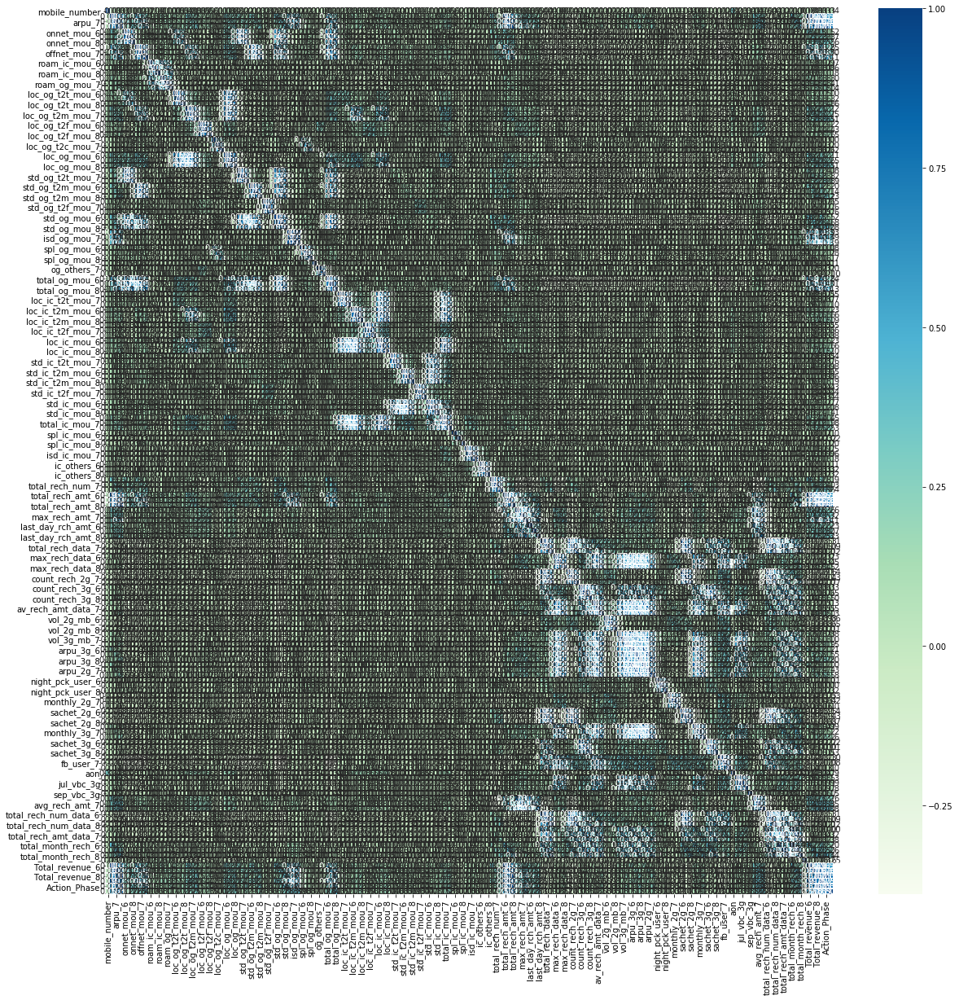

In [53]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,20))        # Size of the figure
sns.heatmap(Highvalu_users.corr(),annot = True, fmt = ".2f", cmap = "GnBu")

### Inferences:

It is very difficult to see the correlation of the variables. Let us check for the 80% correlated variables and map again

In [54]:
# correlation matrix
corr_matrix = Highvalu_users.corr().abs()

# Selecting the upper triangle of the correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# feature columns with correlation greater than 0.80
high_corr_feat = [column for column in upper.columns if any(upper[column] > 0.80)]

print("HIGHLY CORRELATED FEATURES IN DATA SET:{}\n\n{}".format(len(high_corr_feat), high_corr_feat))

HIGHLY CORRELATED FEATURES IN DATA SET:66

['onnet_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_7', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'av_rech_amt_data_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'avg_rech_amt_7', 'avg_rech_amt_8', 'total_rech_num_data_6', '

In [55]:
# Inferences : Around 66 Variables are highly correlated each other more than 80% 

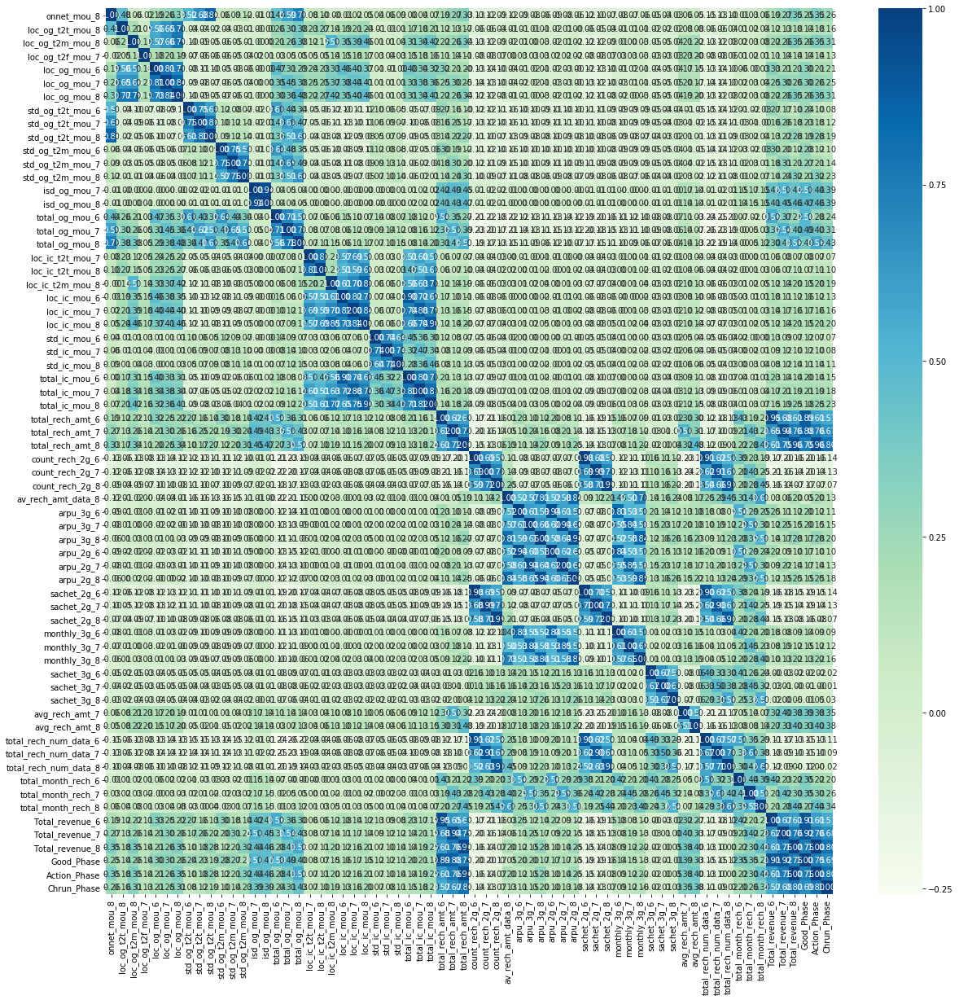

In [56]:
# Let us check only these variables correlation and find the inferences and proceed for the univarate and bi-variate analysis.
new_corrs = Highvalu_users[['onnet_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_7', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'av_rech_amt_data_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8', 'avg_rech_amt_7', 'avg_rech_amt_8', 'total_rech_num_data_6', 'total_rech_num_data_7', 'total_rech_num_data_8', 'total_month_rech_6', 'total_month_rech_7', 'total_month_rech_8', 'Total_revenue_6', 'Total_revenue_7', 'Total_revenue_8', 'Good_Phase', 'Action_Phase', 'Chrun_Phase']]
# Let's see the correlation matrix 
plt.figure(figsize = (20,20))        # Size of the figure
sns.heatmap(new_corrs.corr(),annot = True, fmt = ".2f", cmap = "GnBu")

### Inferences :
The Total recharge amount for june_6 is postive correlation with the sachet data 2g for June month is 0.9.

The total revenue for all the months of june, july and aug are highly postive of 0.96 with the total recharge amount

The Good phase is highly corrlated with the total rechage as 0.8 and action phase as 0.6 and chrun phase 0.5 with the total recharge amount


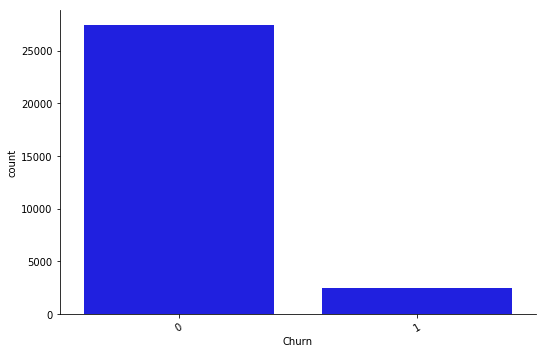

In [57]:
# Check the churn in a graphical way 

C_IT = sns.catplot("Churn", data = Highvalu_users, aspect=1.5, kind="count", color="b")
C_IT.set_xticklabels(rotation=30)
plt.show()

### Inferences:
The Chrun for the highvalue customers is only 8.09%.

In [58]:
Highvalu_users.head()

,mobile_number,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,...,total_month_rech_6,total_month_rech_7,total_month_rech_8,Churn,Total_revenue_6,Total_revenue_7,Total_revenue_8,Good_Phase,Action_Phase,Chrun_Phase
0,7000842753,2014-06-30,2014-07-31,2014-08-31,197.385,214.816,213.803,0.00,0.00,0.00,...,614.0,504.0,504.0,1,986925.0,1074080.0,1069015.0,2061005.0,1069015.0,105500.0
1,7000701601,2014-06-30,2014-07-31,2014-08-31,1069.180,1349.850,3171.480,57.84,54.68,52.29,...,1580.0,790.0,3638.0,1,5345900.0,6749250.0,15857400.0,12095150.0,15857400.0,2500000.0
2,7001524846,2014-06-30,2014-07-31,2014-08-31,378.721,492.223,137.362,413.69,351.03,35.08,...,437.0,955.0,327.0,0,1893605.0,2461115.0,686810.0,4354720.0,686810.0,833935.0
3,7002124215,2014-06-30,2014-07-31,2014-08-31,514.453,597.753,637.760,102.41,132.11,85.14,...,600.0,680.0,718.0,0,2572265.0,2988765.0,3188800.0,5561030.0,3188800.0,2892980.0
4,7000887461,2014-06-30,2014-07-31,2014-08-31,74.350,193.897,366.966,48.96,50.66,33.58,...,0.0,1166.0,979.0,0,371750.0,969485.0,1834830.0,1341235.0,1834830.0,4057400.0


In [59]:
#check the list of all the columns. 
list(Highvalu_users.columns)

['mobile_number',
 'last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_o

In [60]:
# the date coloumns are not needed as we have only unique values as well as the mobile nos. Let us drop and proceed
Highvalu_users.drop(['mobile_number','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis=1,inplace=True)

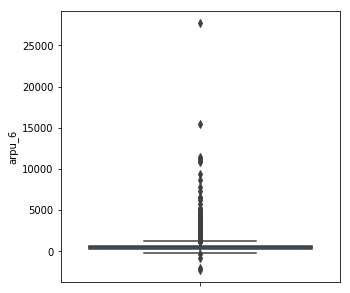

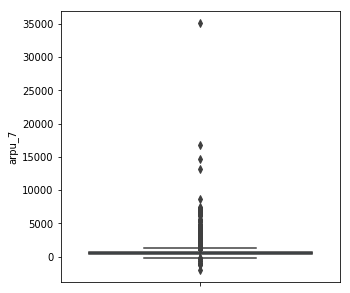

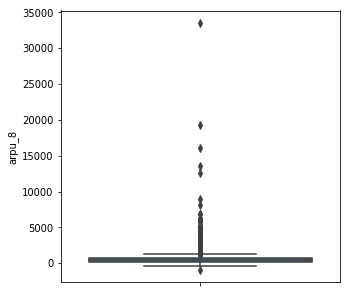

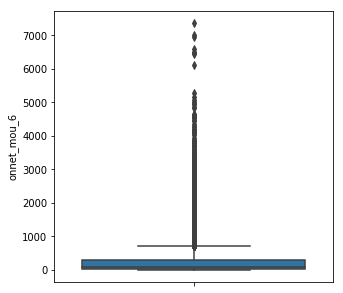

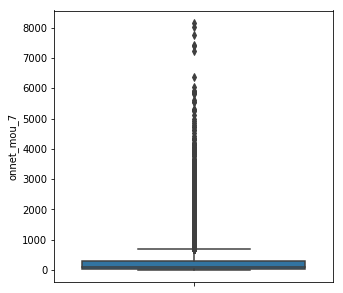

...

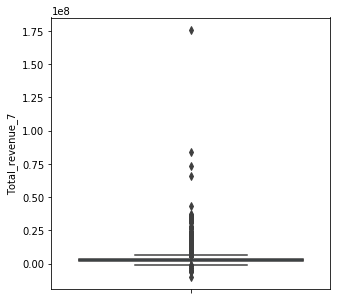

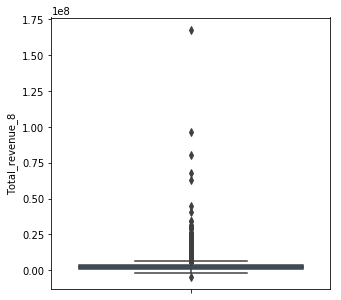

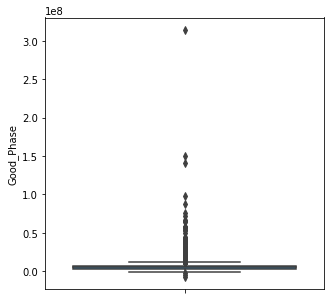

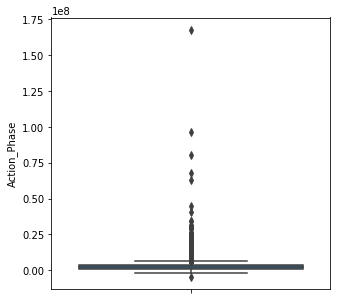

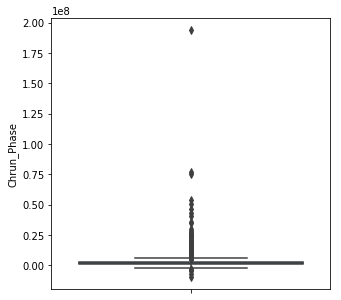

In [61]:
# sns.boxplot(y='arpu_6', data=tel)
cont_cols = [col for col in Highvalu_users.columns if col not in ['Churn']]
for col in cont_cols:
    plt.figure(figsize=(5, 5))
    sns.boxplot(y=col, data= Highvalu_users)

### Inferences : 
 We could see that lot of ouliers are there in the data sets. 
The variables such as Good Phase, Action phase, churn phase, the total Revenue variable of all the months, and all other variabless we can see normaly distributed with outliers.


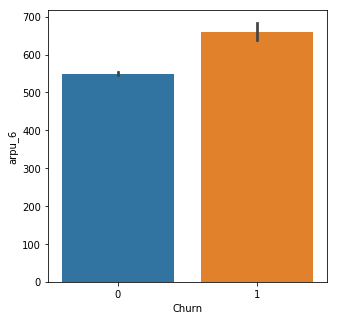

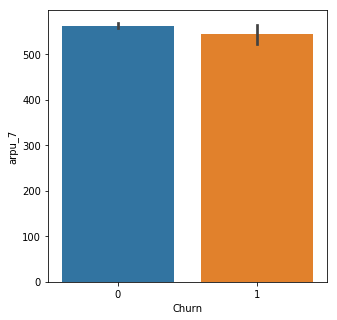

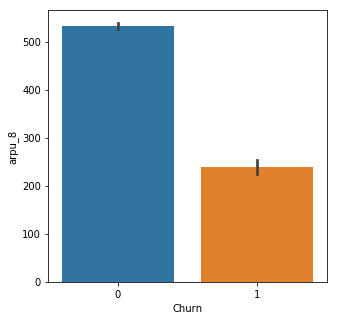

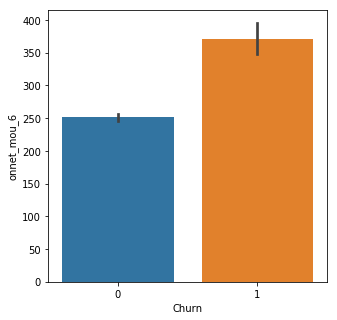

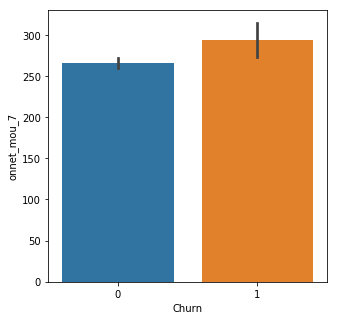

...

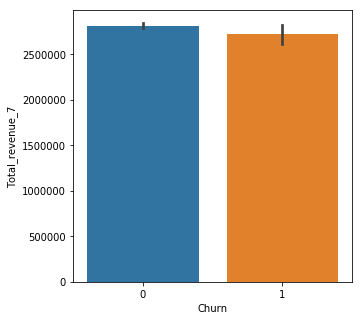

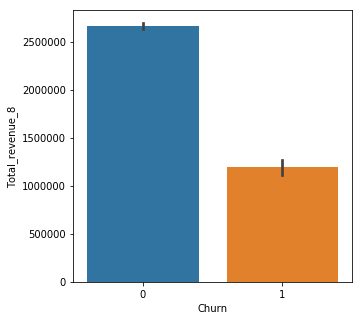

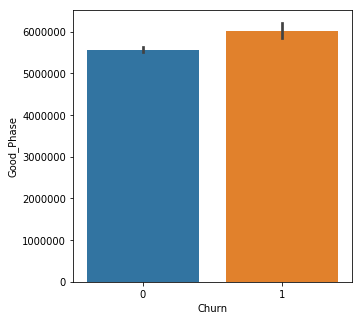

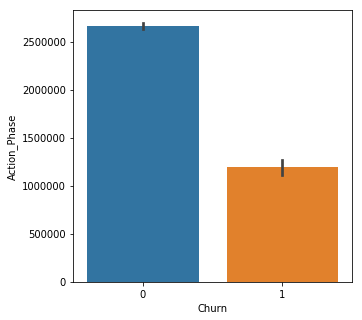

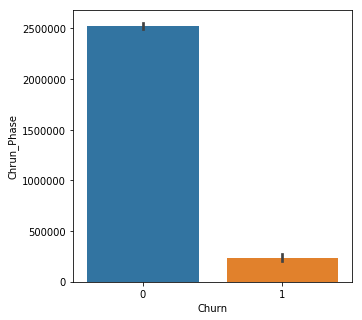

In [62]:
# Let us check the Chrun as the target with the other variables 
cont_cols = [col for col in Highvalu_users.columns if col not in ['Churn']]
for col in cont_cols:
    plt.figure(figsize=(5, 5))
    sns.barplot(x='Churn', y=col, data=Highvalu_users)
    plt.show()

### Inferences :

The Good phase we can see the chrun 1 is more compared to action phase.

The recharge days for the month of _6 that i.e., june churn is more compared to other recharge days. 

But the total revenue for the month of june is higher compared to other phases. 

The Total Amount recharge is lower in the Chrun phase compared to other phases of June, July and Aug months.

The roaming for the churn case for the month of june is high compared to other months.

The data 3g is less in june compared to other months. 


<Figure size 360x360 with 0 Axes>

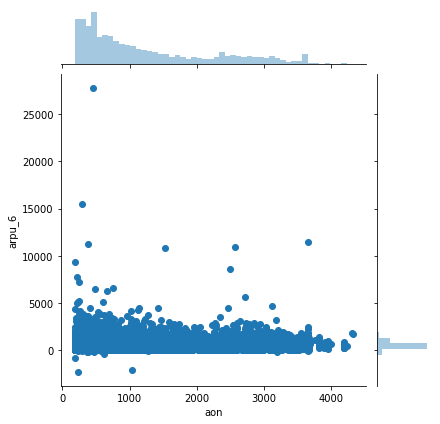

<Figure size 360x360 with 0 Axes>

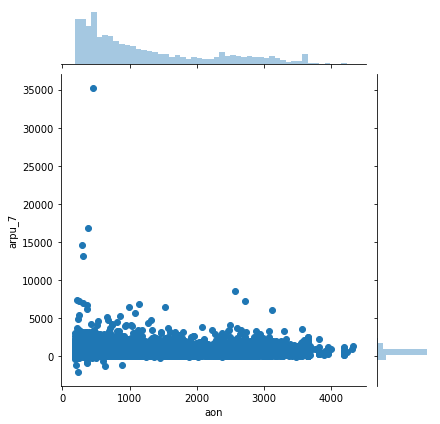

<Figure size 360x360 with 0 Axes>

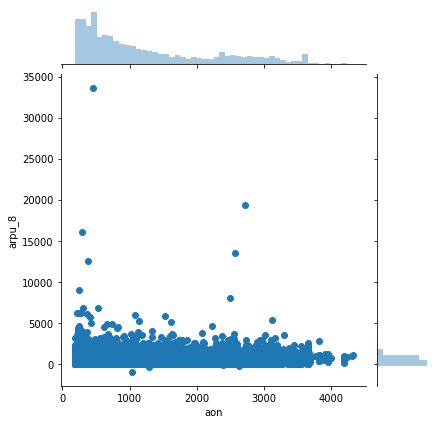

<Figure size 360x360 with 0 Axes>

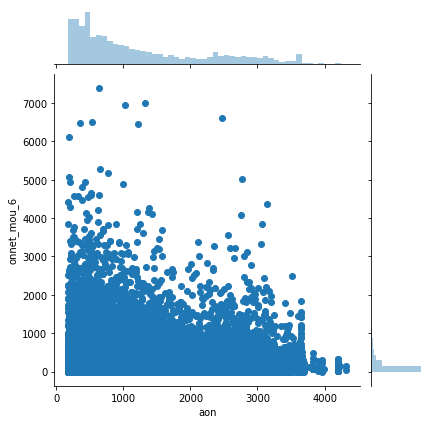

<Figure size 360x360 with 0 Axes>

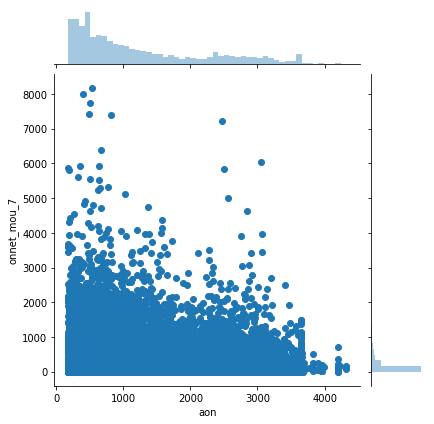

<Figure size 360x360 with 0 Axes>

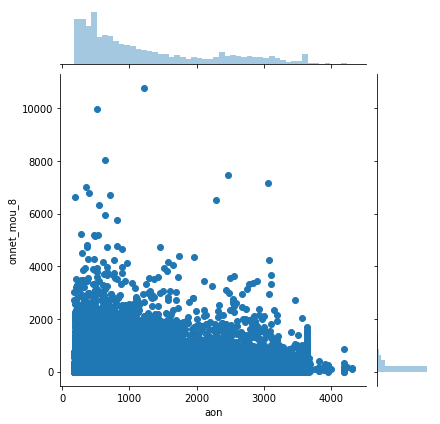

<Figure size 360x360 with 0 Axes>

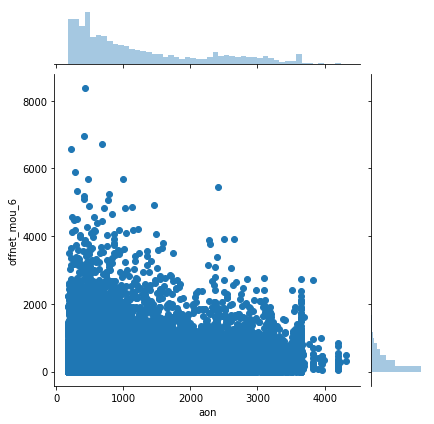

<Figure size 360x360 with 0 Axes>

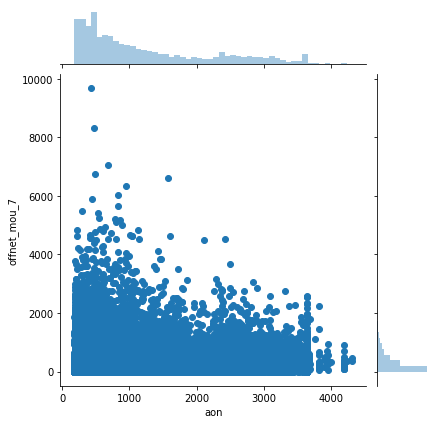

<Figure size 360x360 with 0 Axes>

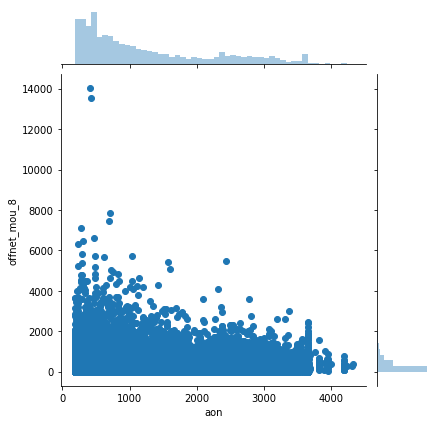

<Figure size 360x360 with 0 Axes>

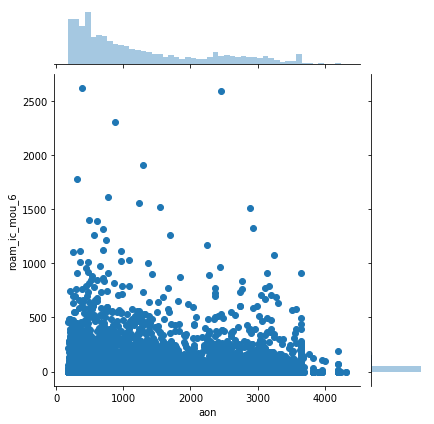

<Figure size 360x360 with 0 Axes>

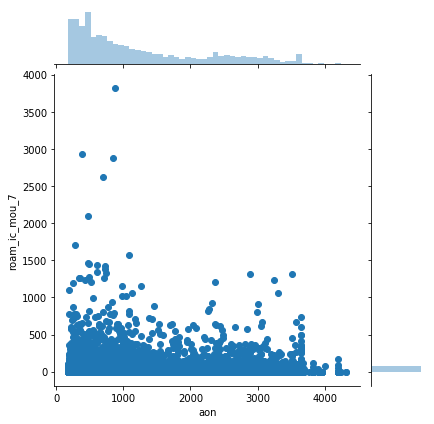

<Figure size 360x360 with 0 Axes>

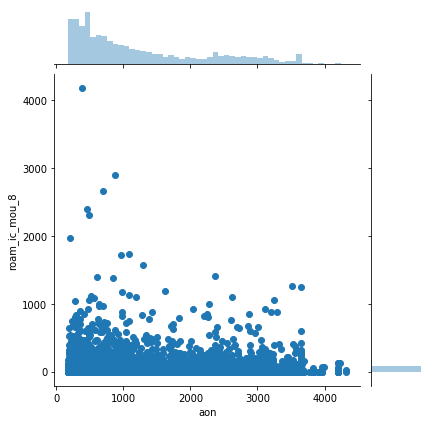

<Figure size 360x360 with 0 Axes>

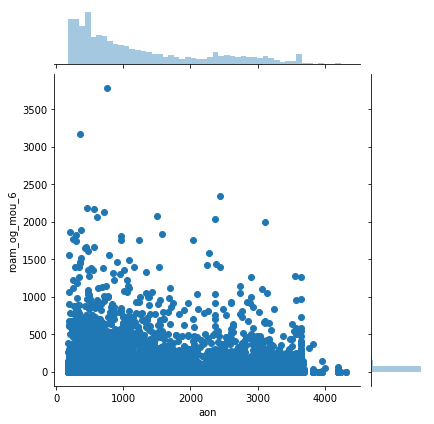

<Figure size 360x360 with 0 Axes>

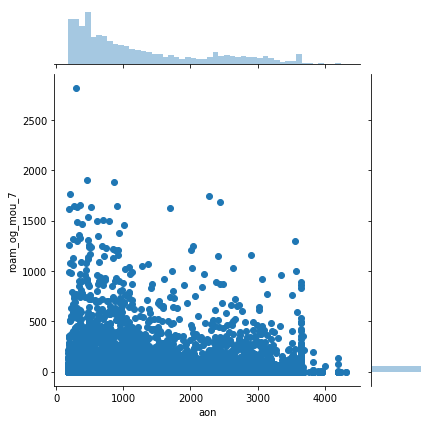

<Figure size 360x360 with 0 Axes>

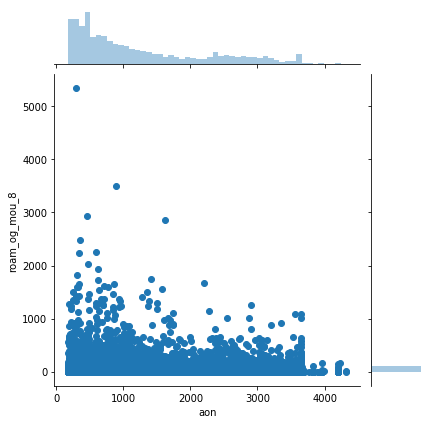

<Figure size 360x360 with 0 Axes>

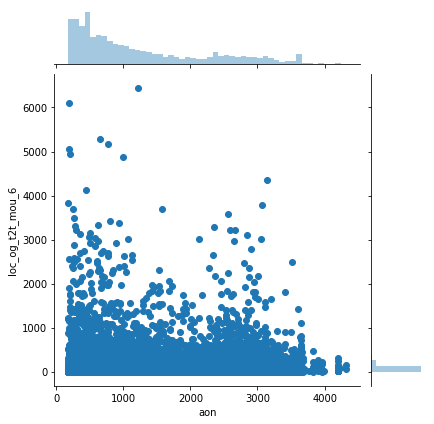

<Figure size 360x360 with 0 Axes>

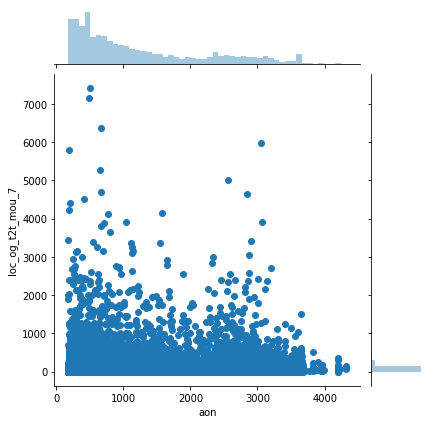

<Figure size 360x360 with 0 Axes>

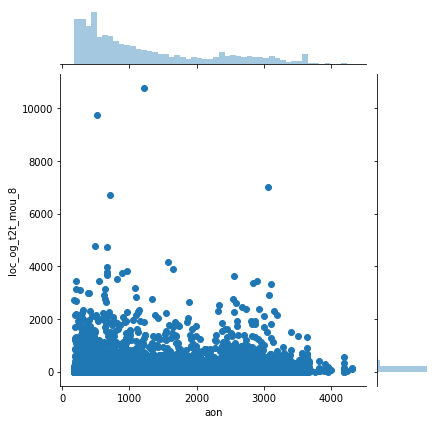

<Figure size 360x360 with 0 Axes>

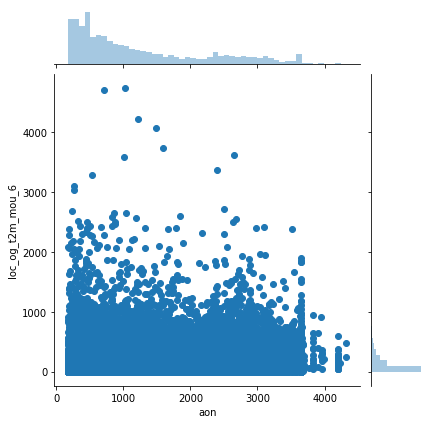

<Figure size 360x360 with 0 Axes>

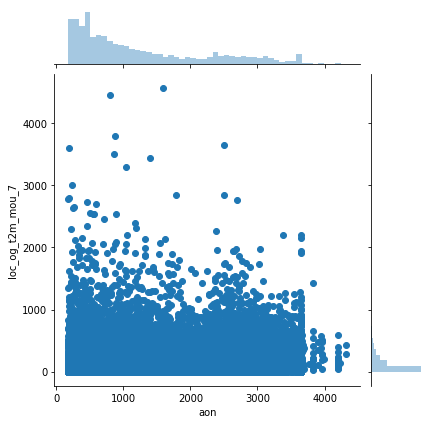

<Figure size 360x360 with 0 Axes>

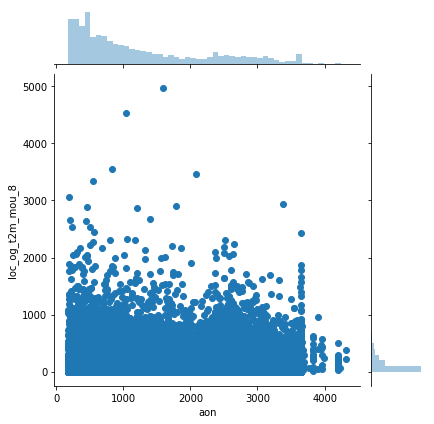

<Figure size 360x360 with 0 Axes>

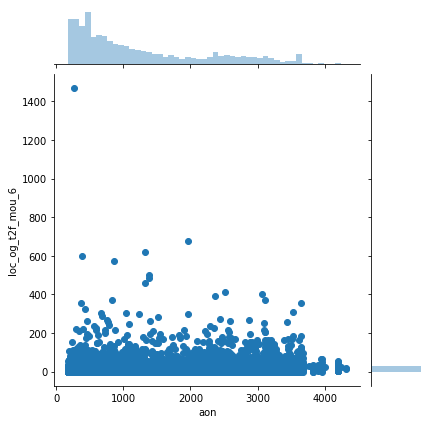

<Figure size 360x360 with 0 Axes>

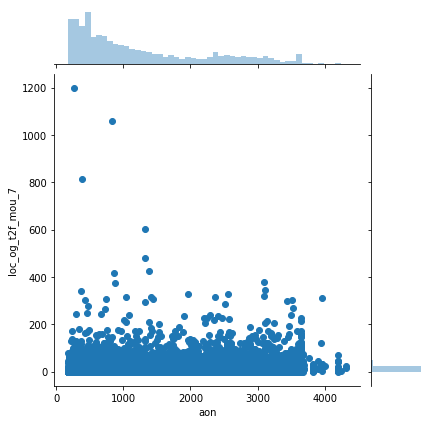

<Figure size 360x360 with 0 Axes>

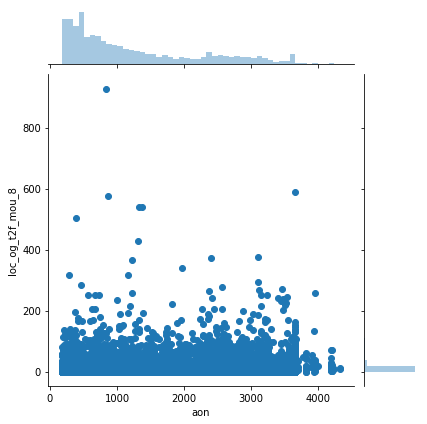

<Figure size 360x360 with 0 Axes>

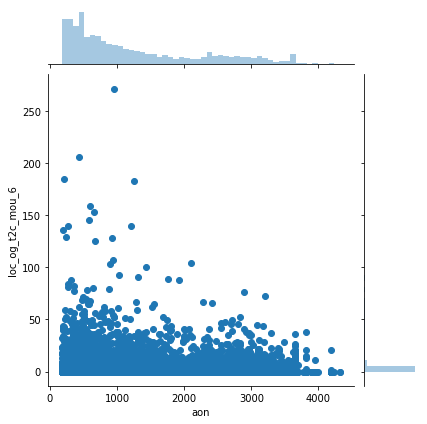

<Figure size 360x360 with 0 Axes>

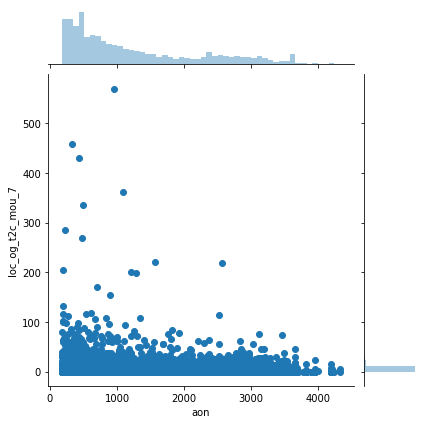

<Figure size 360x360 with 0 Axes>

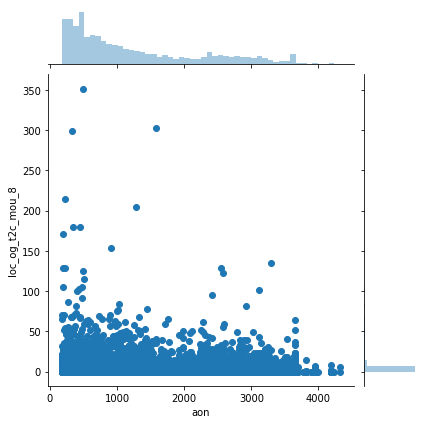

<Figure size 360x360 with 0 Axes>

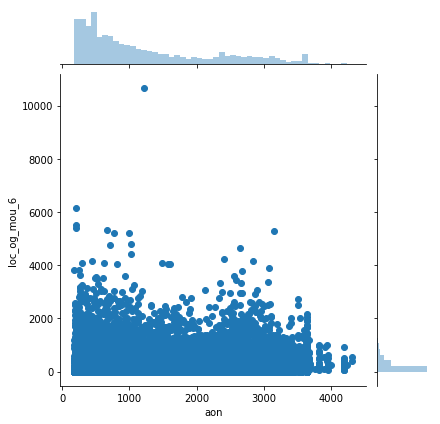

<Figure size 360x360 with 0 Axes>

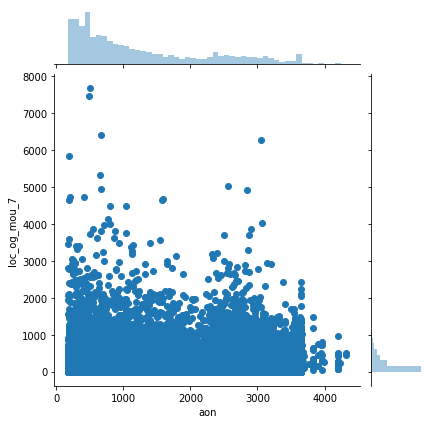

<Figure size 360x360 with 0 Axes>

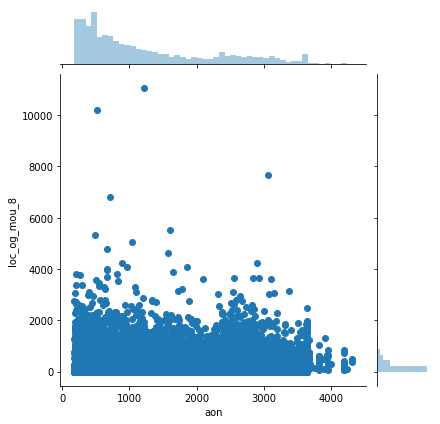

<Figure size 360x360 with 0 Axes>

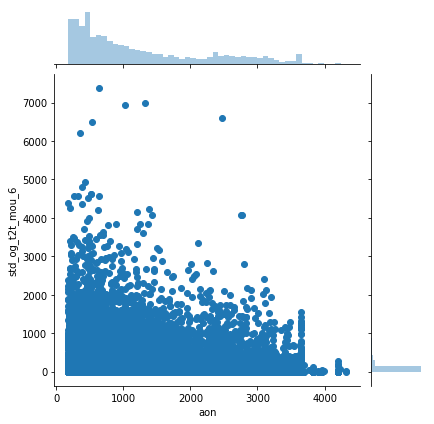

<Figure size 360x360 with 0 Axes>

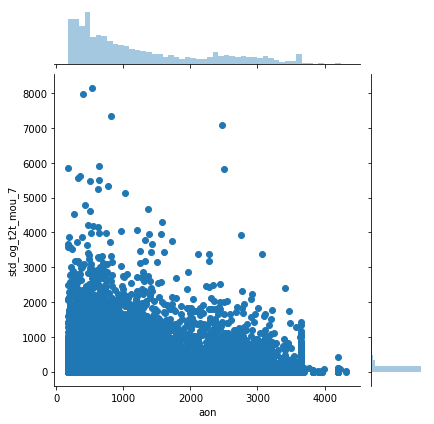

<Figure size 360x360 with 0 Axes>

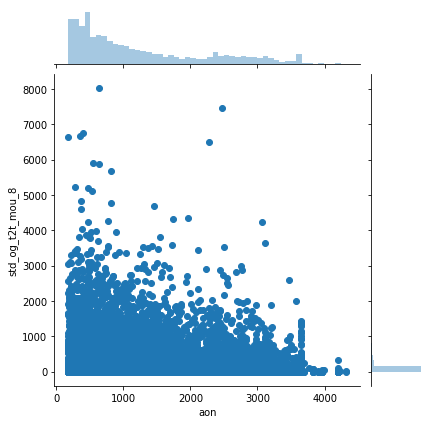

<Figure size 360x360 with 0 Axes>

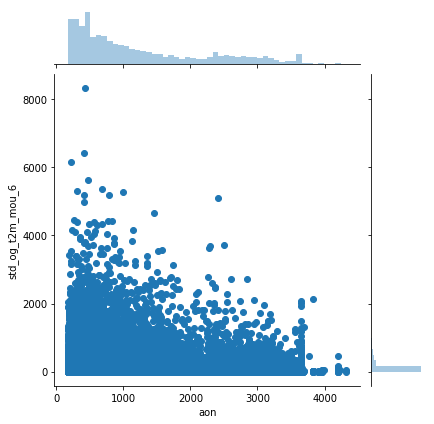

<Figure size 360x360 with 0 Axes>

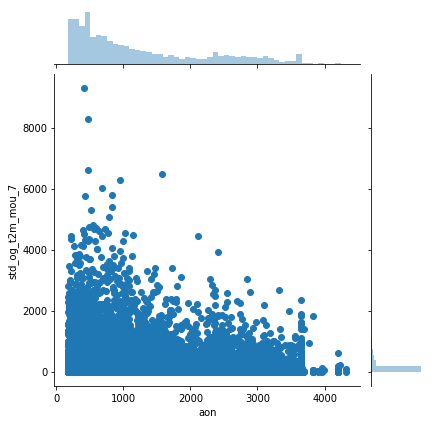

<Figure size 360x360 with 0 Axes>

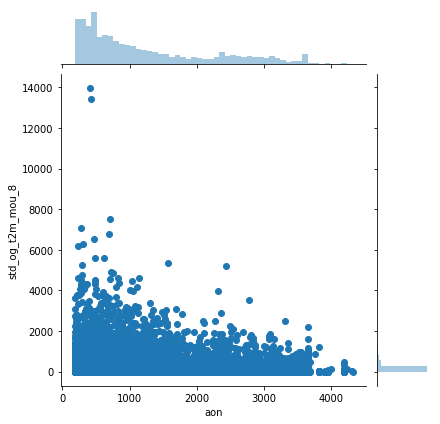

<Figure size 360x360 with 0 Axes>

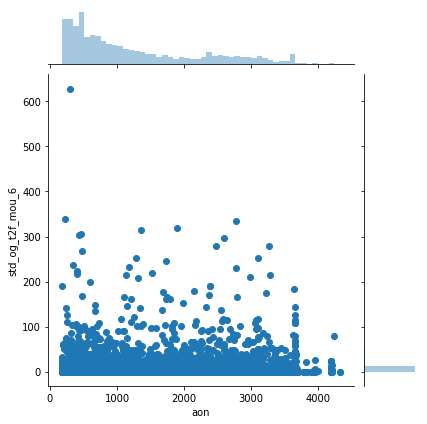

<Figure size 360x360 with 0 Axes>

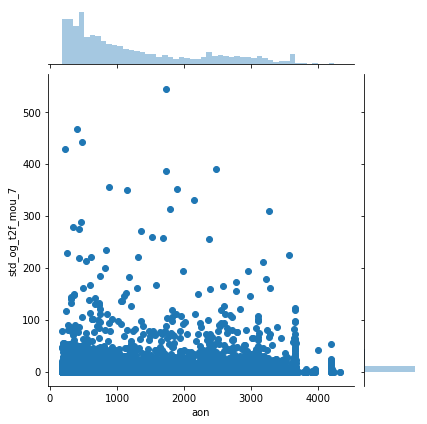

<Figure size 360x360 with 0 Axes>

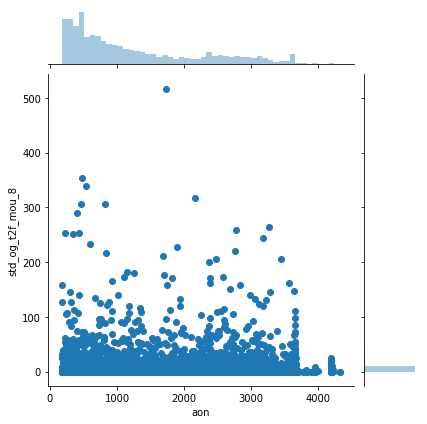

<Figure size 360x360 with 0 Axes>

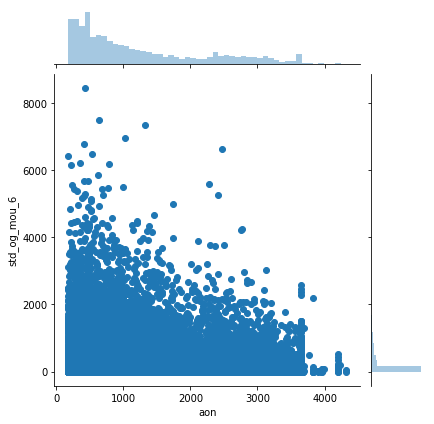

<Figure size 360x360 with 0 Axes>

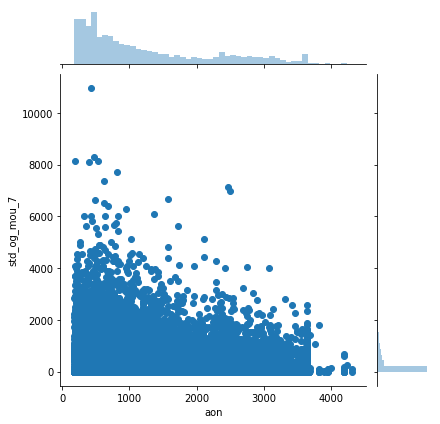

<Figure size 360x360 with 0 Axes>

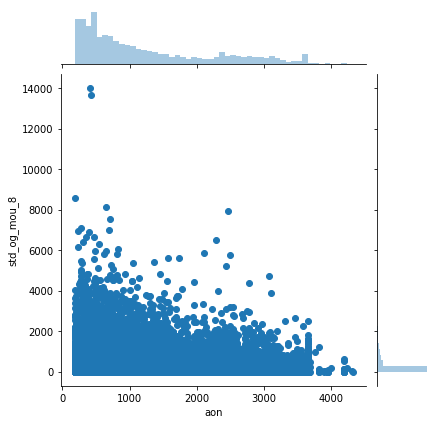

<Figure size 360x360 with 0 Axes>

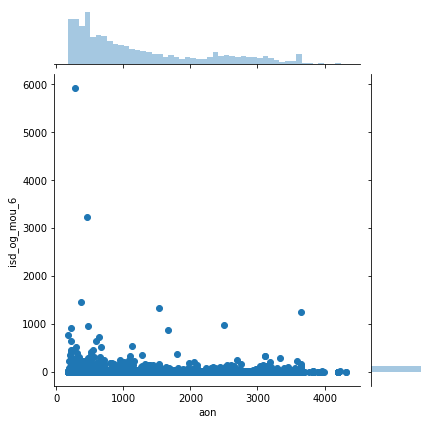

<Figure size 360x360 with 0 Axes>

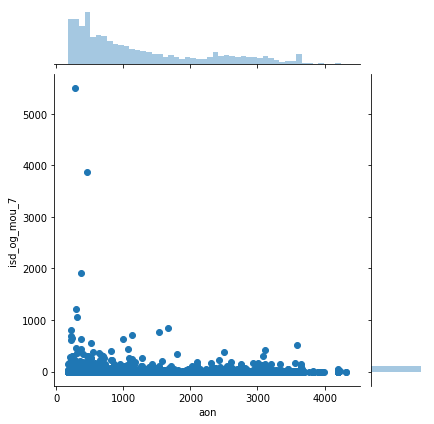

<Figure size 360x360 with 0 Axes>

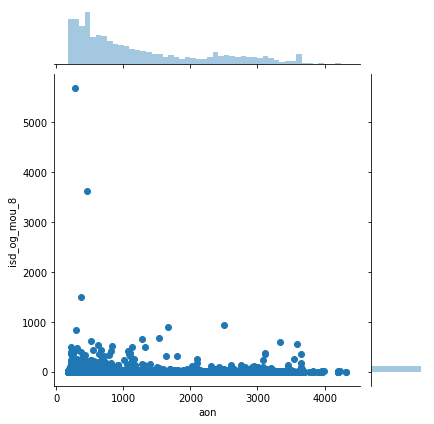

<Figure size 360x360 with 0 Axes>

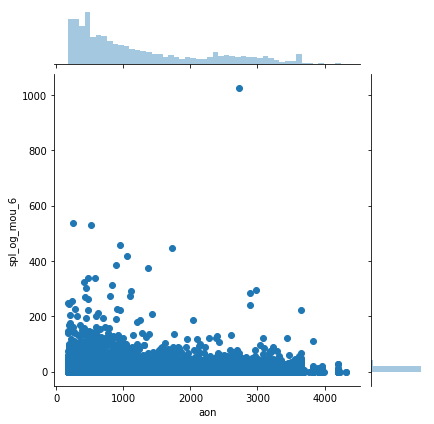

<Figure size 360x360 with 0 Axes>

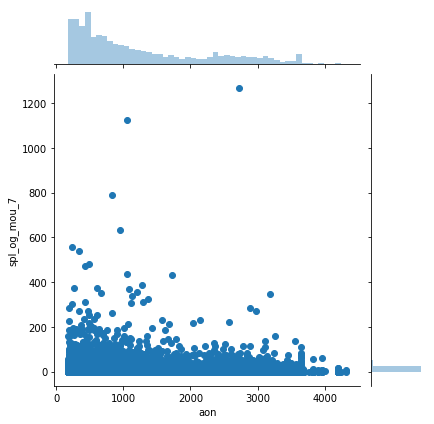

<Figure size 360x360 with 0 Axes>

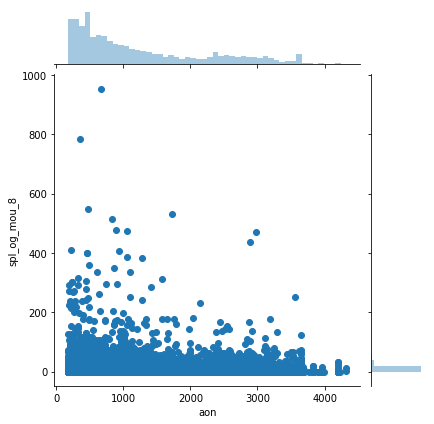

<Figure size 360x360 with 0 Axes>

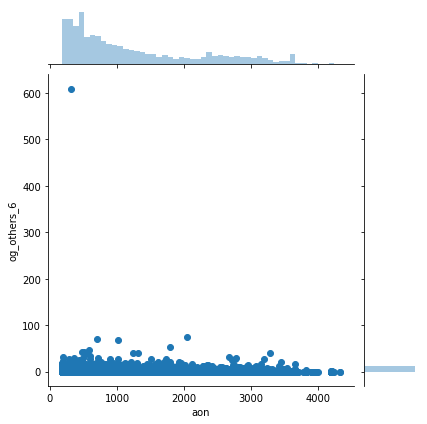

<Figure size 360x360 with 0 Axes>

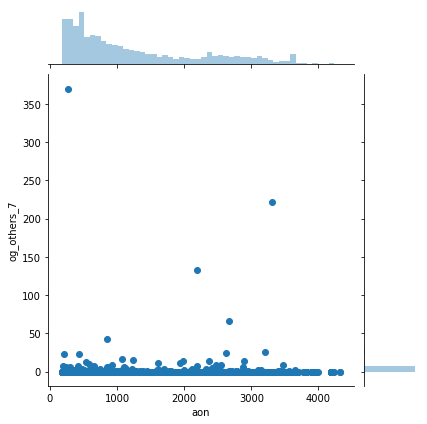

<Figure size 360x360 with 0 Axes>

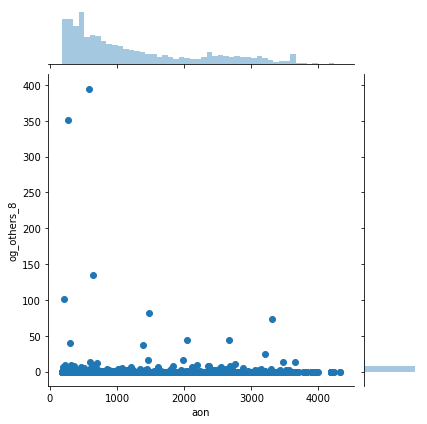

<Figure size 360x360 with 0 Axes>

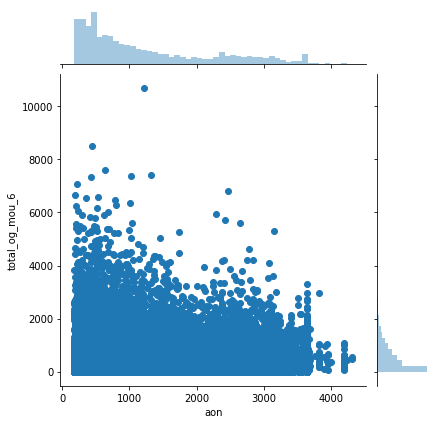

<Figure size 360x360 with 0 Axes>

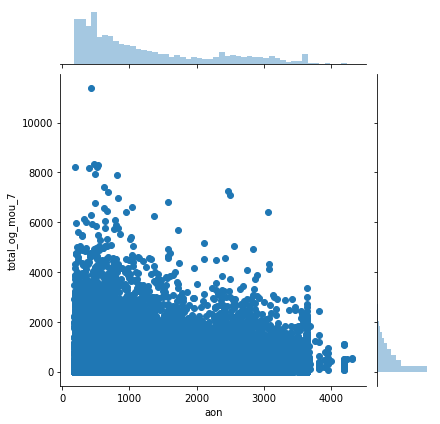

<Figure size 360x360 with 0 Axes>

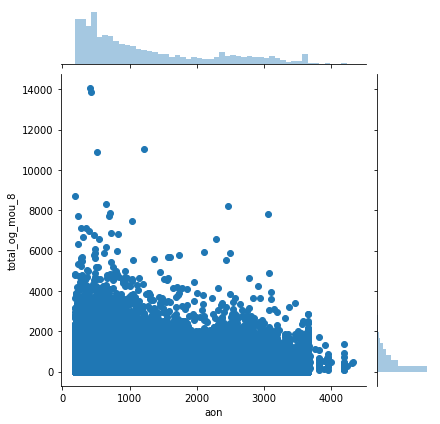

<Figure size 360x360 with 0 Axes>

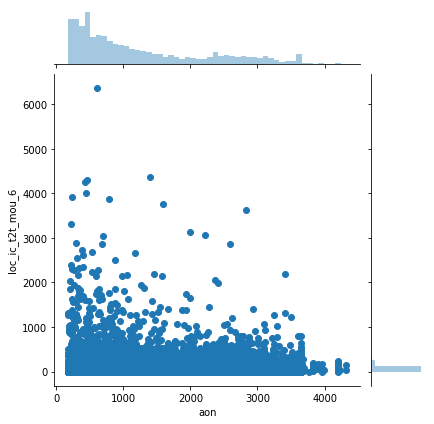

<Figure size 360x360 with 0 Axes>

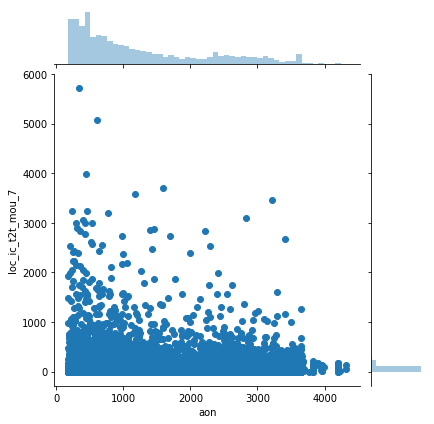

<Figure size 360x360 with 0 Axes>

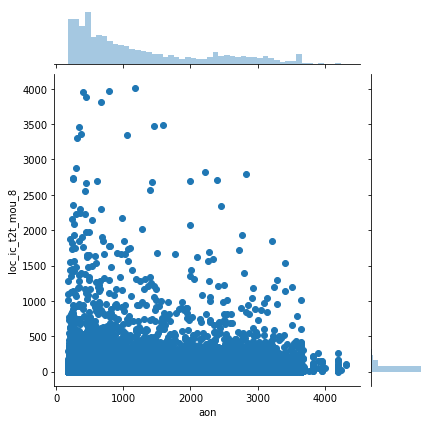

<Figure size 360x360 with 0 Axes>

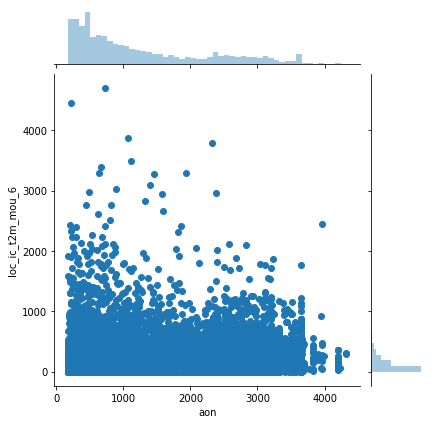

<Figure size 360x360 with 0 Axes>

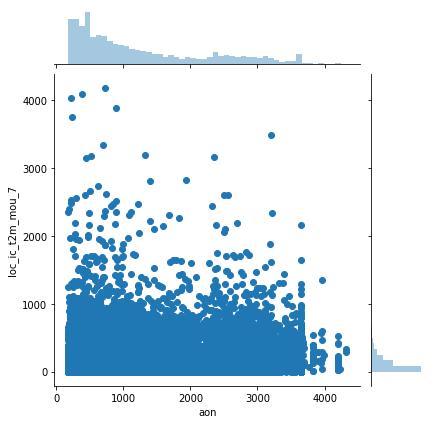

<Figure size 360x360 with 0 Axes>

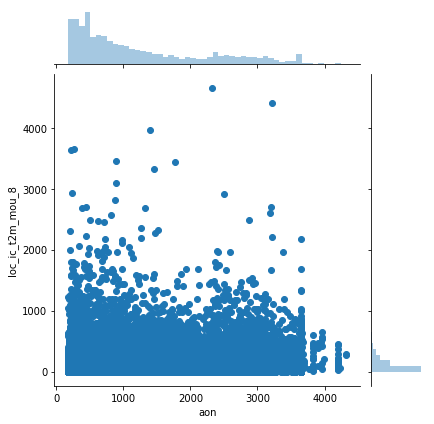

<Figure size 360x360 with 0 Axes>

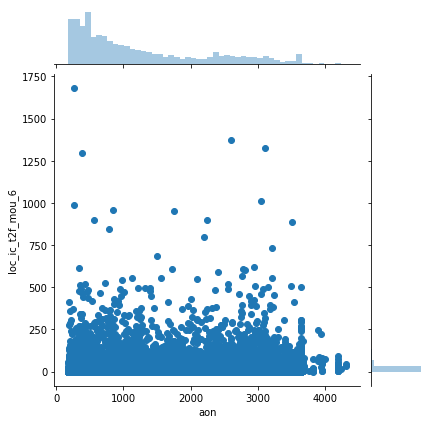

<Figure size 360x360 with 0 Axes>

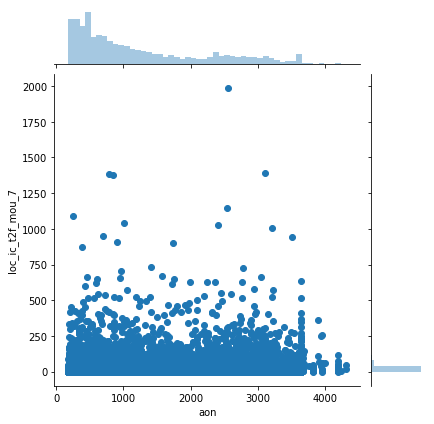

<Figure size 360x360 with 0 Axes>

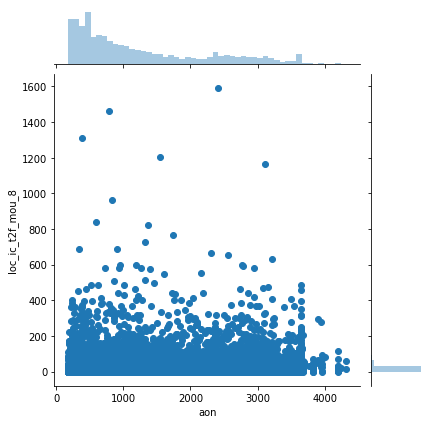

<Figure size 360x360 with 0 Axes>

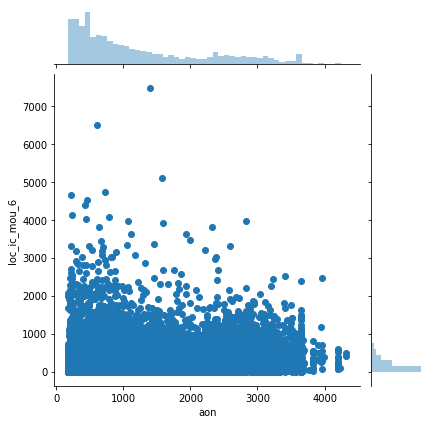

<Figure size 360x360 with 0 Axes>

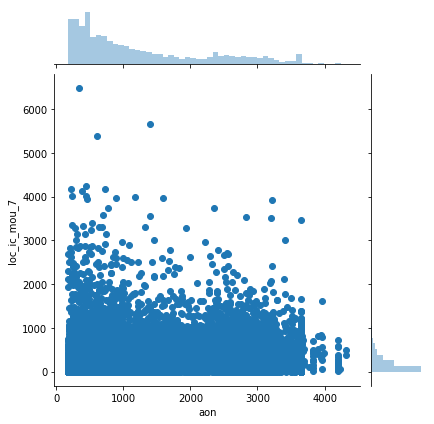

<Figure size 360x360 with 0 Axes>

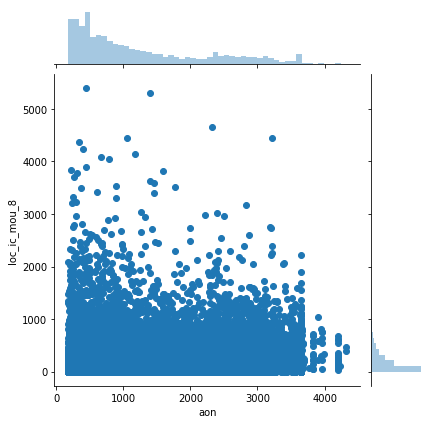

<Figure size 360x360 with 0 Axes>

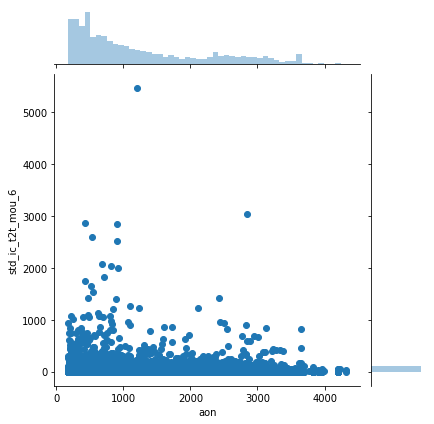

<Figure size 360x360 with 0 Axes>

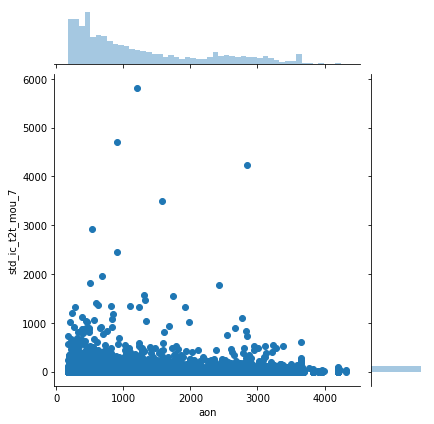

<Figure size 360x360 with 0 Axes>

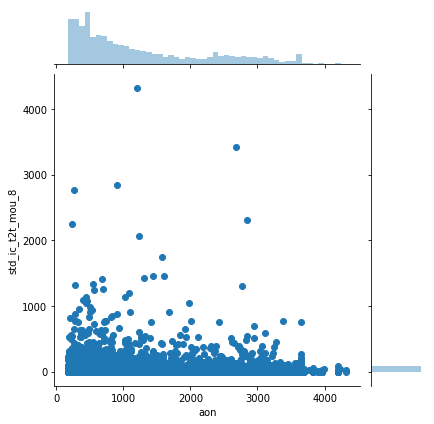

<Figure size 360x360 with 0 Axes>

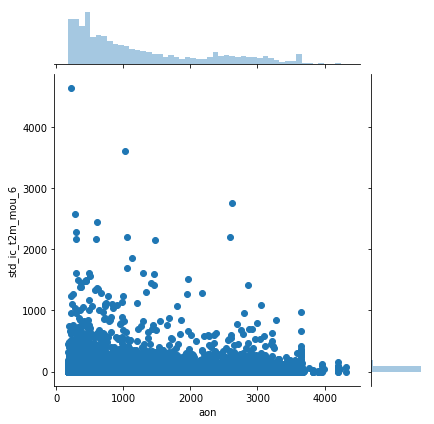

<Figure size 360x360 with 0 Axes>

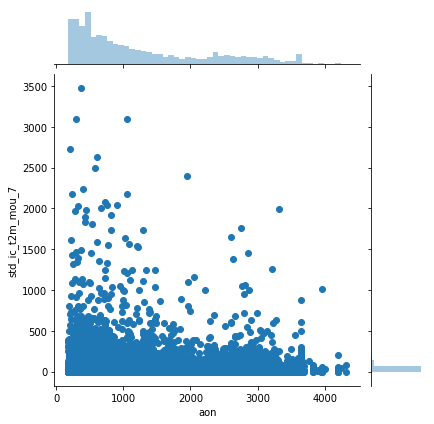

<Figure size 360x360 with 0 Axes>

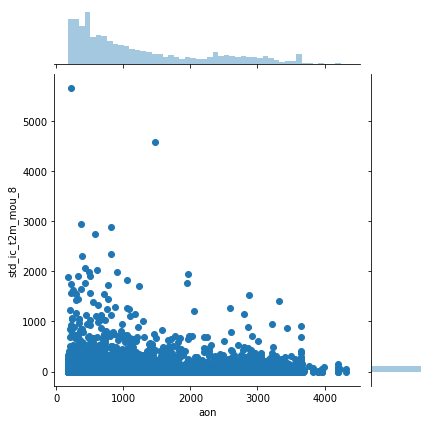

<Figure size 360x360 with 0 Axes>

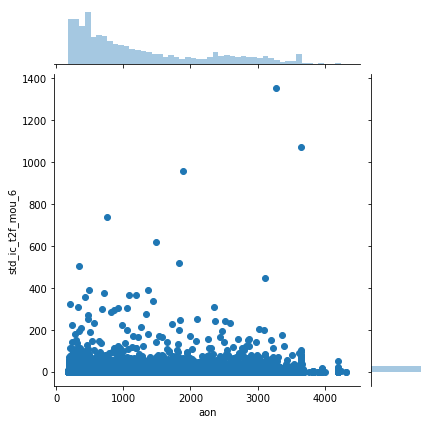

<Figure size 360x360 with 0 Axes>

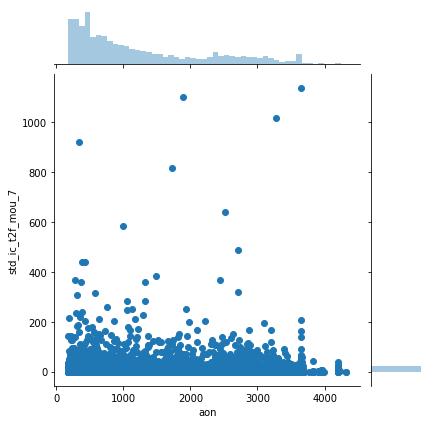

<Figure size 360x360 with 0 Axes>

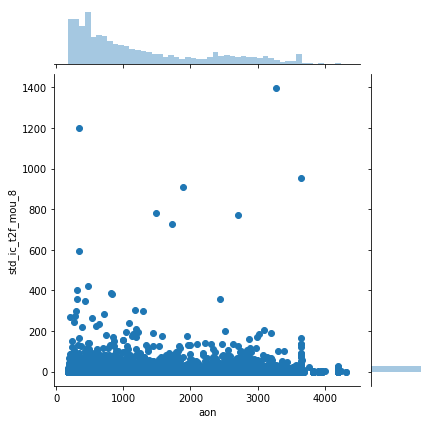

<Figure size 360x360 with 0 Axes>

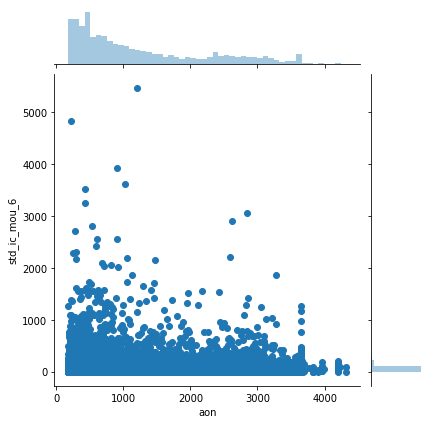

<Figure size 360x360 with 0 Axes>

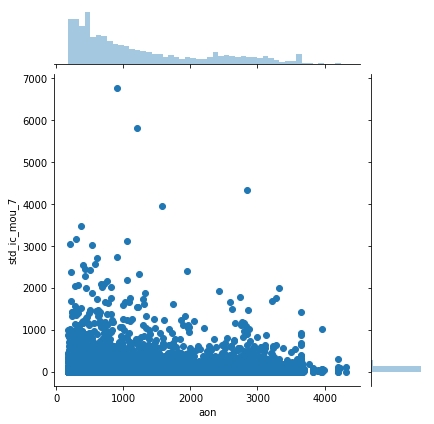

<Figure size 360x360 with 0 Axes>

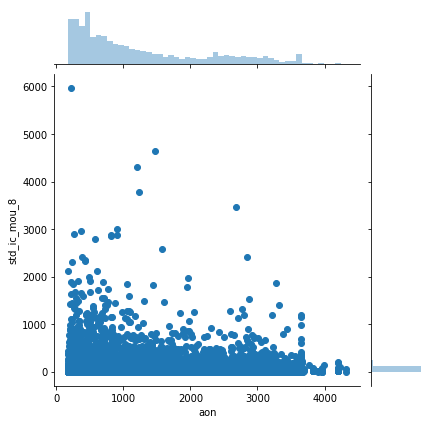

<Figure size 360x360 with 0 Axes>

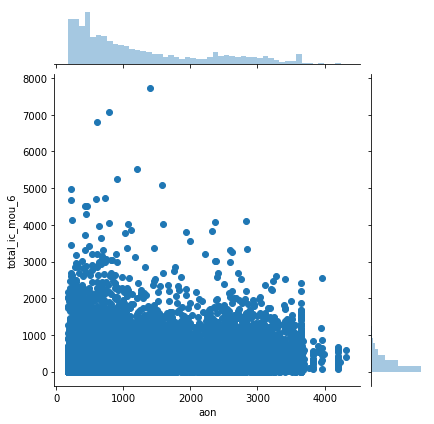

<Figure size 360x360 with 0 Axes>

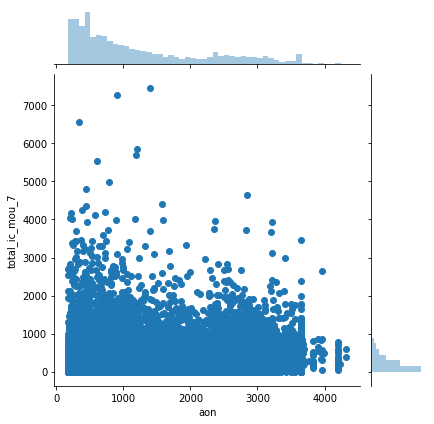

<Figure size 360x360 with 0 Axes>

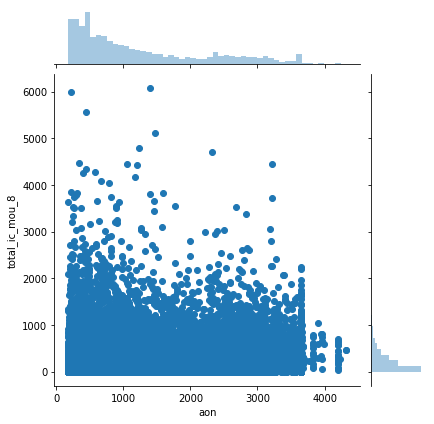

<Figure size 360x360 with 0 Axes>

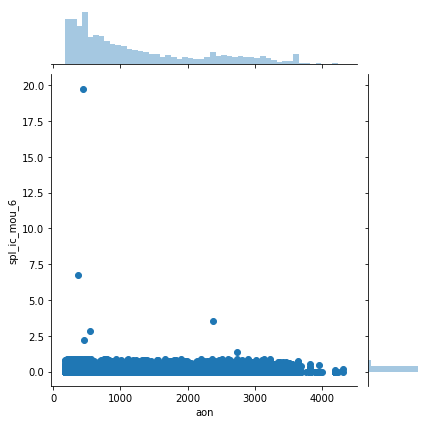

<Figure size 360x360 with 0 Axes>

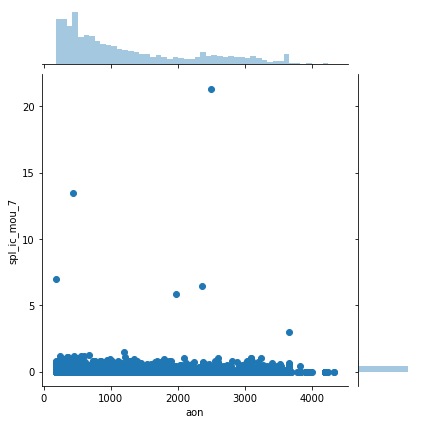

<Figure size 360x360 with 0 Axes>

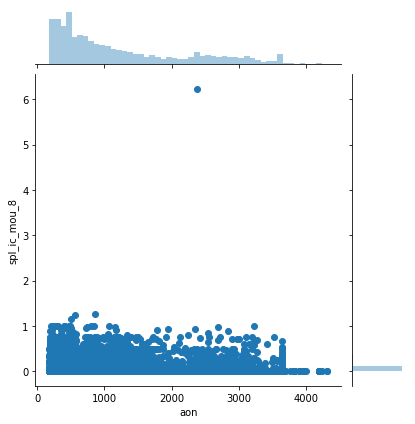

<Figure size 360x360 with 0 Axes>

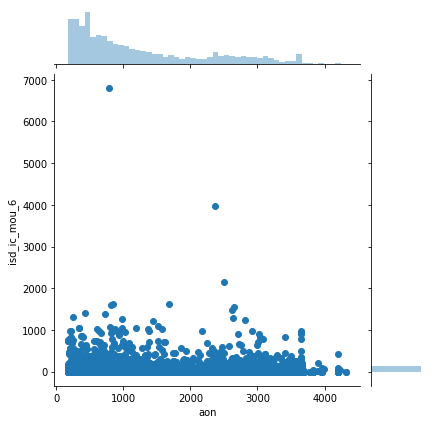

<Figure size 360x360 with 0 Axes>

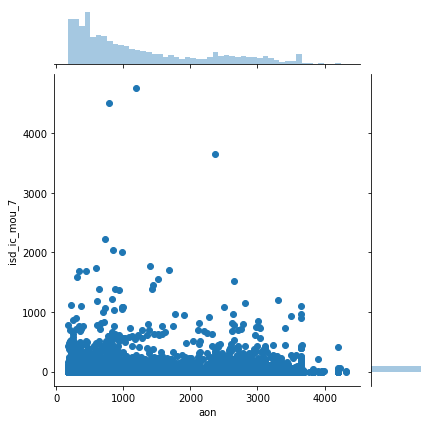

<Figure size 360x360 with 0 Axes>

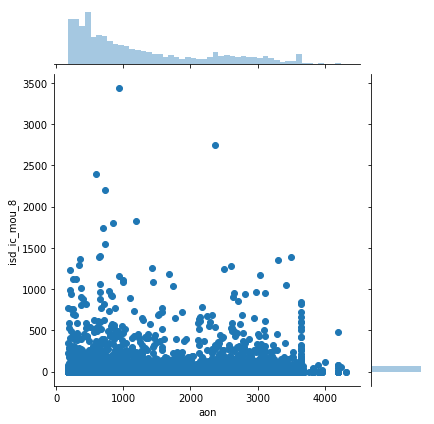

<Figure size 360x360 with 0 Axes>

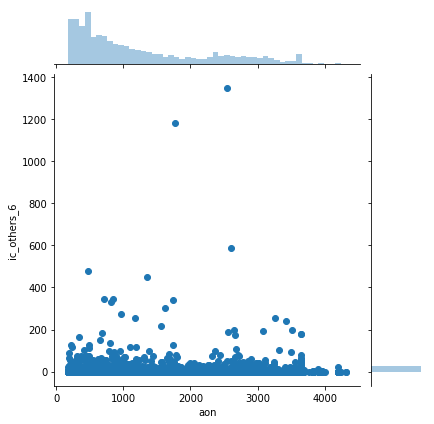

<Figure size 360x360 with 0 Axes>

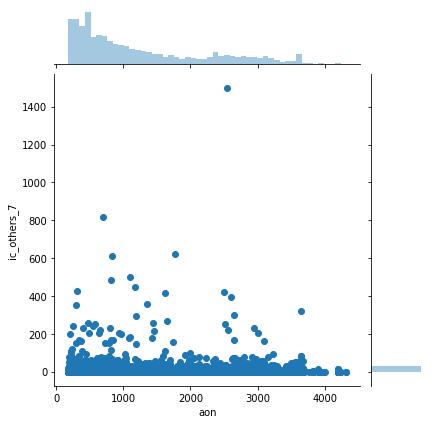

<Figure size 360x360 with 0 Axes>

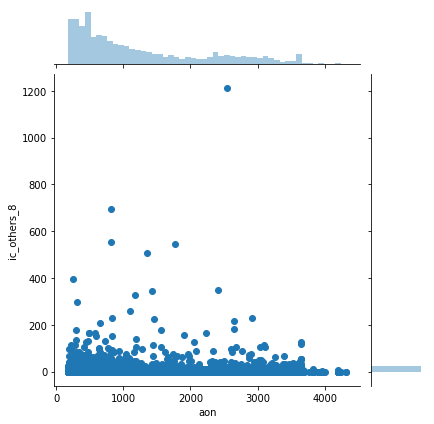

<Figure size 360x360 with 0 Axes>

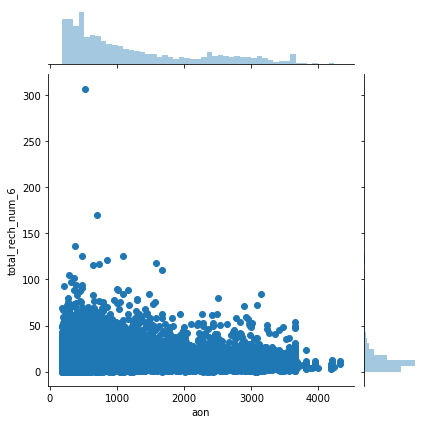

<Figure size 360x360 with 0 Axes>

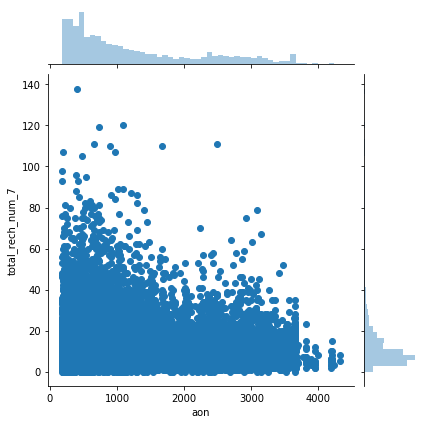

<Figure size 360x360 with 0 Axes>

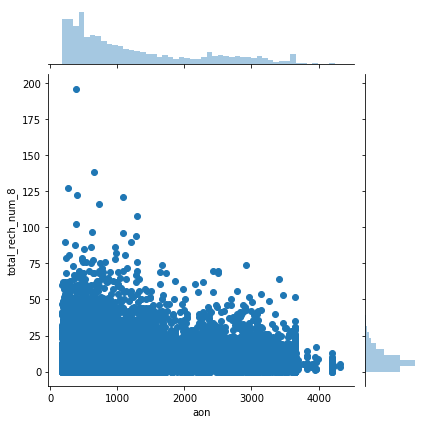

<Figure size 360x360 with 0 Axes>

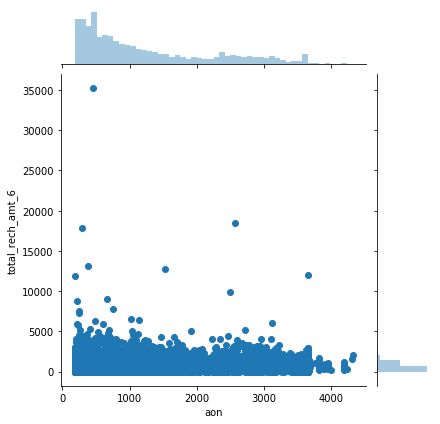

<Figure size 360x360 with 0 Axes>

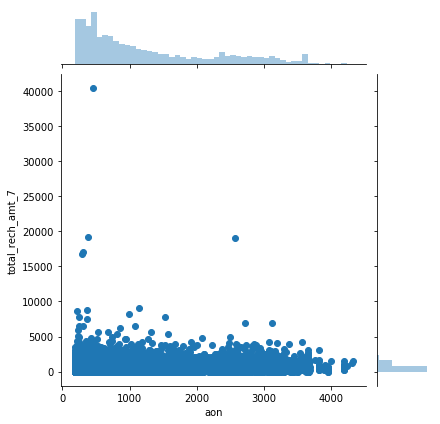

<Figure size 360x360 with 0 Axes>

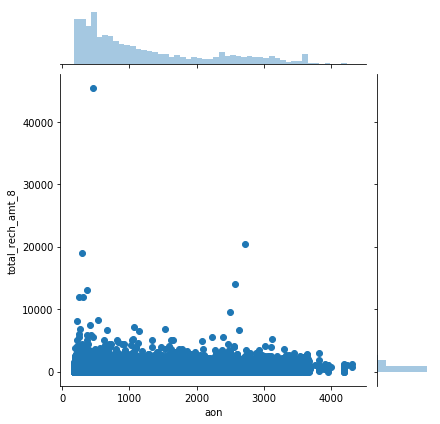

<Figure size 360x360 with 0 Axes>

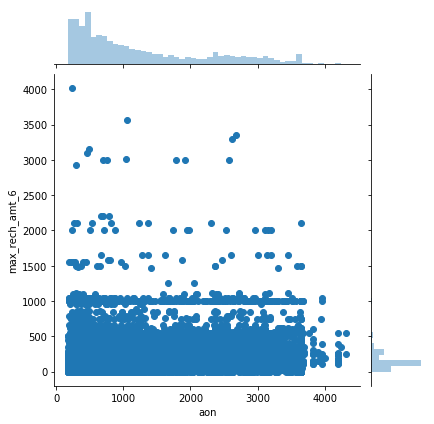

<Figure size 360x360 with 0 Axes>

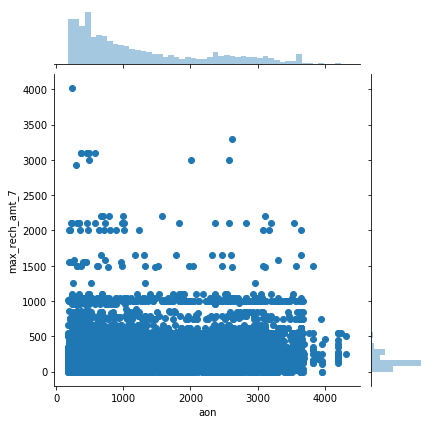

<Figure size 360x360 with 0 Axes>

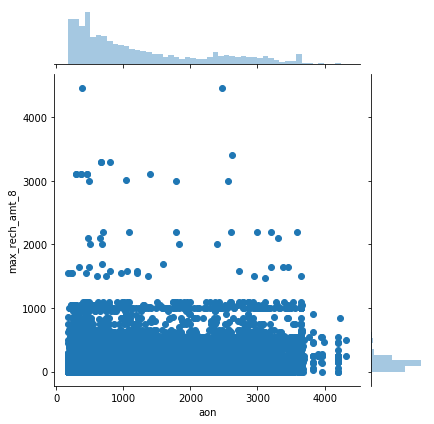

<Figure size 360x360 with 0 Axes>

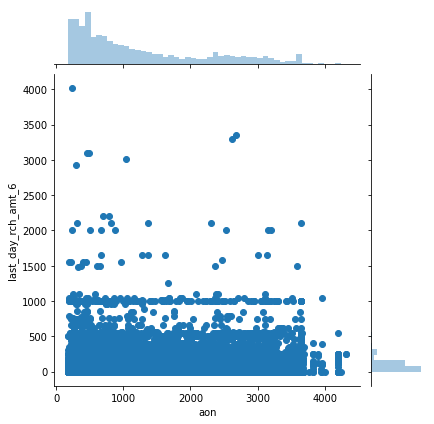

<Figure size 360x360 with 0 Axes>

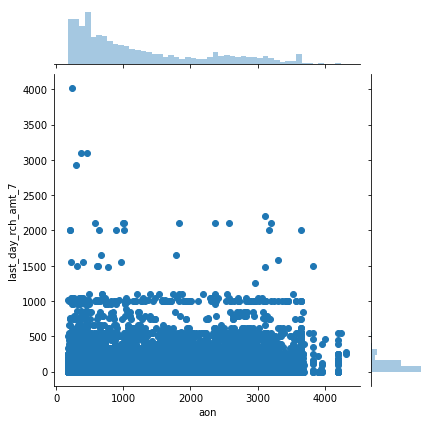

<Figure size 360x360 with 0 Axes>

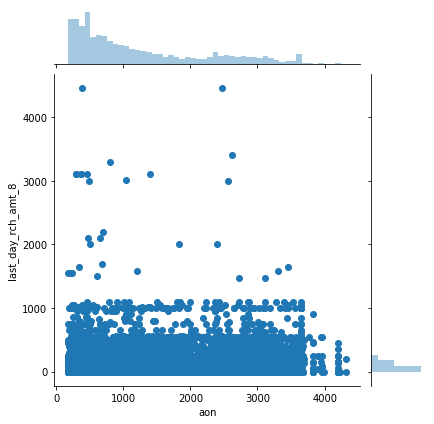

<Figure size 360x360 with 0 Axes>

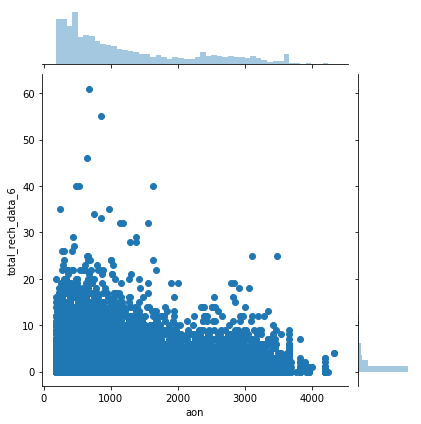

<Figure size 360x360 with 0 Axes>

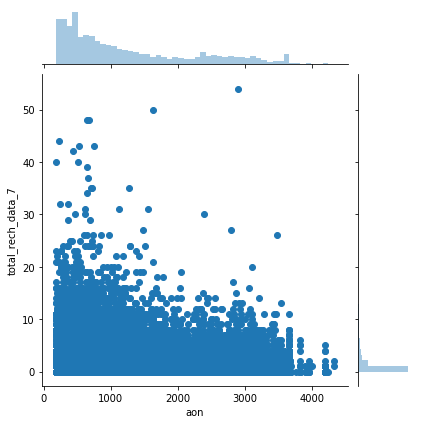

<Figure size 360x360 with 0 Axes>

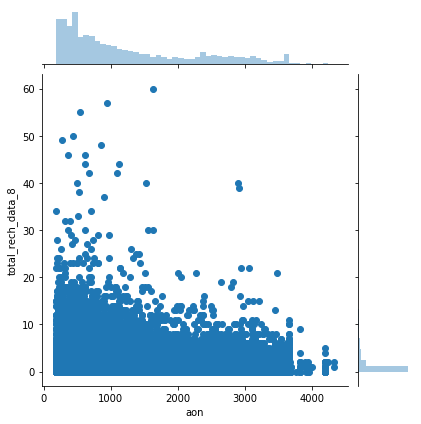

<Figure size 360x360 with 0 Axes>

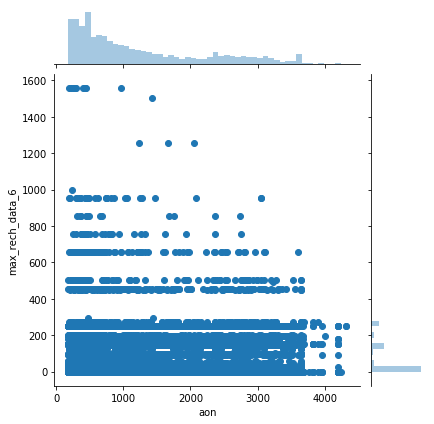

<Figure size 360x360 with 0 Axes>

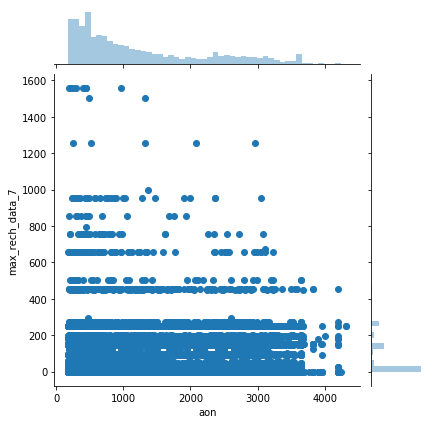

<Figure size 360x360 with 0 Axes>

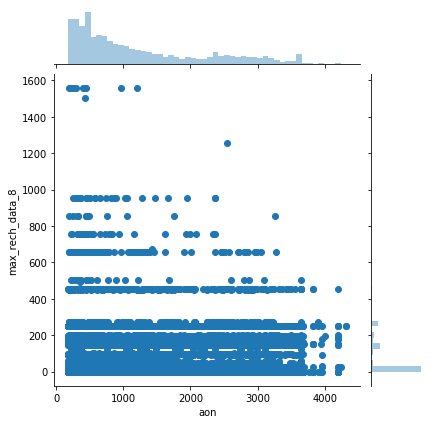

<Figure size 360x360 with 0 Axes>

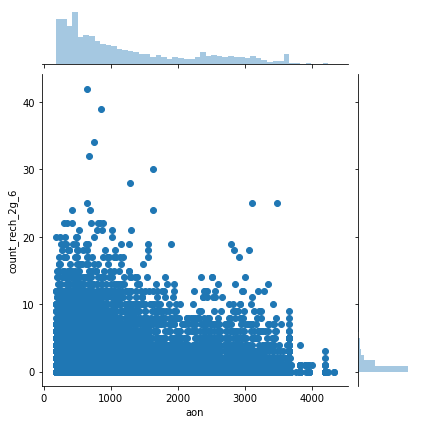

<Figure size 360x360 with 0 Axes>

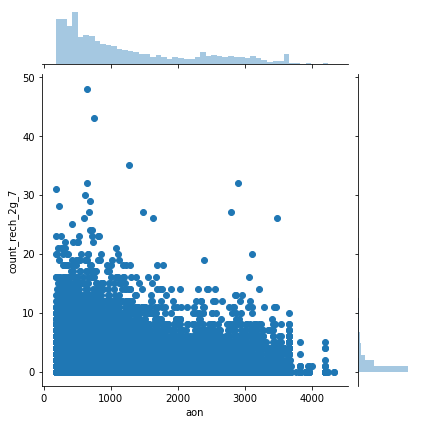

<Figure size 360x360 with 0 Axes>

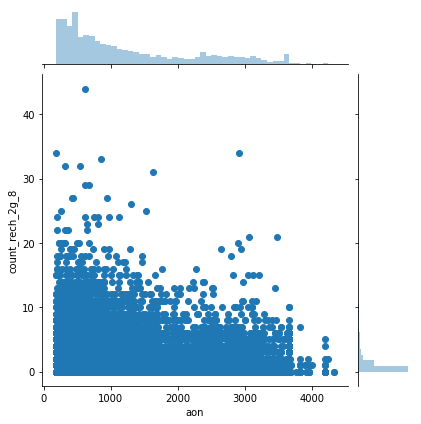

<Figure size 360x360 with 0 Axes>

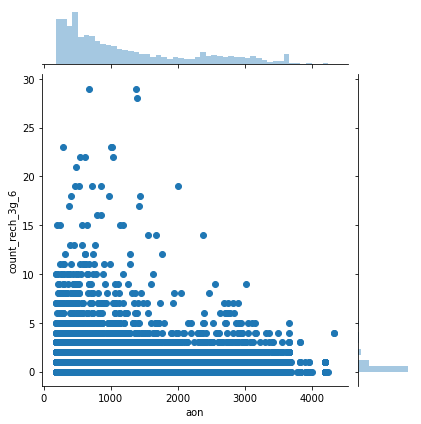

<Figure size 360x360 with 0 Axes>

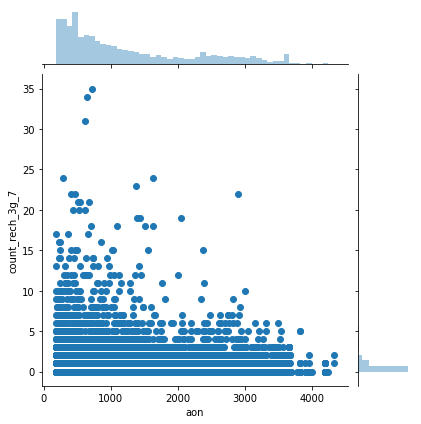

<Figure size 360x360 with 0 Axes>

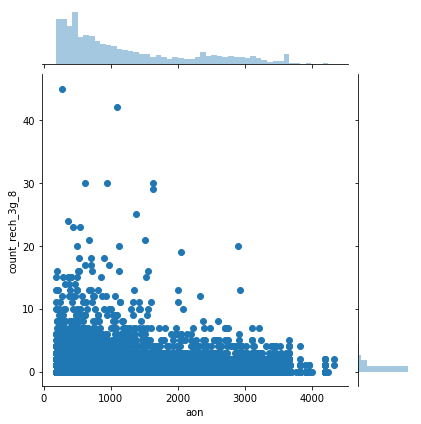

<Figure size 360x360 with 0 Axes>

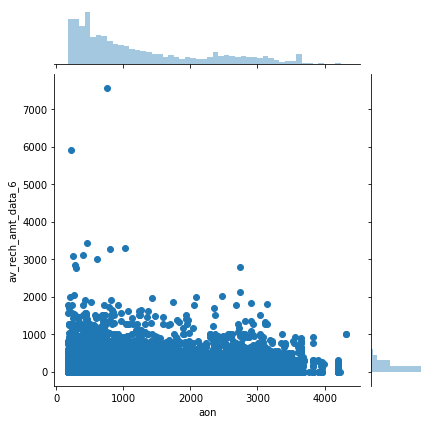

<Figure size 360x360 with 0 Axes>

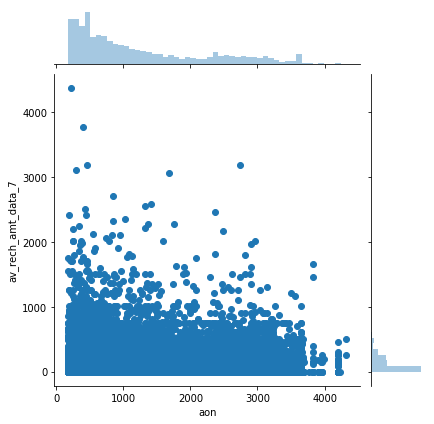

<Figure size 360x360 with 0 Axes>

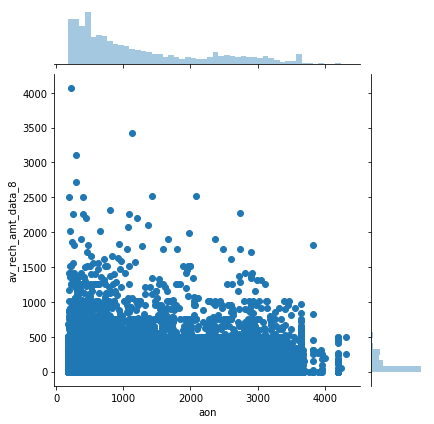

<Figure size 360x360 with 0 Axes>

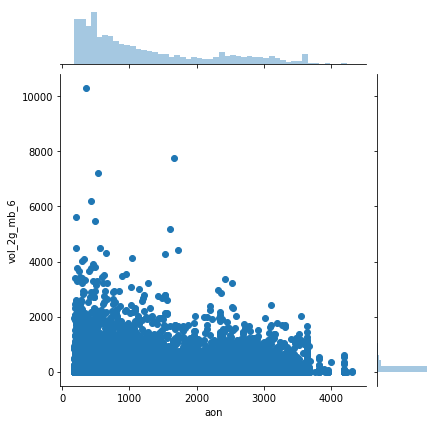

<Figure size 360x360 with 0 Axes>

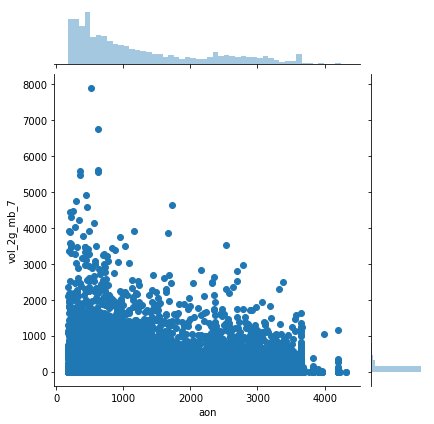

<Figure size 360x360 with 0 Axes>

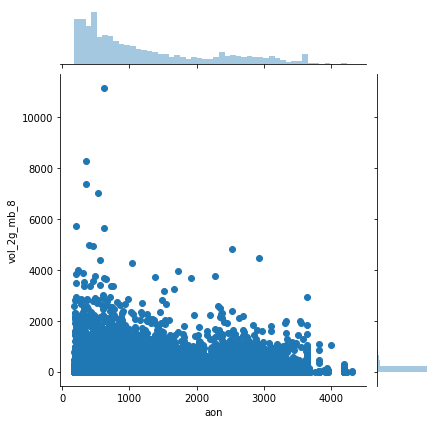

<Figure size 360x360 with 0 Axes>

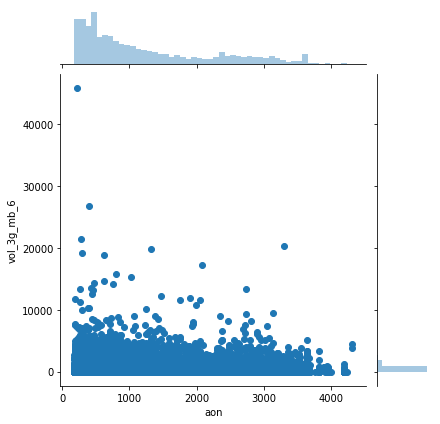

<Figure size 360x360 with 0 Axes>

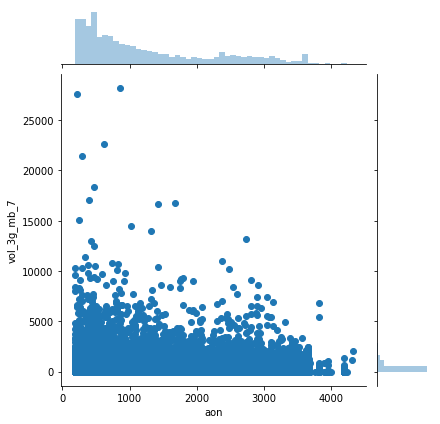

<Figure size 360x360 with 0 Axes>

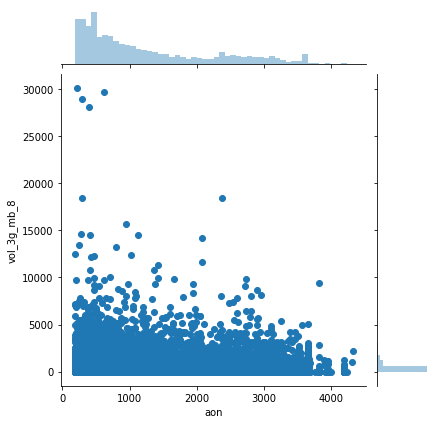

<Figure size 360x360 with 0 Axes>

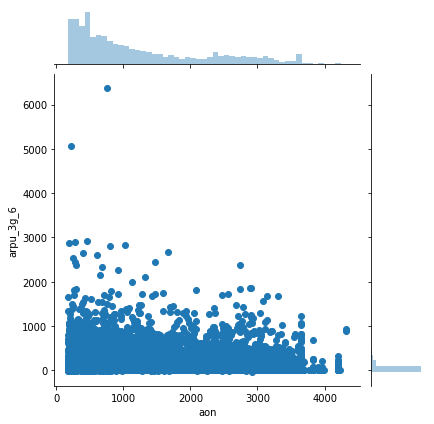

<Figure size 360x360 with 0 Axes>

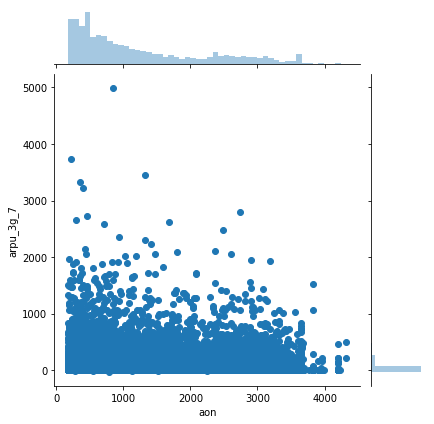

<Figure size 360x360 with 0 Axes>

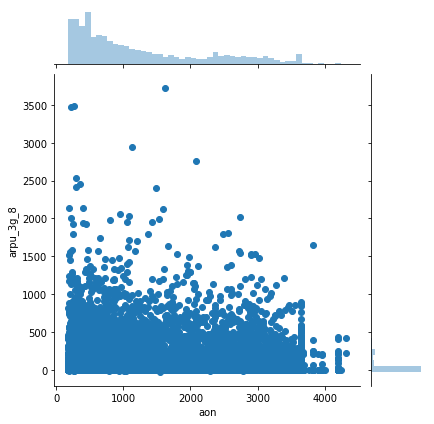

<Figure size 360x360 with 0 Axes>

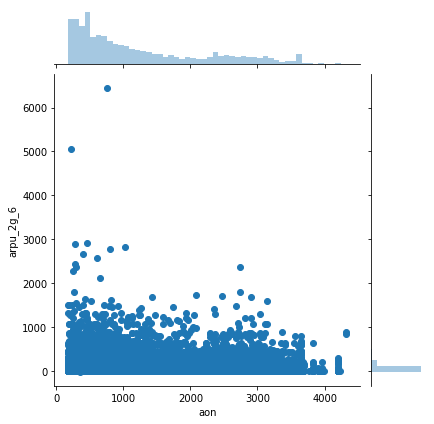

<Figure size 360x360 with 0 Axes>

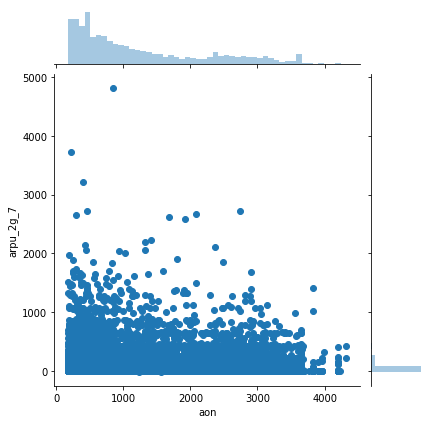

<Figure size 360x360 with 0 Axes>

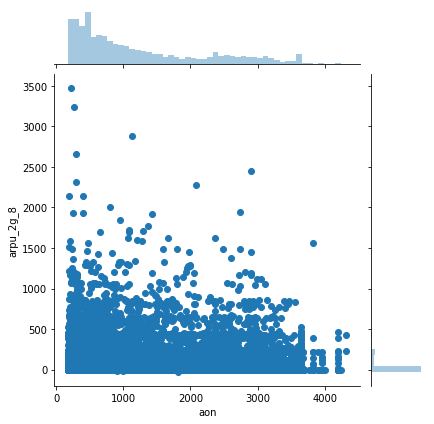

<Figure size 360x360 with 0 Axes>

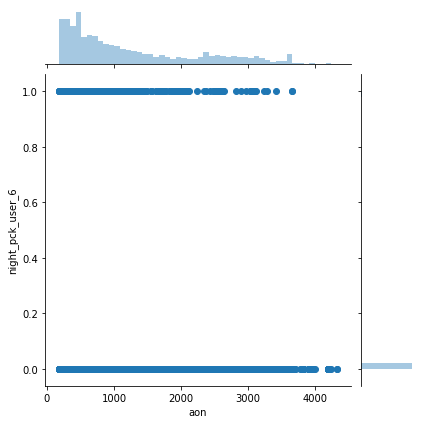

<Figure size 360x360 with 0 Axes>

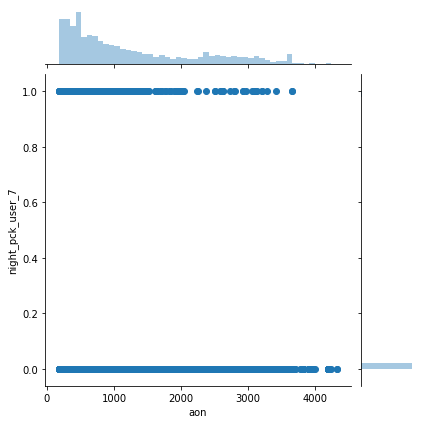

<Figure size 360x360 with 0 Axes>

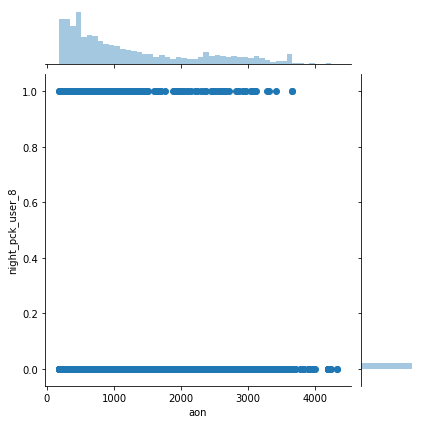

<Figure size 360x360 with 0 Axes>

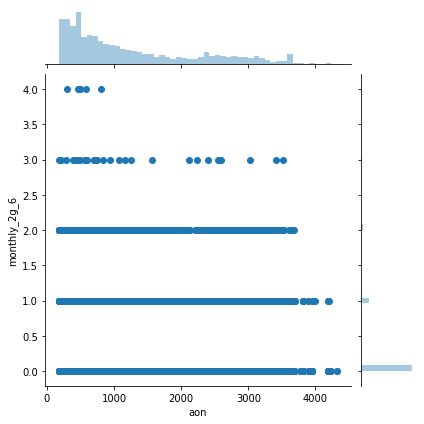

<Figure size 360x360 with 0 Axes>

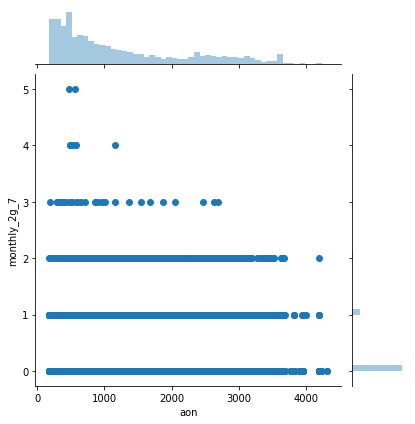

<Figure size 360x360 with 0 Axes>

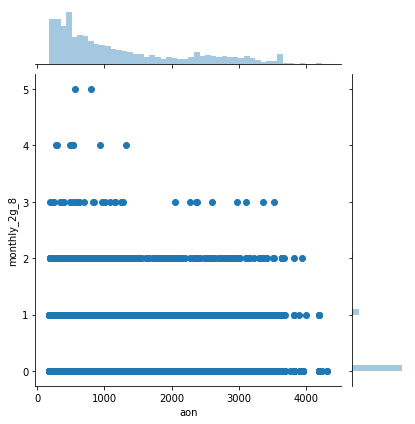

<Figure size 360x360 with 0 Axes>

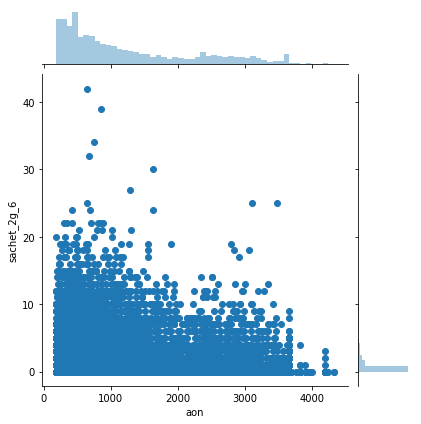

<Figure size 360x360 with 0 Axes>

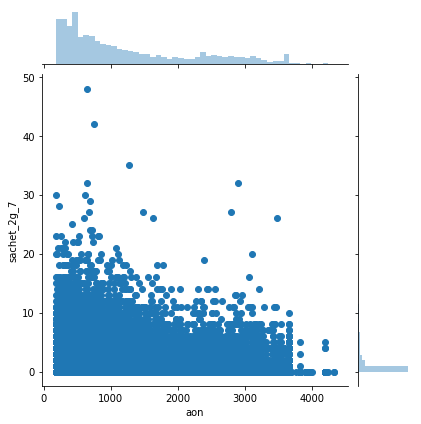

<Figure size 360x360 with 0 Axes>

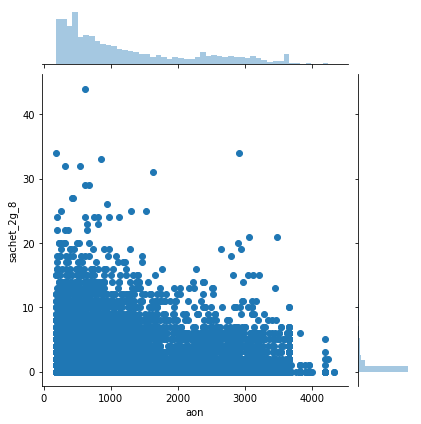

<Figure size 360x360 with 0 Axes>

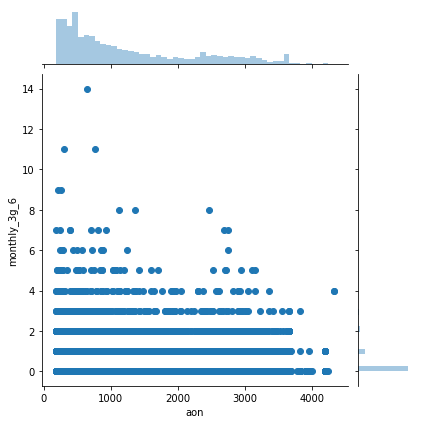

<Figure size 360x360 with 0 Axes>

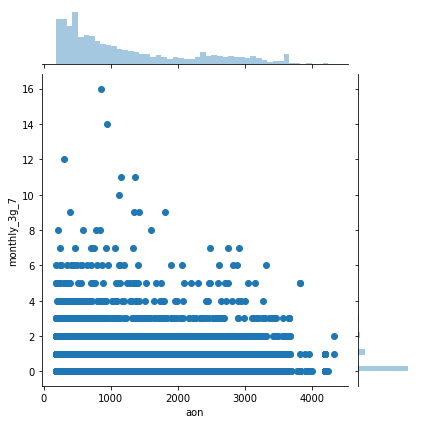

<Figure size 360x360 with 0 Axes>

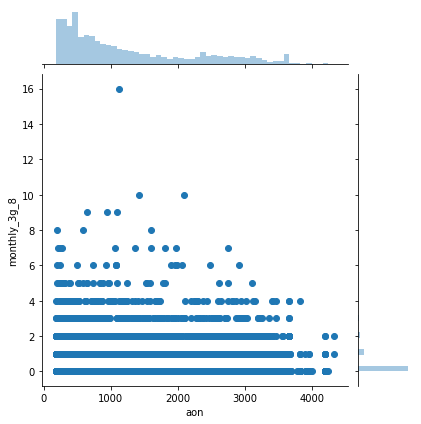

<Figure size 360x360 with 0 Axes>

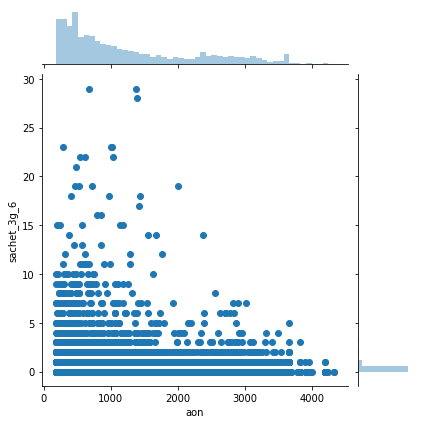

<Figure size 360x360 with 0 Axes>

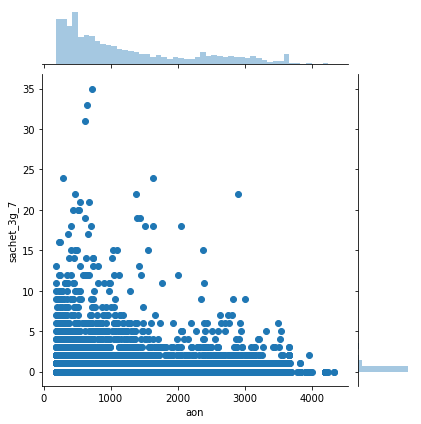

<Figure size 360x360 with 0 Axes>

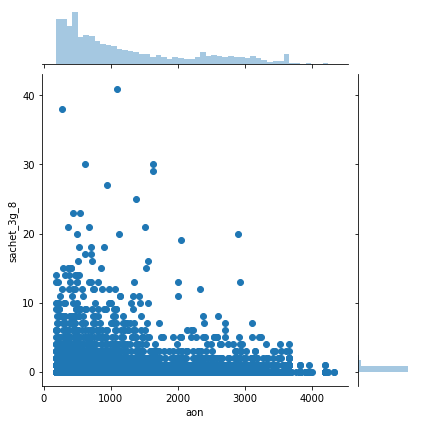

<Figure size 360x360 with 0 Axes>

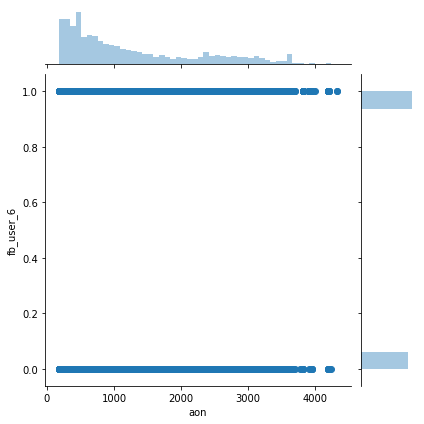

<Figure size 360x360 with 0 Axes>

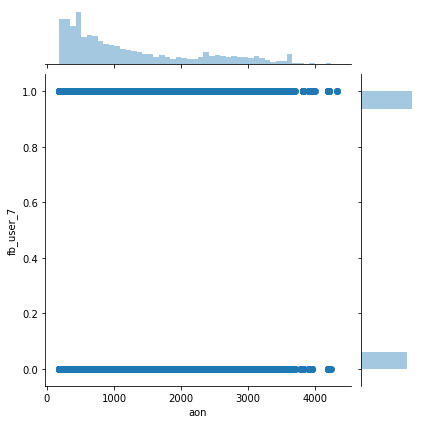

<Figure size 360x360 with 0 Axes>

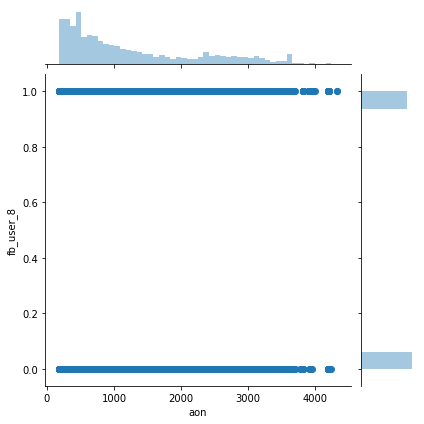

<Figure size 360x360 with 0 Axes>

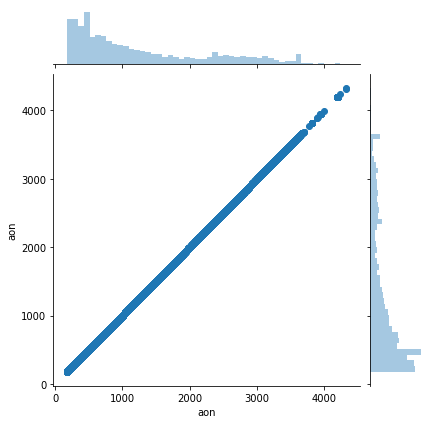

<Figure size 360x360 with 0 Axes>

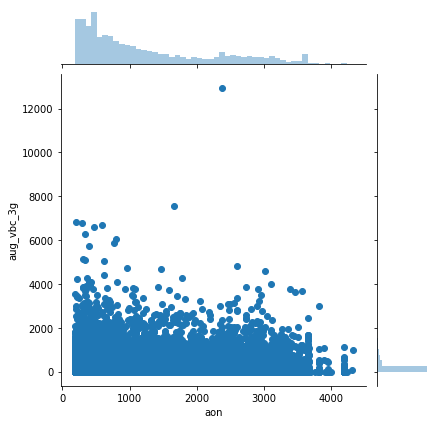

<Figure size 360x360 with 0 Axes>

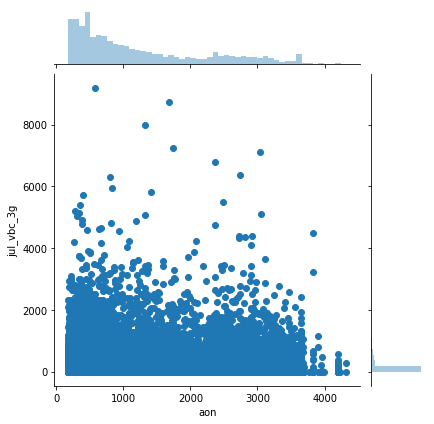

<Figure size 360x360 with 0 Axes>

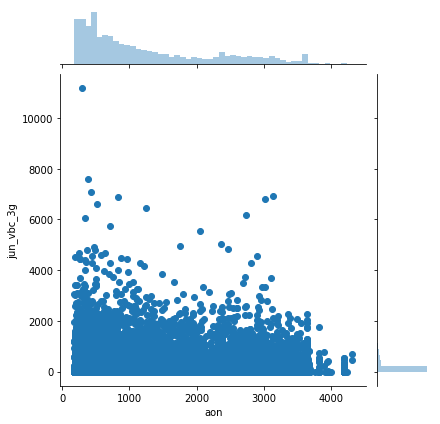

<Figure size 360x360 with 0 Axes>

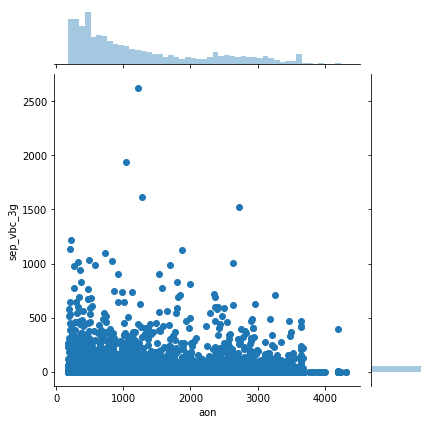

<Figure size 360x360 with 0 Axes>

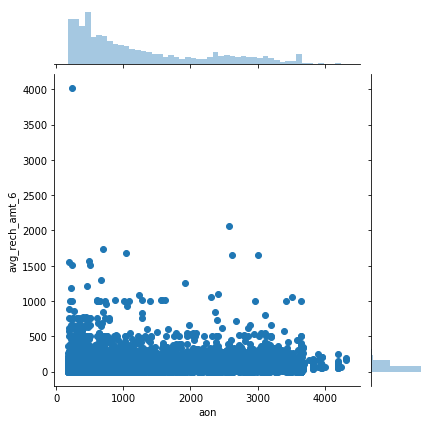

<Figure size 360x360 with 0 Axes>

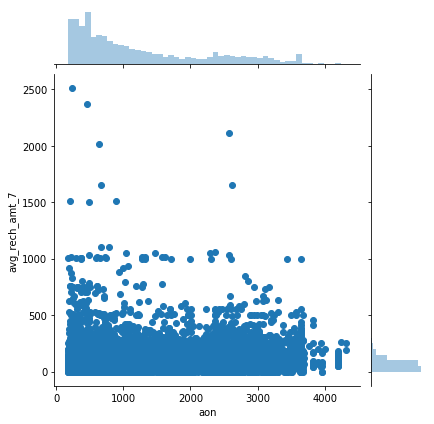

<Figure size 360x360 with 0 Axes>

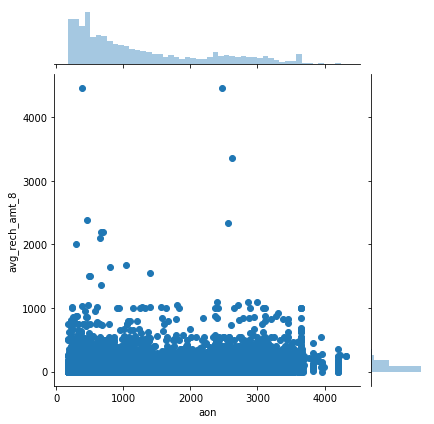

<Figure size 360x360 with 0 Axes>

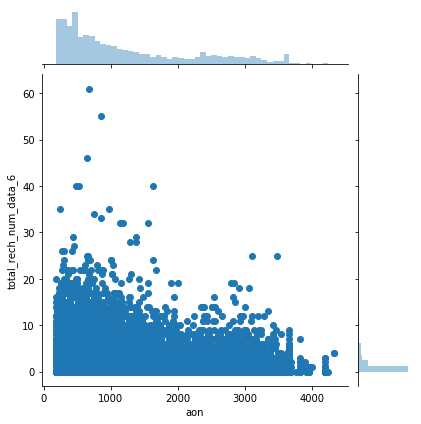

<Figure size 360x360 with 0 Axes>

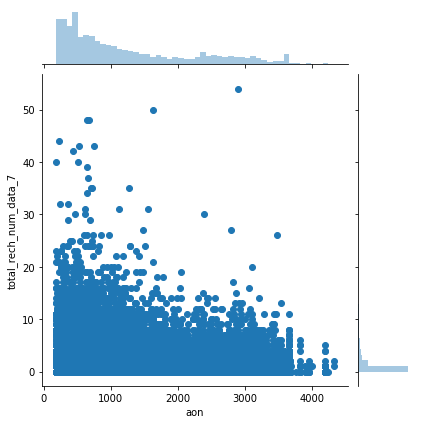

<Figure size 360x360 with 0 Axes>

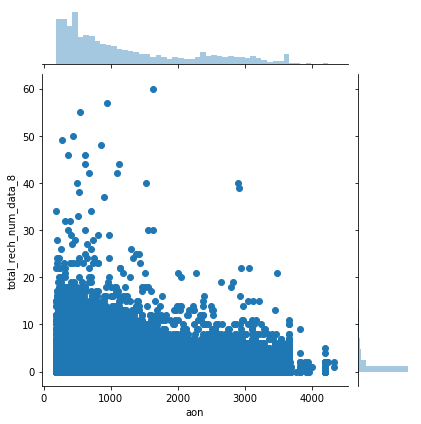

<Figure size 360x360 with 0 Axes>

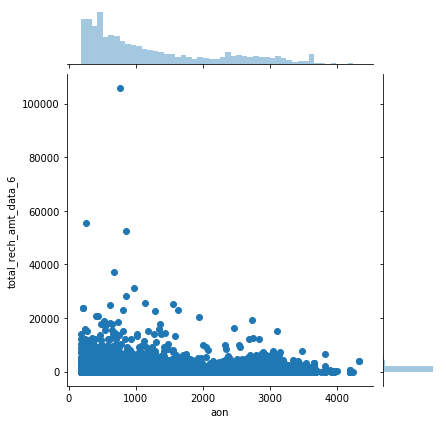

<Figure size 360x360 with 0 Axes>

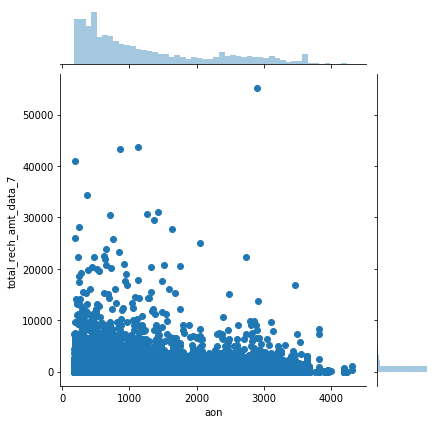

<Figure size 360x360 with 0 Axes>

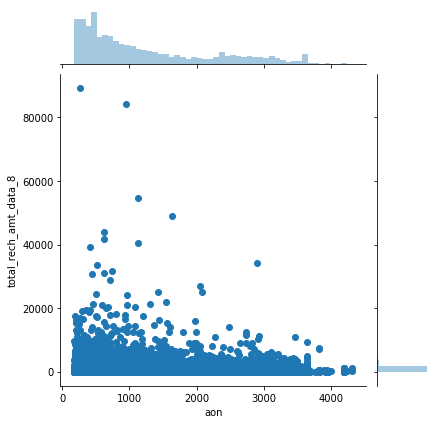

<Figure size 360x360 with 0 Axes>

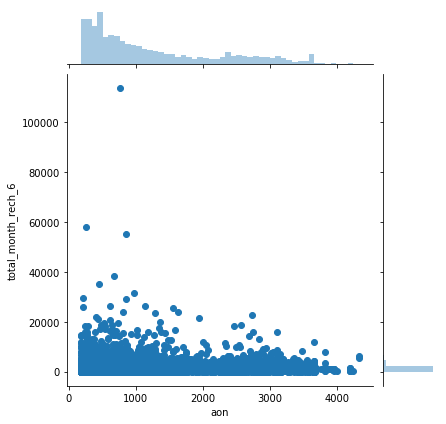

<Figure size 360x360 with 0 Axes>

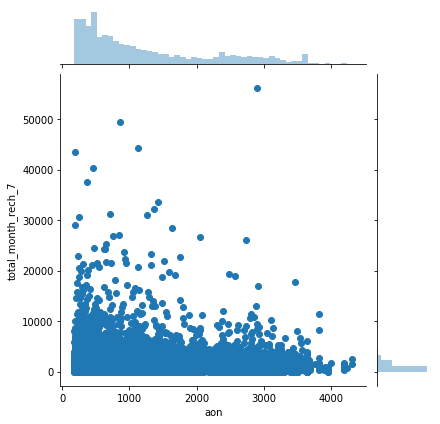

<Figure size 360x360 with 0 Axes>

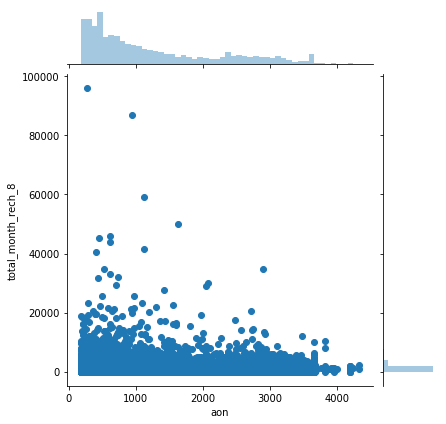

<Figure size 360x360 with 0 Axes>

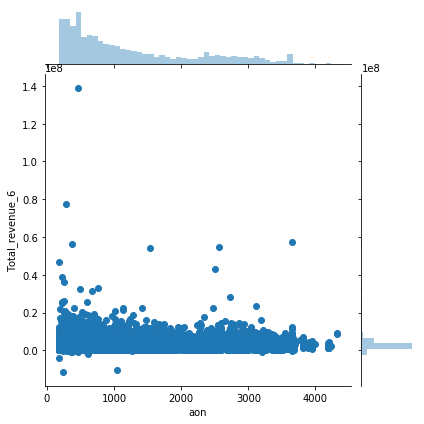

<Figure size 360x360 with 0 Axes>

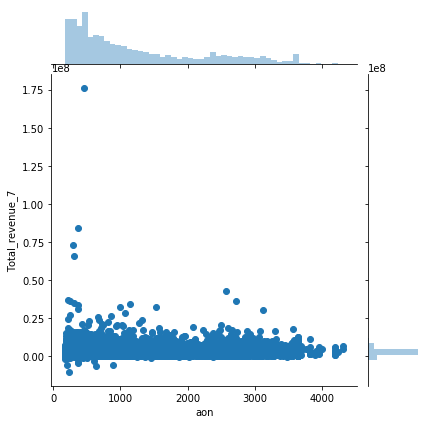

<Figure size 360x360 with 0 Axes>

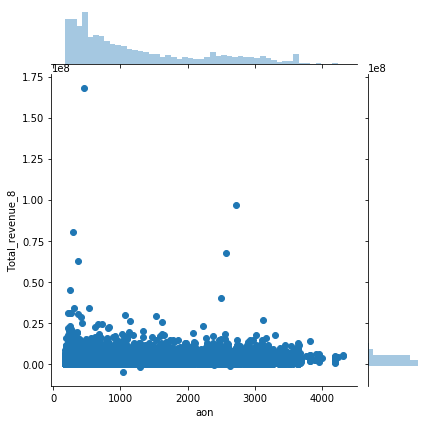

<Figure size 360x360 with 0 Axes>

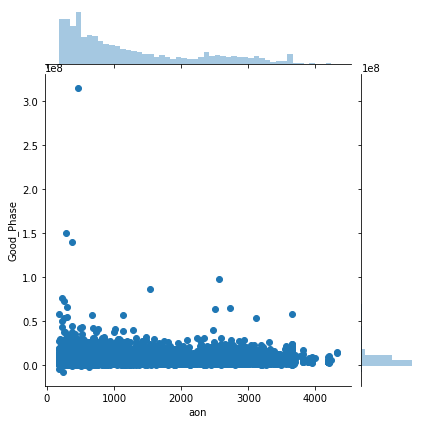

<Figure size 360x360 with 0 Axes>

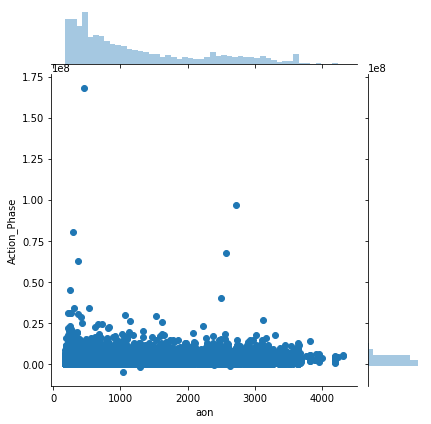

<Figure size 360x360 with 0 Axes>

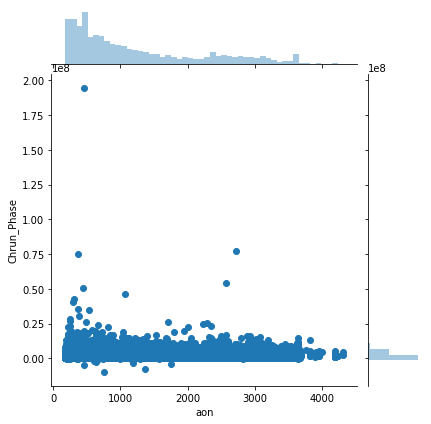

In [63]:
# Check the Age of the Network used by the operator Vs the other variables expect churn.
cont_cols = [col for col in Highvalu_users.columns if col not in ['Churn']]
for col in cont_cols:
    plt.figure(figsize=(5, 5))
    sns.jointplot(x='aon',y = col,data= Highvalu_users)
    plt.show()                                                

### Inferences : 
    
We can see the AON - Age of network is postive correlated to onnet/offnet- minutes usages,roaming incoming/outgoing calls.
    
Also with the 2g, Operator T to other operator mobile network, Operator T to other operator fixed lines & own call centers, std calls.

Also we can see AON having no correlation with outgoing call others

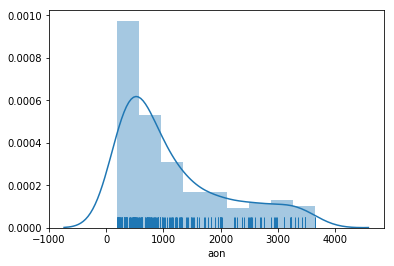

In [64]:
# Check the Age of the Network used by the operator Vs the other variables expect churn.
# rug = True
# plotting only a few points since rug takes a long while
sns.distplot(Highvalu_users['aon'][:200], rug=True)
plt.show()

In [65]:
### Inferences : The data is normally distributed with outliers with respect to age on network.

## 7. Model Building:

In [66]:
# Do the X train , Y train test and seperate the data sets. 
# import needed model building sklearn parameters.
from sklearn.model_selection import train_test_split
import sklearn.preprocessing
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
#putting features variables in X
X = Highvalu_users.drop(['Churn'], axis=1)

#putting response variables in Y
y = Highvalu_users['Churn']    

# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

In [67]:
### Scaling before PCA 

In [68]:
#Rescaling the features before PCA as it is sensitive to the scales of the features
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [69]:
# fitting and transforming the scaler on train
X_train = scaler.fit_transform(X_train)
# transforming the train using the already fit scaler
X_test = scaler.transform(X_test)


## 8.Imbalanced Data Handling:

# Before proceeding we have know that the data is imbalance. 
Handling class imbalance.

1. Standard classifier algorithms like Decision Tree and Logistic Regression have a bias towards classes which have number of instances.

2. They tend to only predict the majority class data. The features of the minority class are treated as noise and are often ignored. Thus, there is a high probability of misclassification of the minority class as compared to the majority class.

### Informed Over Sampling: Synthetic Minority Over-sampling Technique

This technique is followed to avoid overfitting which occurs when exact replicas of minority instances are added to the main dataset. A subset of data is taken from the minority class as an example and then new synthetic similar instances are created. These synthetic instances are then added to the original dataset. The new dataset is used as a sample to train the classification models.

### Advantages

1. Mitigates the problem of overfitting caused by random oversampling as synthetic examples are generated rather than replication of instances
2. No loss of useful information

In [70]:
# Check the sample before for 0 and 1 :
print("Before sample the counts of label '1': {}".format(sum(y_train==1)))
print("Before sample counts of label '0': {} \n".format(sum(y_train==0)))
print("Before sample churn event rate : {}% \n".format(round(sum(y_train==1)/len(y_train)*100,2)))

Before sample the counts of label '1': 1700
Before sample counts of label '0': 19234 

Before sample churn event rate : 8.12% 



In [71]:
# Import the SMOTE and Joblib for solving this issue of imbalance. 
from sklearn.externals import joblib
from imblearn.over_sampling import SMOTE
from scipy import sparse


sm = SMOTE(random_state=12, ratio = 1)
X_train_re, y_train_re = sm.fit_sample(X_train, y_train)

In [72]:
# Check the sample after for 0 and 1 :
print("After sample the counts of label '1': {}".format(sum(y_train_re==1)))
print("After sample counts of label '0': {} \n".format(sum(y_train_re==0)))
print("After sample churn event rate : {}% \n".format(round(sum(y_train_re==1)/len(y_train_re)*100,2)))

After sample the counts of label '1': 19234
After sample counts of label '0': 19234 

After sample churn event rate : 50.0% 



In [73]:
# Now we can see that the data is now 50% balanced. Let us also do the outlier analysis and proceed further.

## 7. Outlier Analysis:

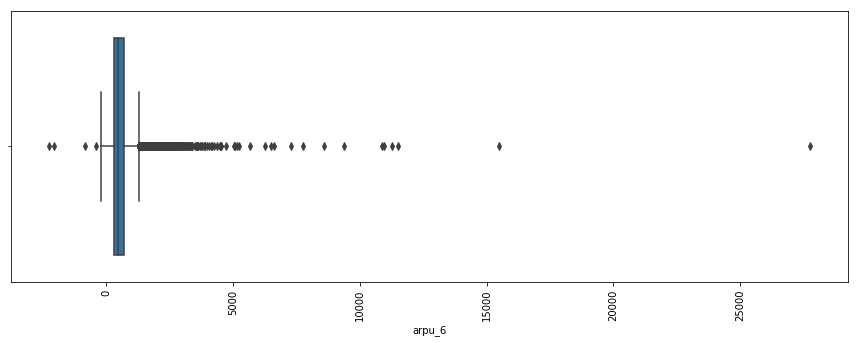

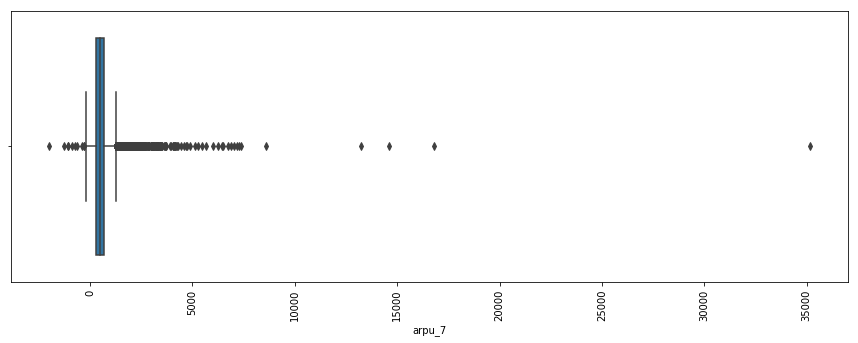

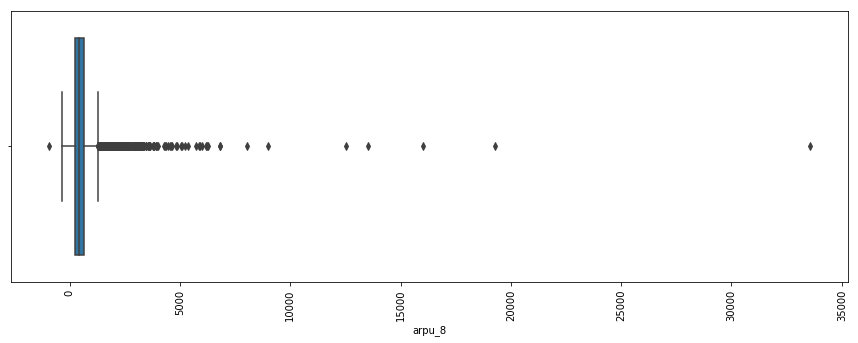

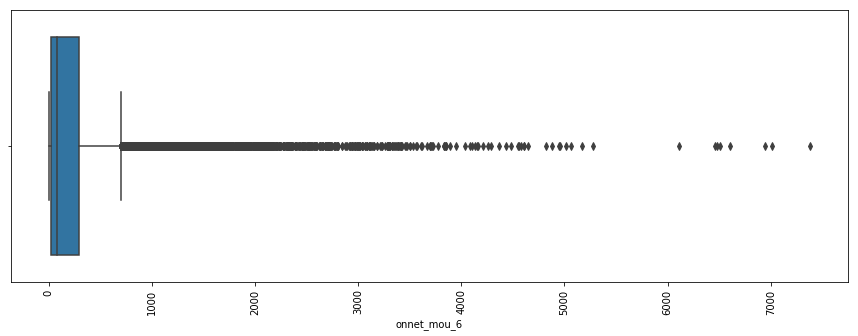

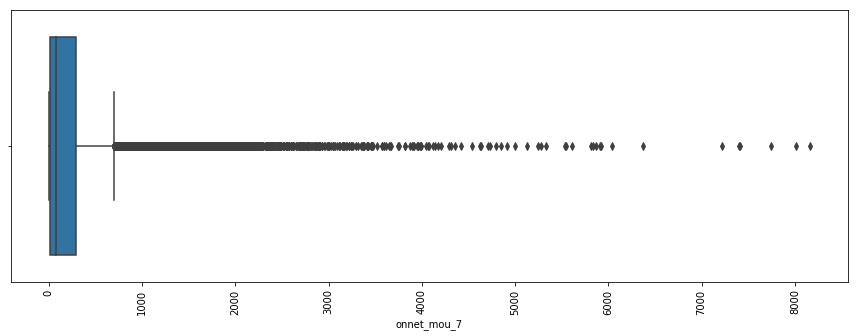

...

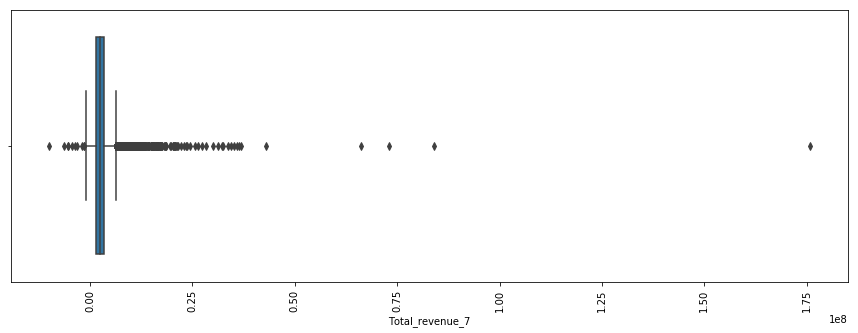

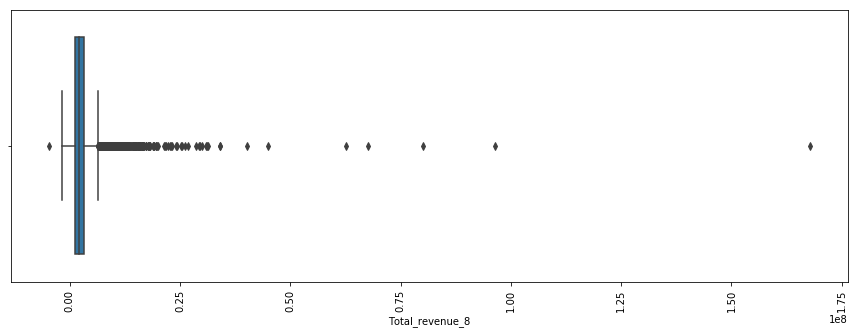

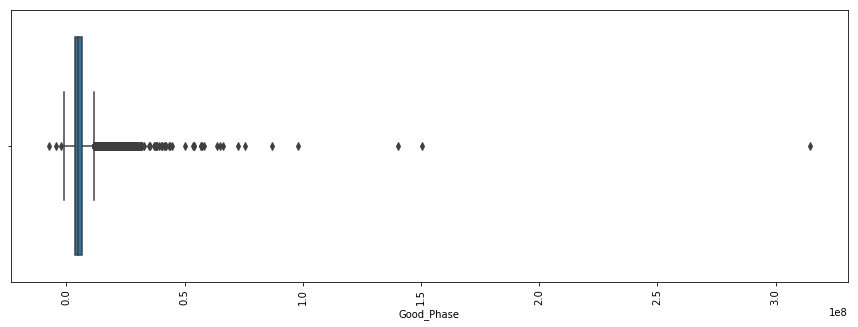

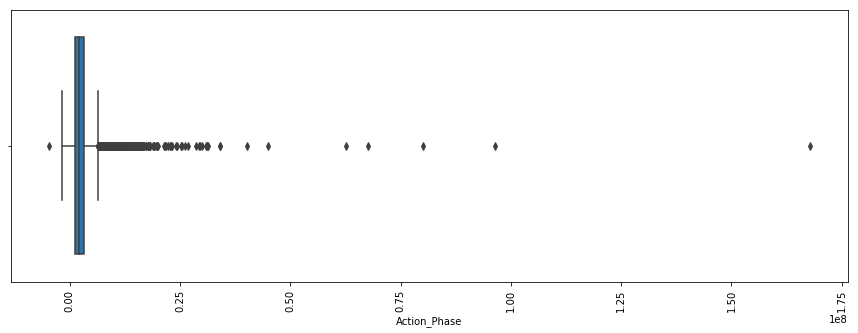

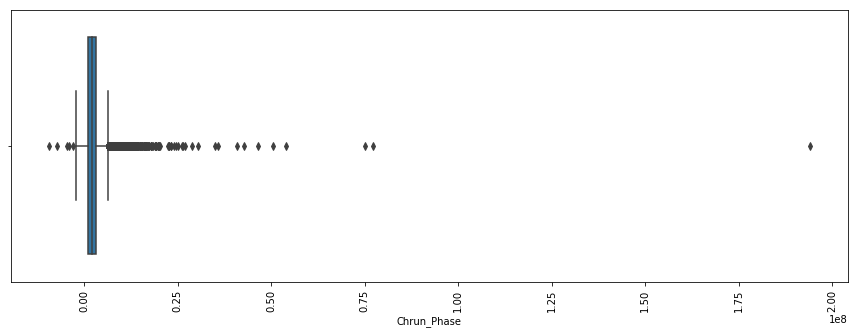

In [74]:
# Let us check the outlier present in the data before doing modelling and remove the outliers and proceed with the modelling.

prev_box = list(Highvalu_users.columns)
for i in Highvalu_users[prev_box]:
    plt.figure(1,figsize=(15,5))
    sns.boxplot(Highvalu_users[i])
    plt.xticks(rotation = 90,fontsize =10)
    plt.show()


## Inferences:
We could see almost all the variables are having the ouliers preset in the datasets. Let us need to remove it.

oUTLIERS: arpu_6 -1209.9513749999999 2316.767625


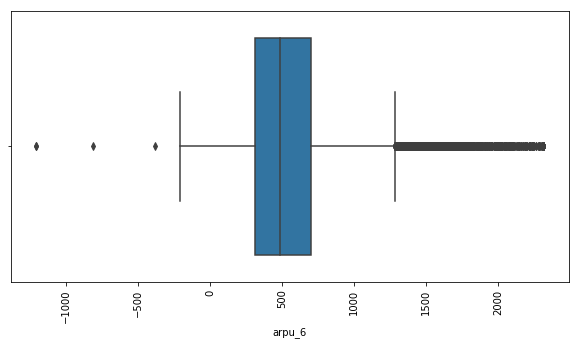

oUTLIERS: arpu_7 -1208.0400000000002 2319.28


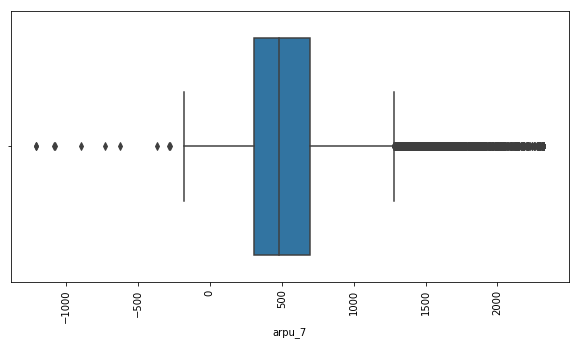

oUTLIERS: arpu_8 -1441.3845000000001 2429.9475


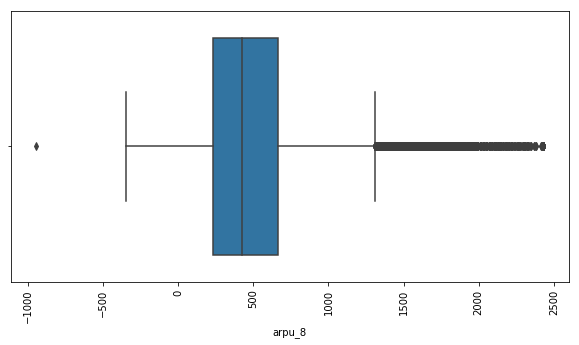

oUTLIERS: onnet_mou_6 -1133.79 1889.65


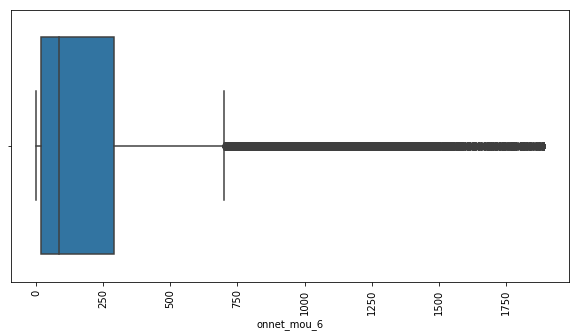

oUTLIERS: onnet_mou_7 -1177.98 1963.3


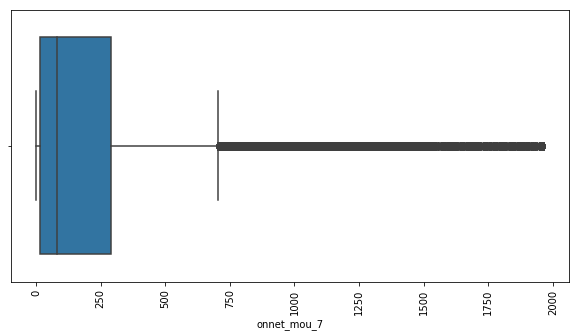

oUTLIERS: onnet_mou_8 -1000.11 1666.85


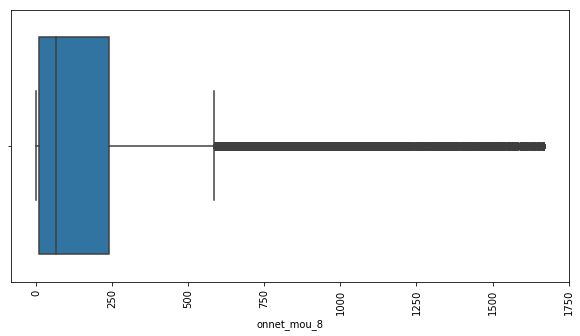

oUTLIERS: offnet_mou_6 -1345.24 2242.76


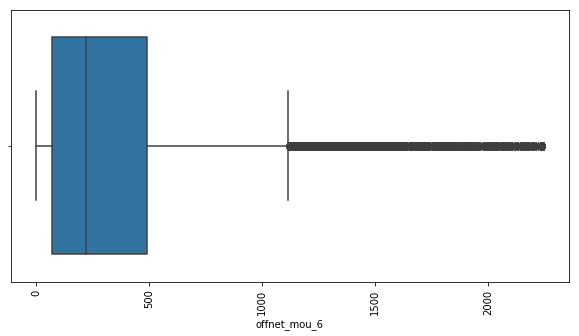

oUTLIERS: offnet_mou_7 -1376.1425000000002 2293.8375


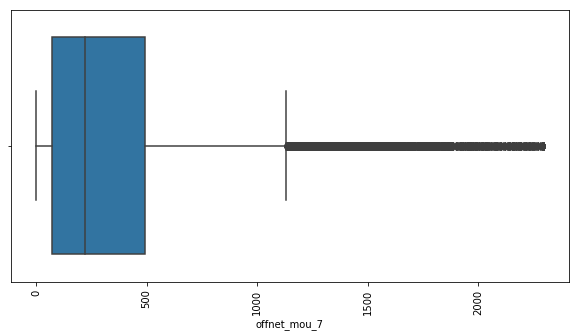

oUTLIERS: offnet_mou_8 -1236.2400000000002 2060.4000000000005


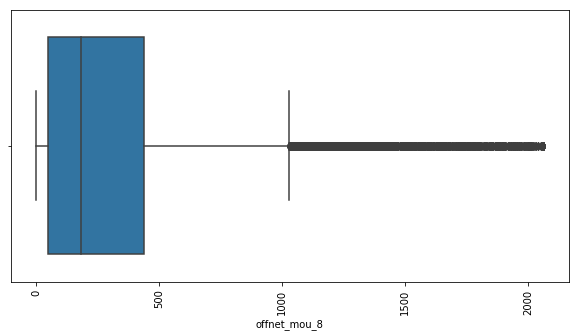

oUTLIERS: roam_ic_mou_6 -41.167500000000004 68.61250000000001


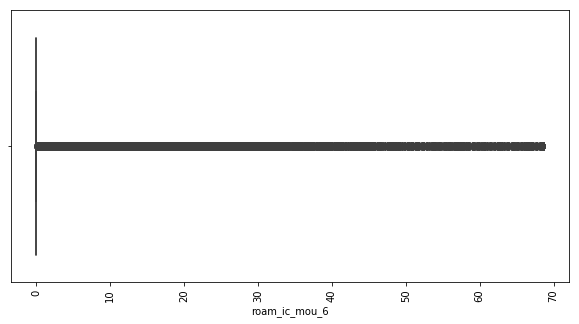

oUTLIERS: roam_ic_mou_7 -21.48 35.8


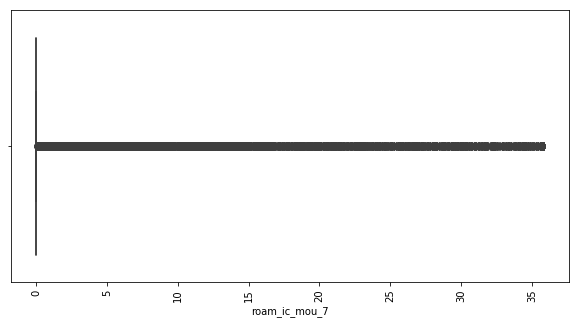

oUTLIERS: roam_ic_mou_8 -22.605 37.675


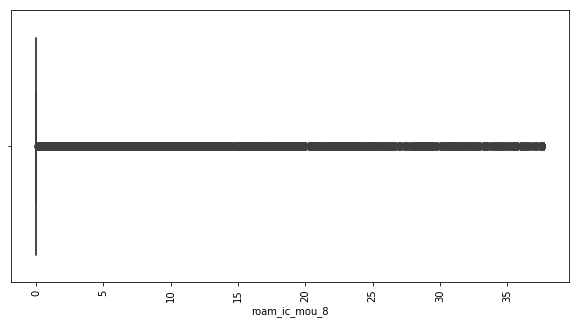

oUTLIERS: roam_og_mou_6 -75.765 126.275


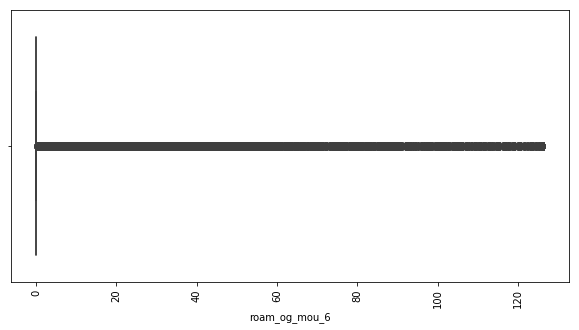

oUTLIERS: roam_og_mou_7 -46.769999999999996 77.94999999999999


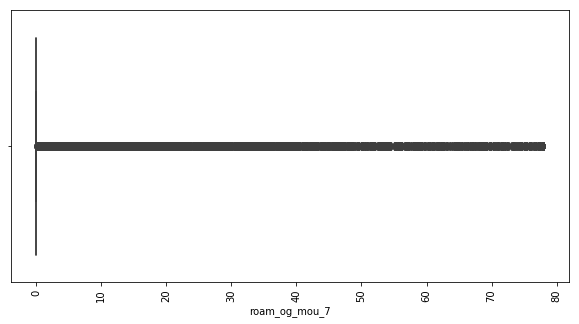

oUTLIERS: roam_og_mou_8 -43.537499999999994 72.5625


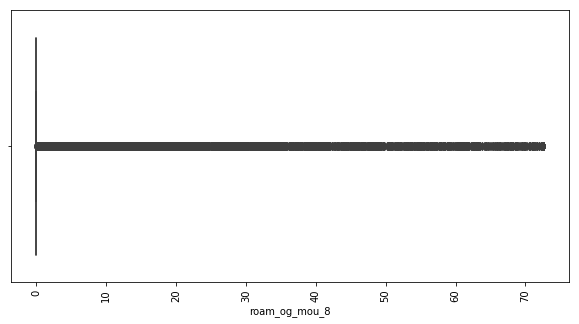

oUTLIERS: loc_og_t2t_mou_6 -282.7875 471.3125


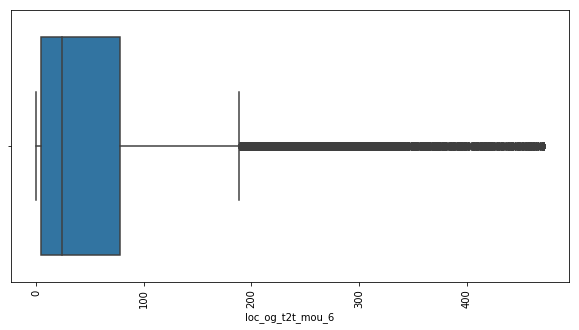

oUTLIERS: loc_og_t2t_mou_7 -286.8525 478.08750000000003


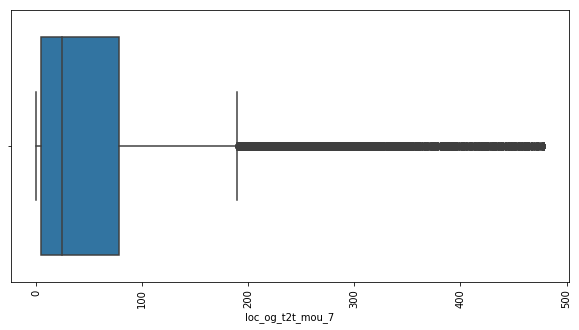

oUTLIERS: loc_og_t2t_mou_8 -268.875 448.125


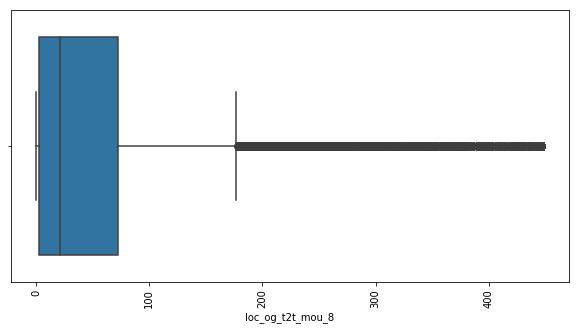

oUTLIERS: loc_og_t2m_mou_6 -629.6025 1049.3375


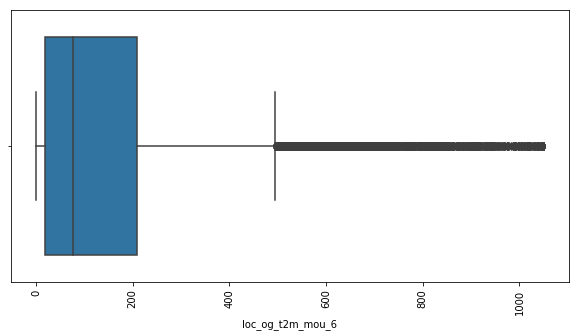

oUTLIERS: loc_og_t2m_mou_7 -633.465 1055.775


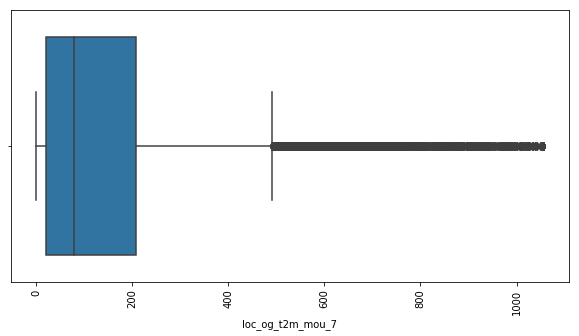

oUTLIERS: loc_og_t2m_mou_8 -598.515 997.525


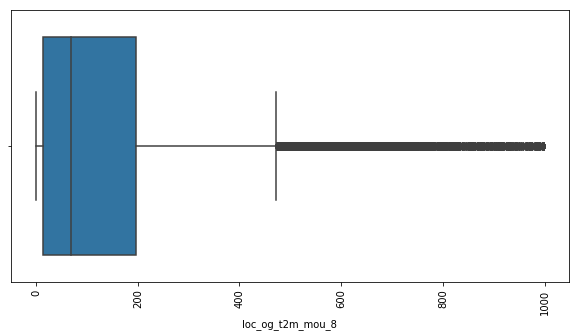

oUTLIERS: loc_og_t2f_mou_6 -24.21 40.35


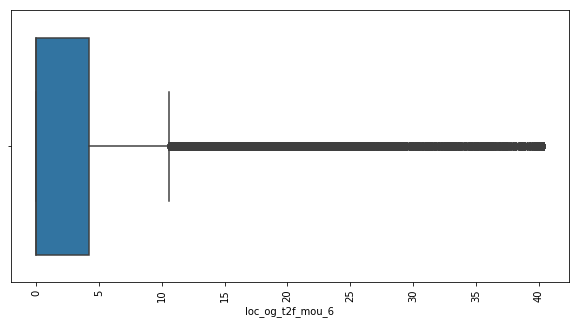

oUTLIERS: loc_og_t2f_mou_7 -24.435 40.724999999999994


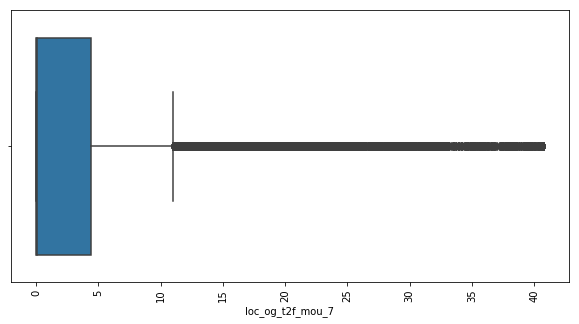

oUTLIERS: loc_og_t2f_mou_8 -22.815 38.025000000000006


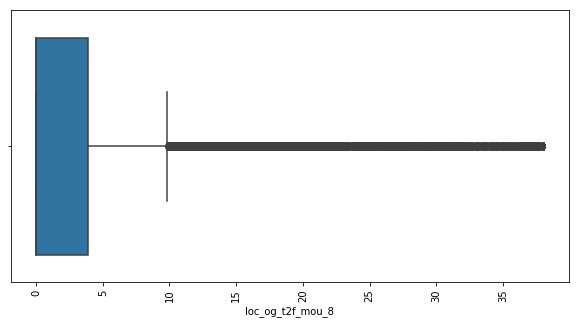

oUTLIERS: loc_og_t2c_mou_6 -6.345000000000001 10.575000000000001


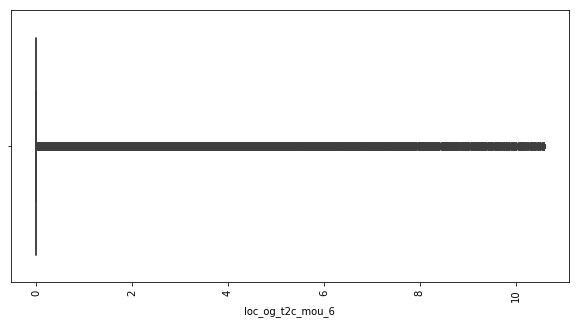

oUTLIERS: loc_og_t2c_mou_7 -7.515 12.524999999999999


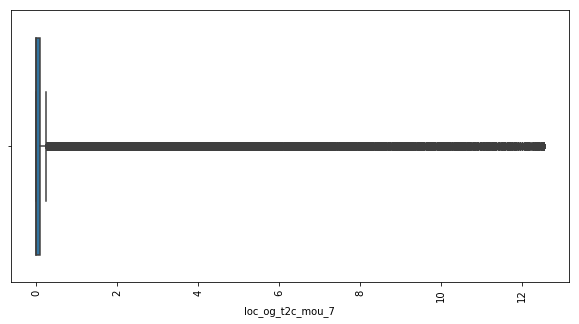

oUTLIERS: loc_og_t2c_mou_8 -6.87 11.45


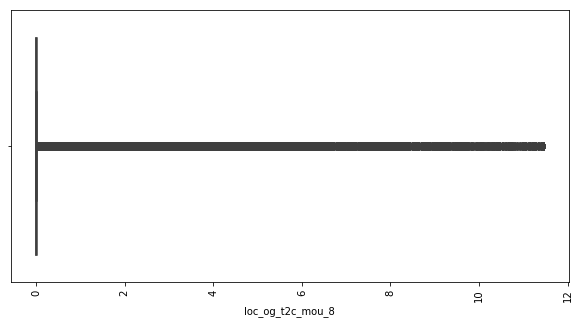

oUTLIERS: loc_og_mou_6 -959.9024999999999 1599.8374999999999


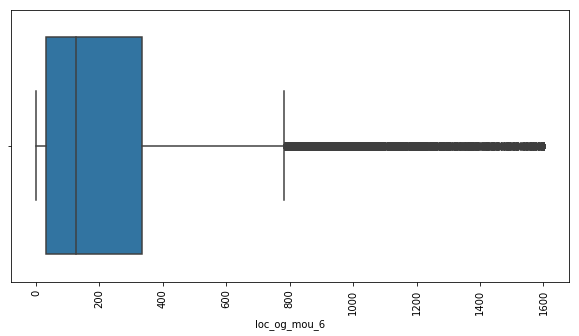

oUTLIERS: loc_og_mou_7 -956.6475 1594.4125


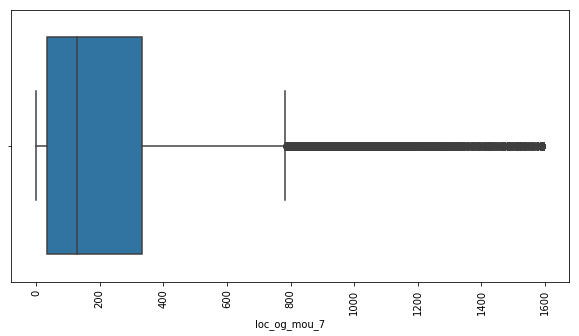

oUTLIERS: loc_og_mou_8 -912.8175000000001 1521.3625000000002


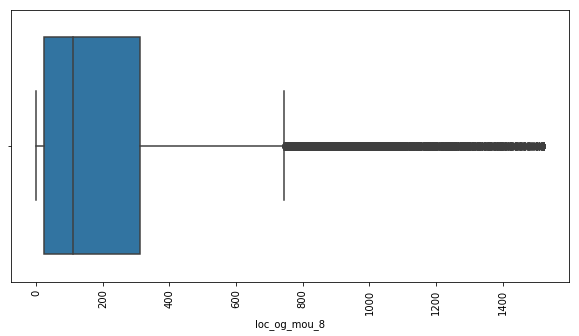

oUTLIERS: std_og_t2t_mou_6 -852.2774999999999 1420.4624999999999


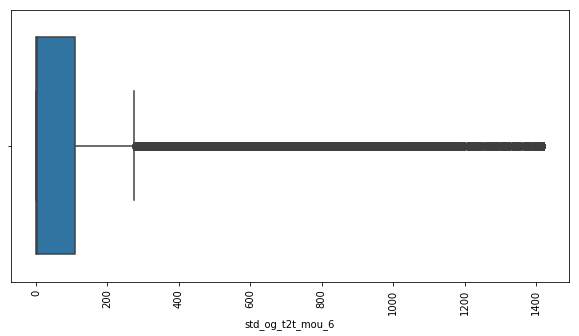

oUTLIERS: std_og_t2t_mou_7 -900.9000000000001 1501.5


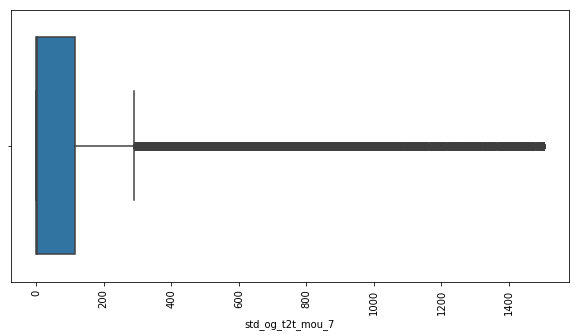

oUTLIERS: std_og_t2t_mou_8 -714.465 1190.775


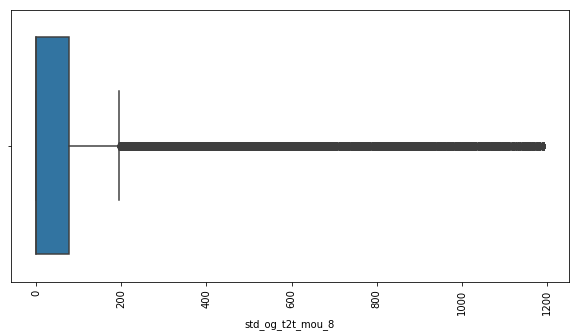

oUTLIERS: std_og_t2m_mou_6 -825.2475 1375.4125


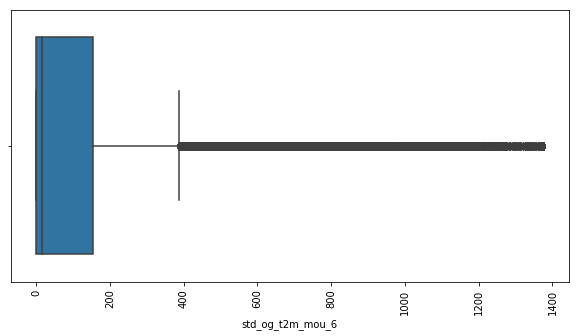

oUTLIERS: std_og_t2m_mou_7 -881.1150000000001 1468.525


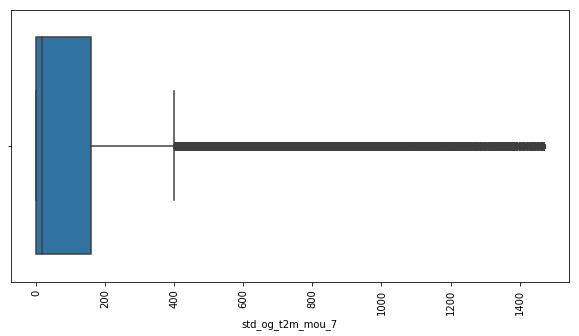

oUTLIERS: std_og_t2m_mou_8 -698.3100000000001 1163.8500000000001


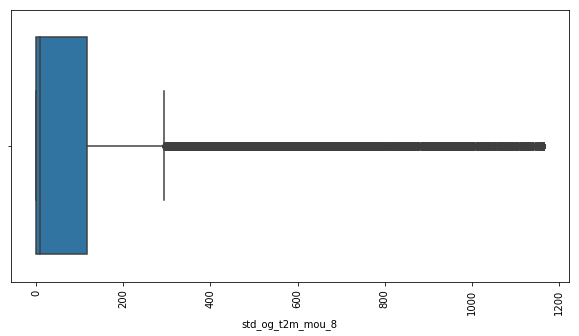

oUTLIERS: std_og_t2f_mou_6 -2.52 4.2


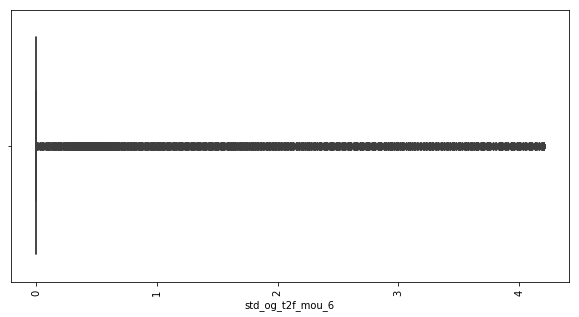

oUTLIERS: std_og_t2f_mou_7 -2.4749999999999996 4.125


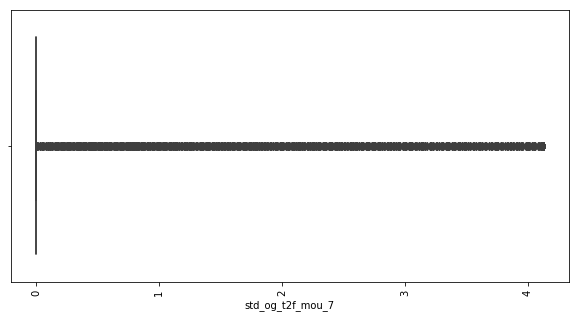

oUTLIERS: std_og_t2f_mou_8 -1.92 3.2


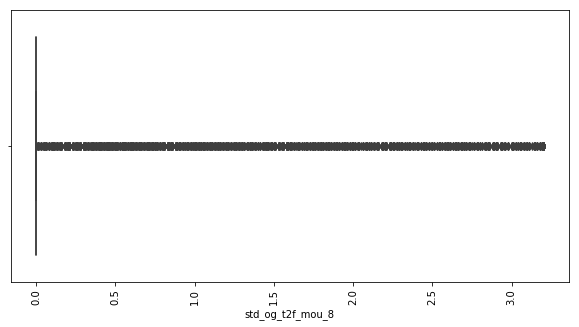

oUTLIERS: std_og_mou_6 -1675.0799999999997 2791.7999999999993


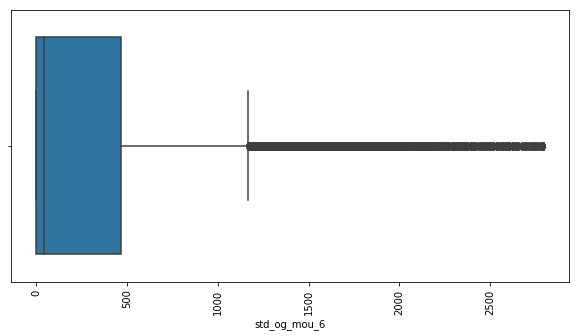

oUTLIERS: std_og_mou_7 -1732.7024999999999 2887.8374999999996


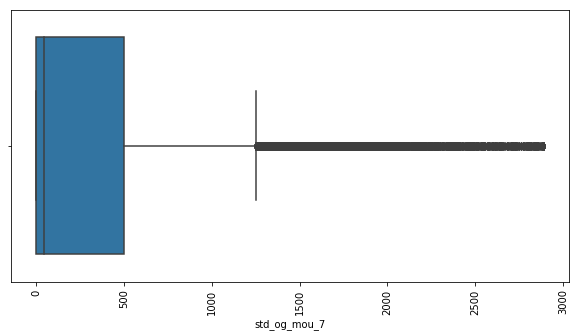

oUTLIERS: std_og_mou_8 -1506.63 2511.05


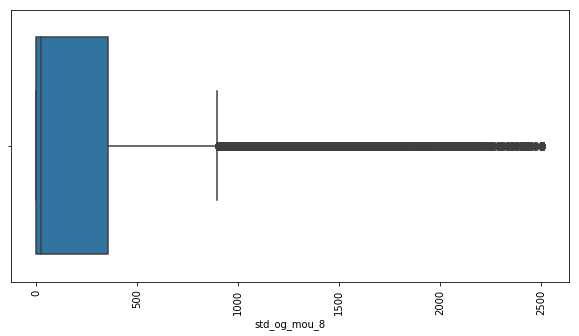

oUTLIERS: isd_og_mou_6 0.0 0.0


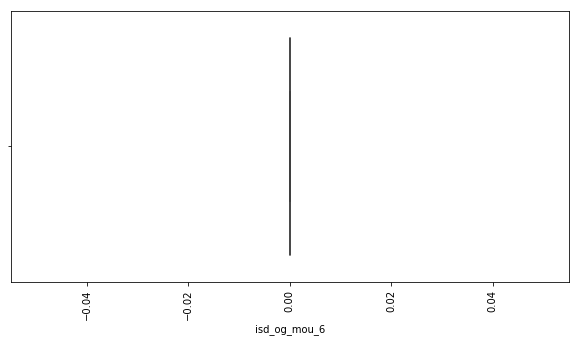

oUTLIERS: isd_og_mou_7 0.0 0.0


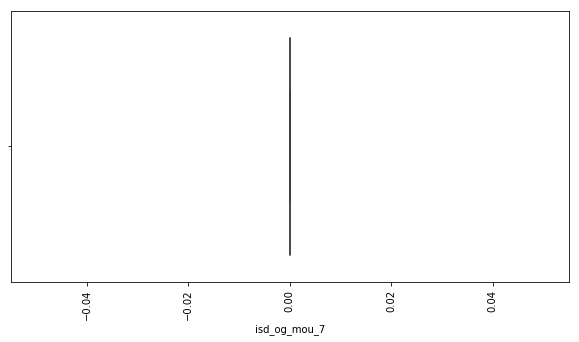

oUTLIERS: isd_og_mou_8 0.0 0.0


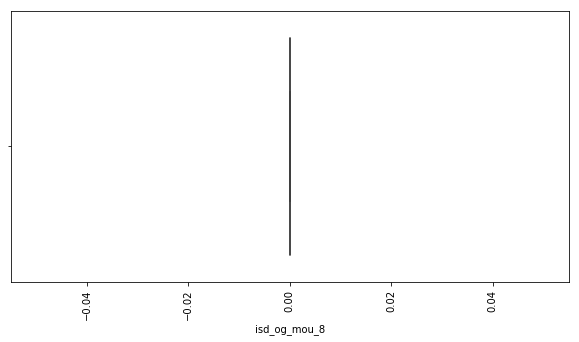

oUTLIERS: spl_og_mou_6 -23.94 39.900000000000006


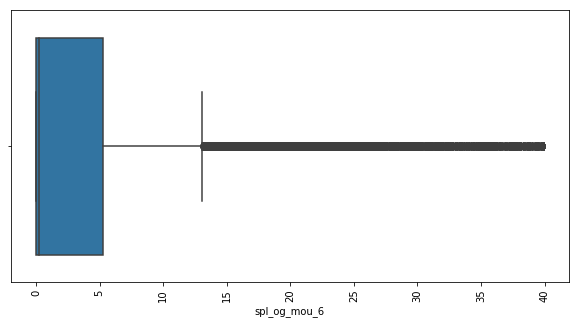

oUTLIERS: spl_og_mou_7 -28.927500000000002 48.212500000000006


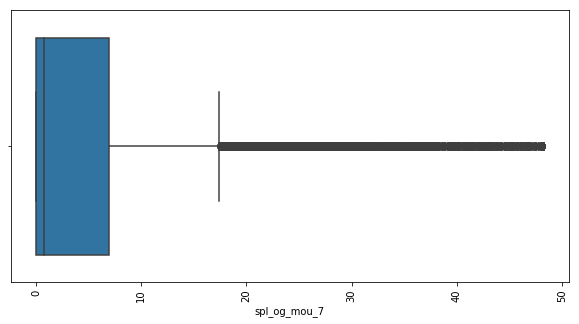

oUTLIERS: spl_og_mou_8 -26.384999999999998 43.974999999999994


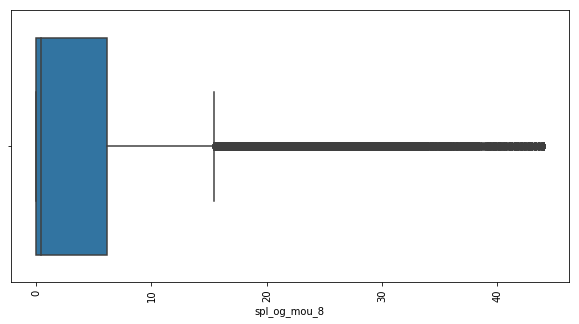

oUTLIERS: og_others_6 -3.09 5.15


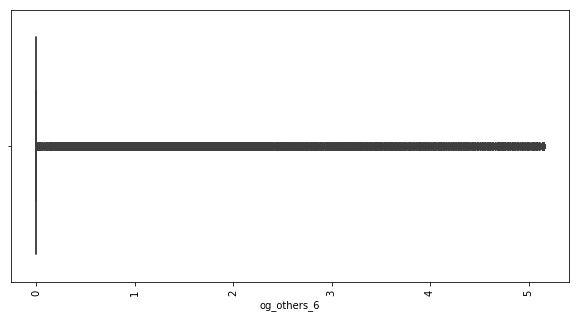

oUTLIERS: og_others_7 0.0 0.0


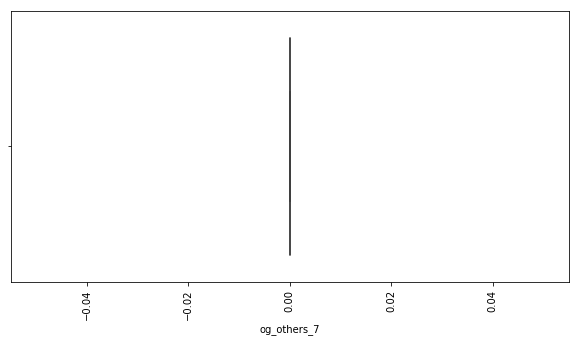

oUTLIERS: og_others_8 0.0 0.0


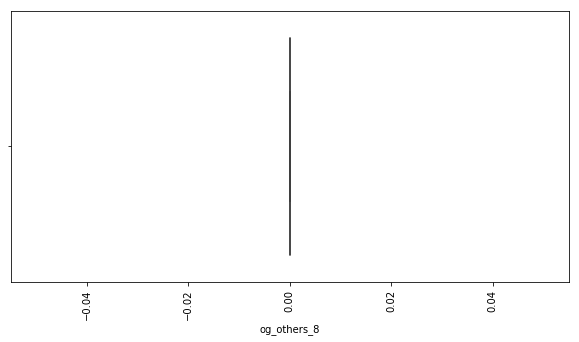

oUTLIERS: total_og_mou_6 -2173.0575 3621.7625


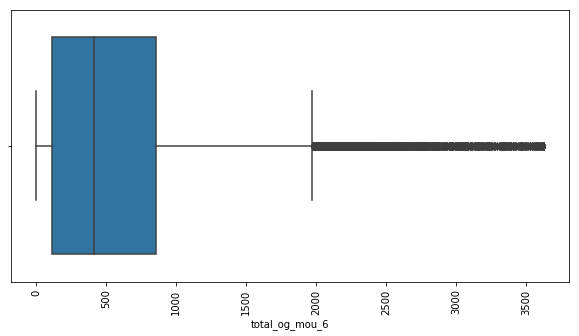

oUTLIERS: total_og_mou_7 -2226.4875 3710.8125


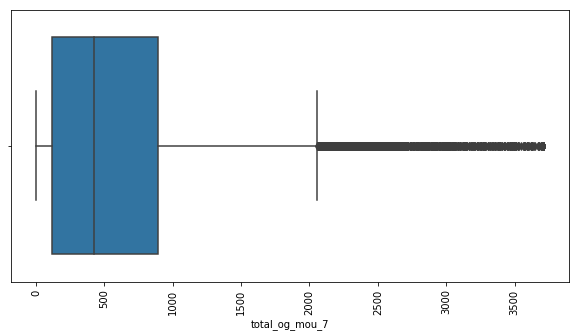

oUTLIERS: total_og_mou_8 -2042.4525000000003 3404.0875000000005


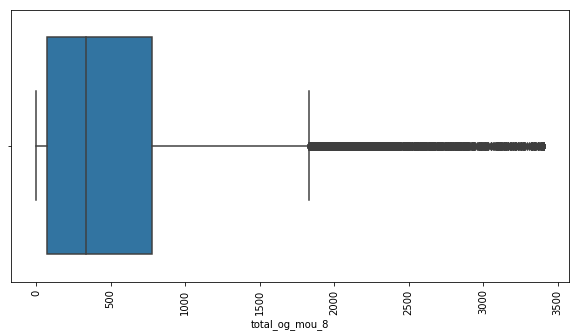

oUTLIERS: loc_ic_t2t_mou_6 -221.95499999999998 369.92499999999995


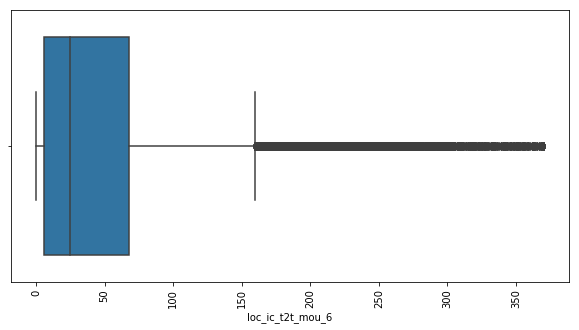

oUTLIERS: loc_ic_t2t_mou_7 -224.895 374.82500000000005


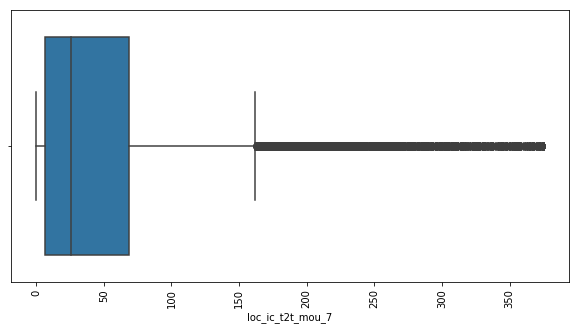

oUTLIERS: loc_ic_t2t_mou_8 -211.0275 351.7125


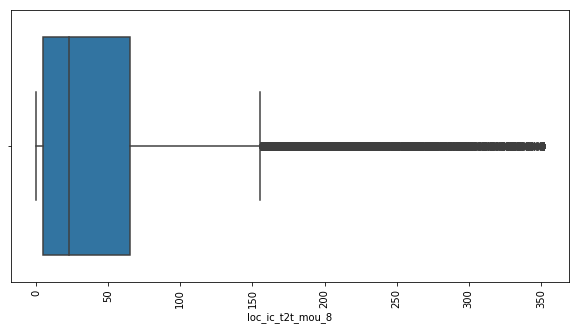

oUTLIERS: loc_ic_t2m_mou_6 -533.1975 888.6625


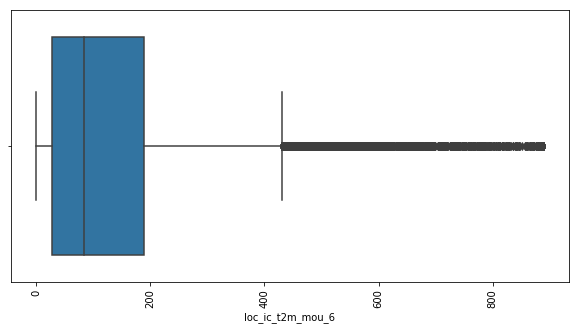

oUTLIERS: loc_ic_t2m_mou_7 -529.915 884.125


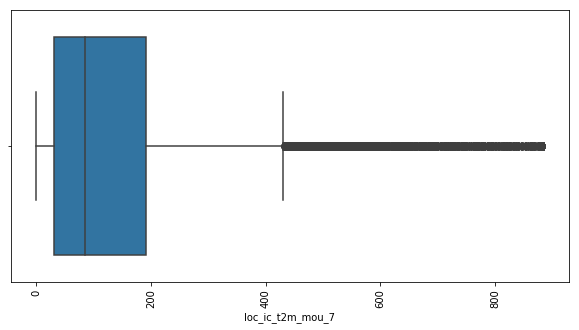

oUTLIERS: loc_ic_t2m_mou_8 -529.1775 881.9625


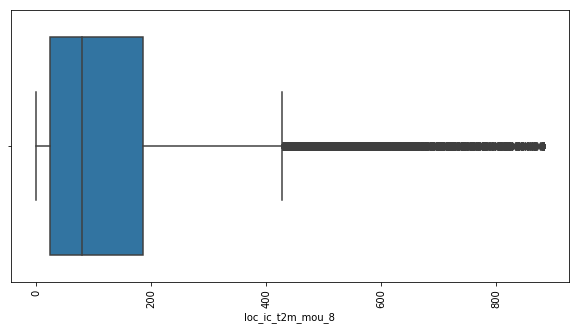

oUTLIERS: loc_ic_t2f_mou_6 -57.015 95.025


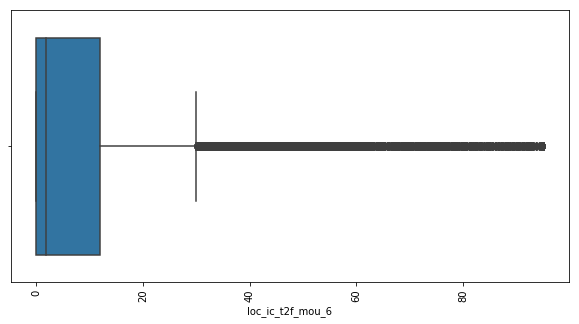

oUTLIERS: loc_ic_t2f_mou_7 -59.955 99.925


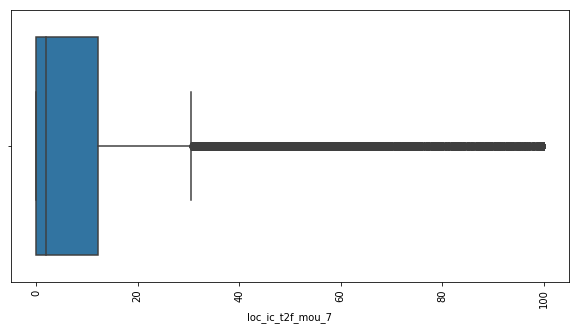

oUTLIERS: loc_ic_t2f_mou_8 -54.989999999999995 91.64999999999999


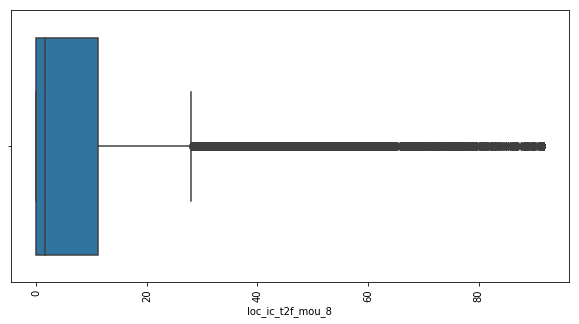

oUTLIERS: loc_ic_mou_6 -815.7899999999998 1361.2499999999998


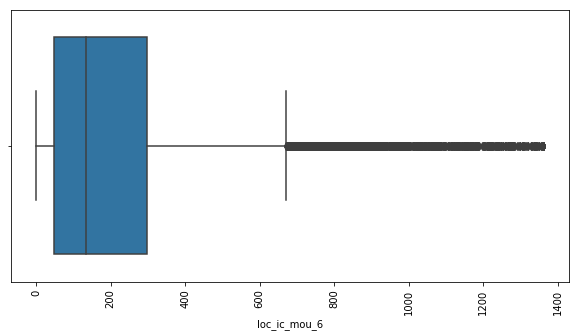

oUTLIERS: loc_ic_mou_7 -817.5337499999999 1365.73625


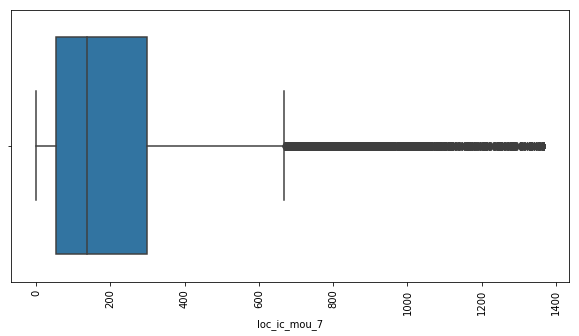

oUTLIERS: loc_ic_mou_8 -806.4749999999999 1344.125


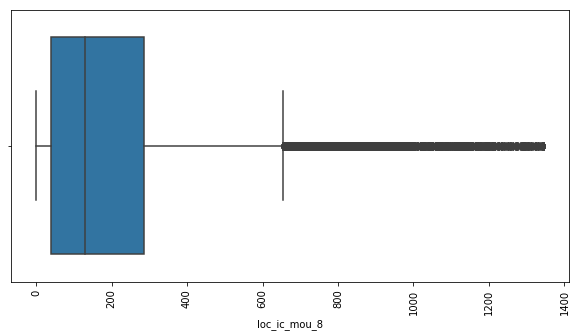

oUTLIERS: std_ic_t2t_mou_6 -46.800000000000004 78.0


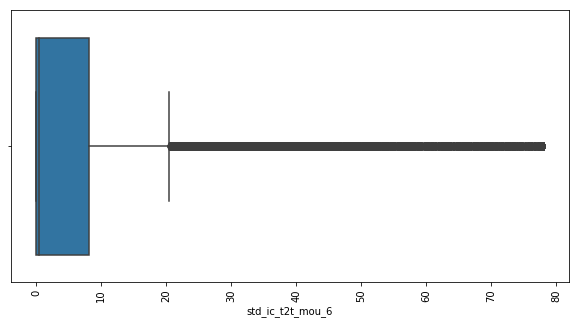

oUTLIERS: std_ic_t2t_mou_7 -48.585 80.975


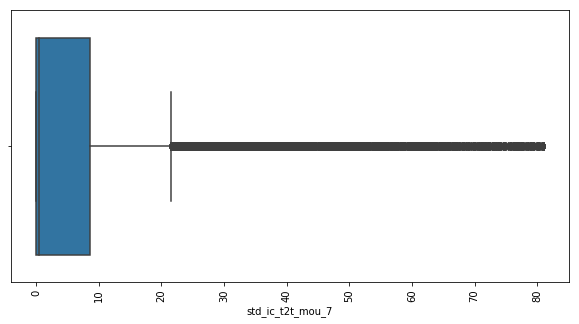

oUTLIERS: std_ic_t2t_mou_8 -42.5025 70.8375


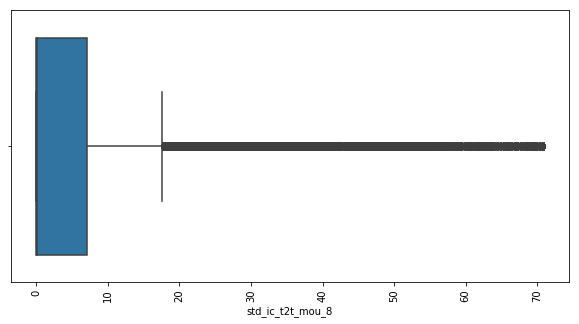

oUTLIERS: std_ic_t2m_mou_6 -101.35499999999999 168.92499999999998


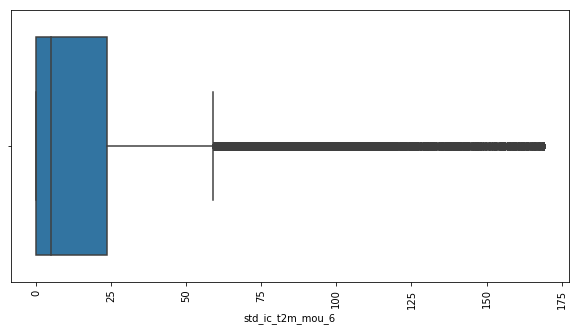

oUTLIERS: std_ic_t2m_mou_7 -104.32500000000002 173.87500000000003


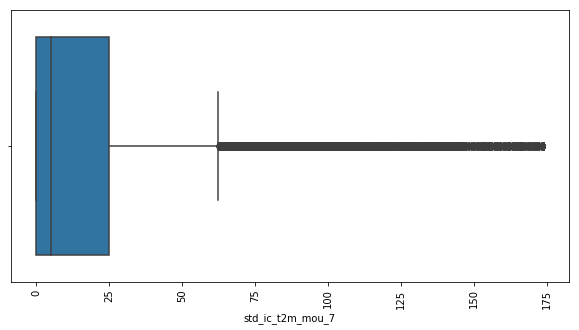

oUTLIERS: std_ic_t2m_mou_8 -94.4475 157.41250000000002


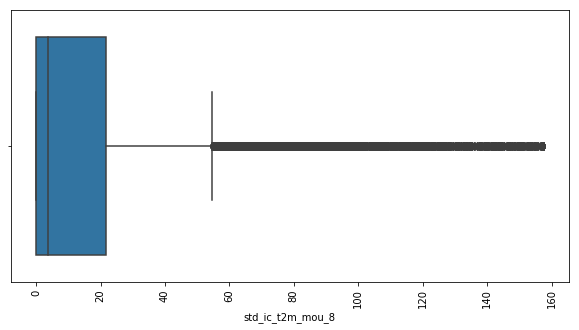

oUTLIERS: std_ic_t2f_mou_6 -6.045 10.075


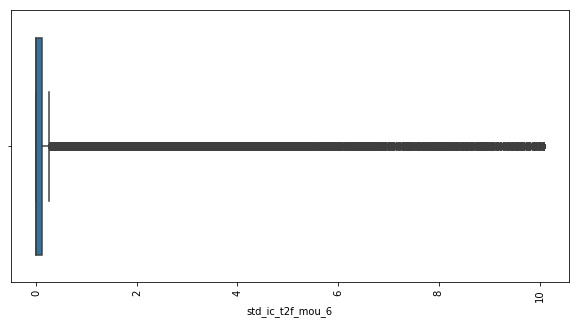

oUTLIERS: std_ic_t2f_mou_7 -6.495 10.825


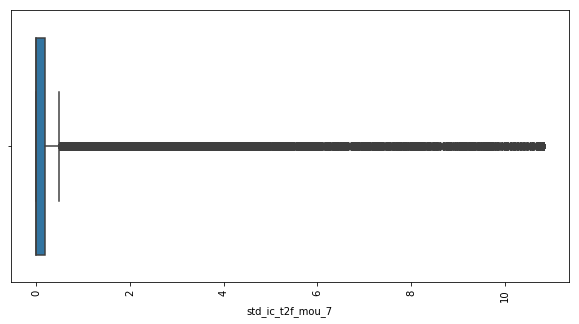

oUTLIERS: std_ic_t2f_mou_8 -5.67 9.45


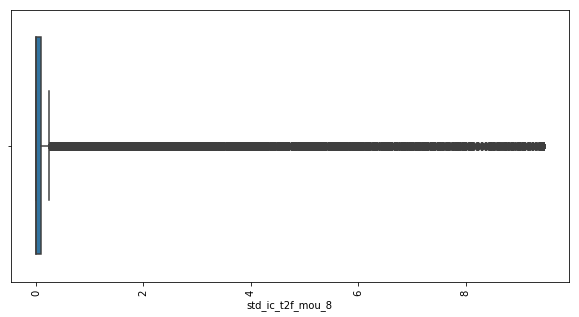

oUTLIERS: std_ic_mou_6 -161.10000000000002 268.5


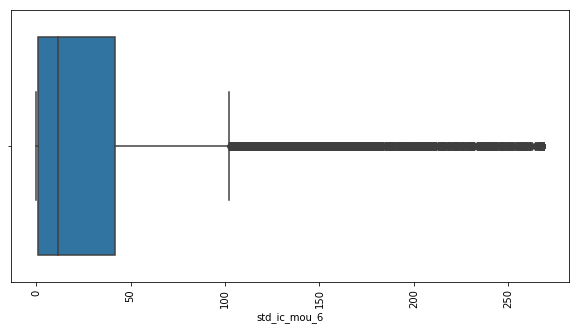

oUTLIERS: std_ic_mou_7 -165.0675 275.11249999999995


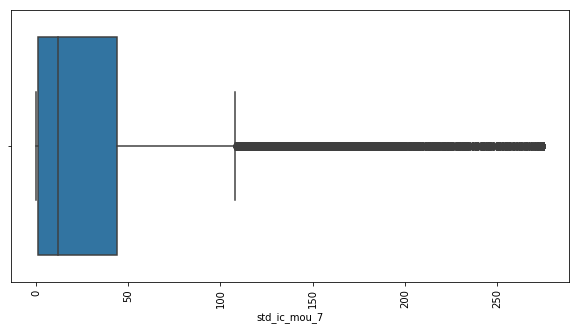

oUTLIERS: std_ic_mou_8 -150.0 250.0


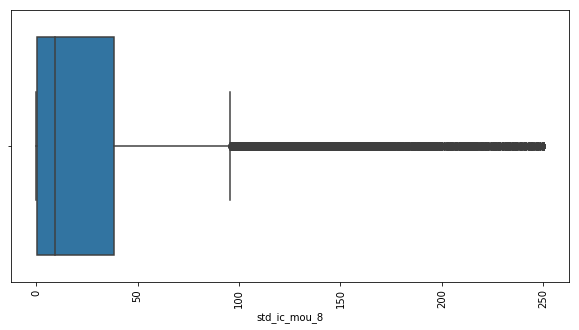

oUTLIERS: total_ic_mou_6 -995.3149999999999 1662.405


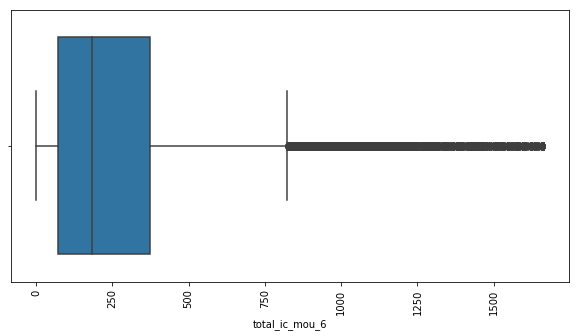

oUTLIERS: total_ic_mou_7 -1005.0275000000003 1681.8725000000004


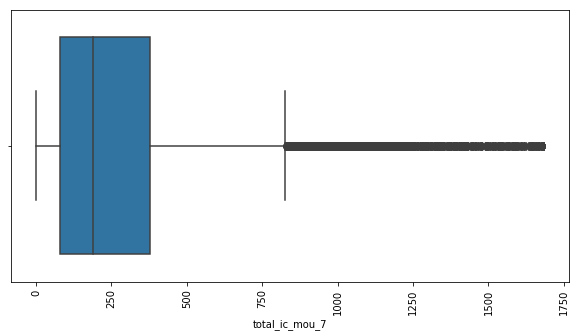

oUTLIERS: total_ic_mou_8 -976.1624999999999 1626.9375


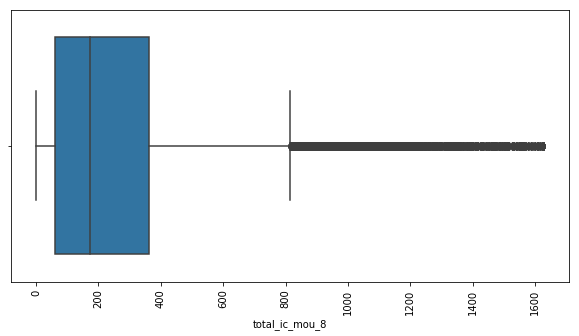

oUTLIERS: spl_ic_mou_6 -0.375 0.625


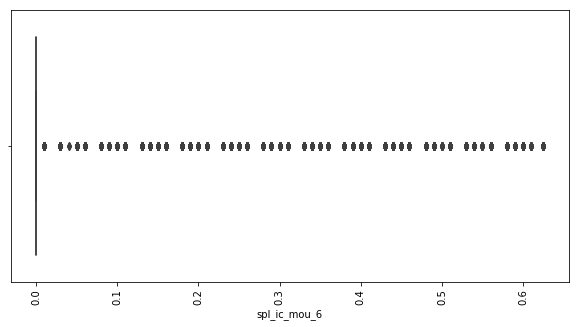

oUTLIERS: spl_ic_mou_7 0.0 0.0


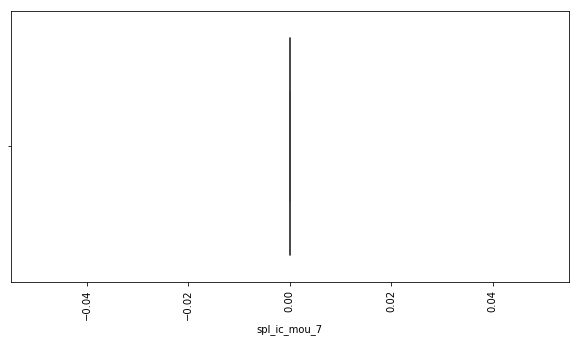

oUTLIERS: spl_ic_mou_8 0.0 0.0


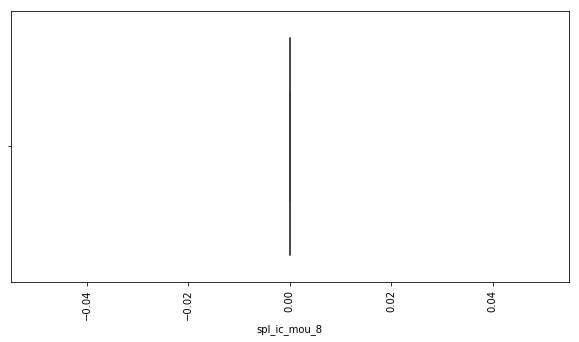

oUTLIERS: isd_ic_mou_6 -20.115000000000002 33.525000000000006


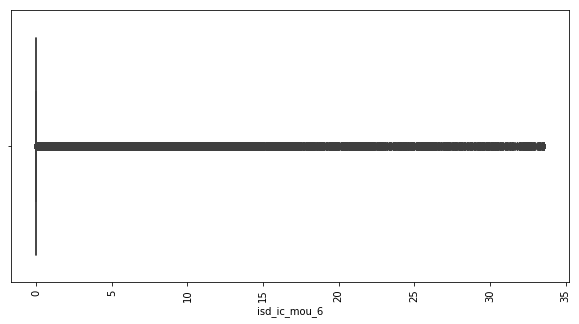

oUTLIERS: isd_ic_mou_7 -23.835 39.725


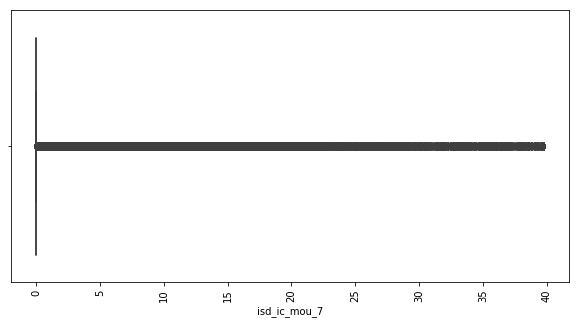

oUTLIERS: isd_ic_mou_8 -20.415 34.025


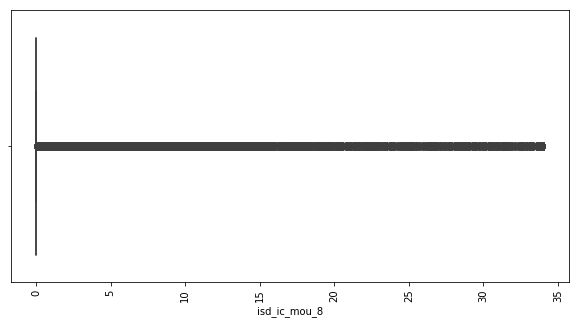

oUTLIERS: ic_others_6 -1.62 2.7


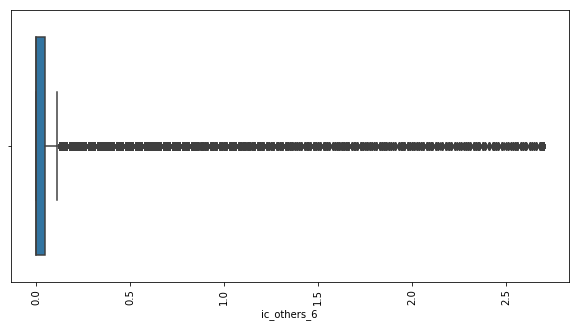

oUTLIERS: ic_others_7 -2.2199999999999998 3.6999999999999997


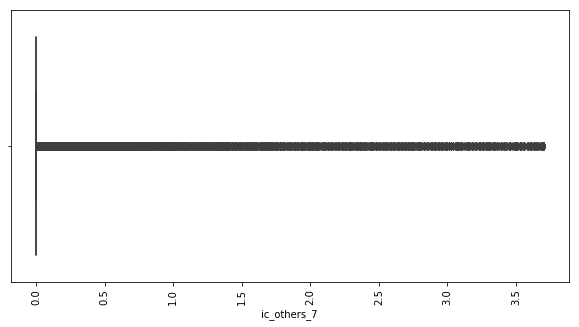

oUTLIERS: ic_others_8 -1.7175 2.8625


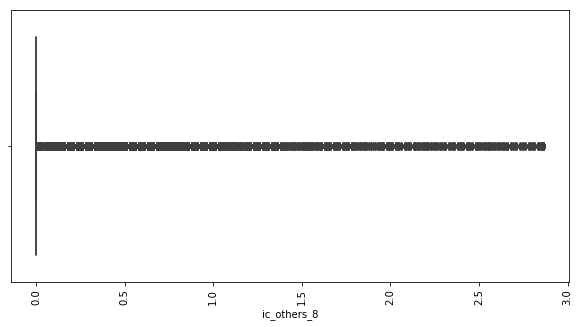

oUTLIERS: total_rech_num_6 -27.0 53.0


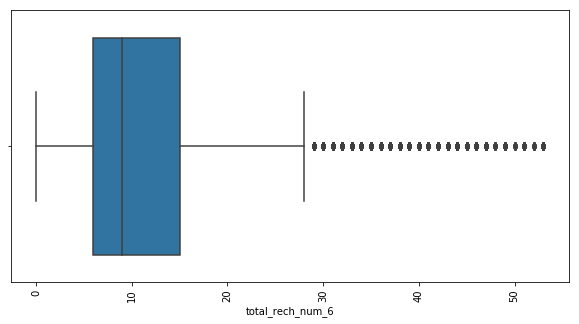

oUTLIERS: total_rech_num_7 -27.0 53.0


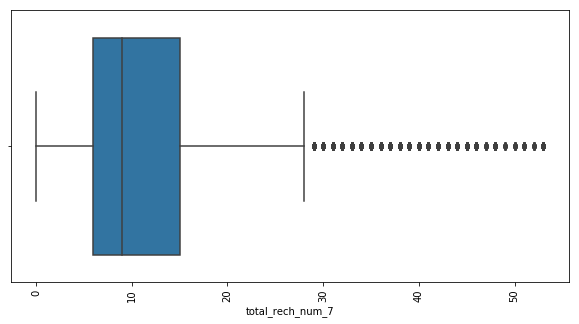

oUTLIERS: total_rech_num_8 -29.0 51.0


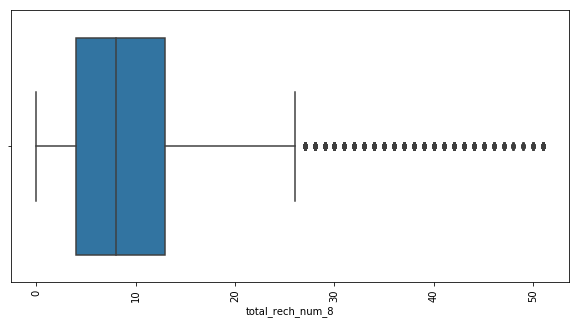

oUTLIERS: total_rech_amt_6 -1470.875 2772.125


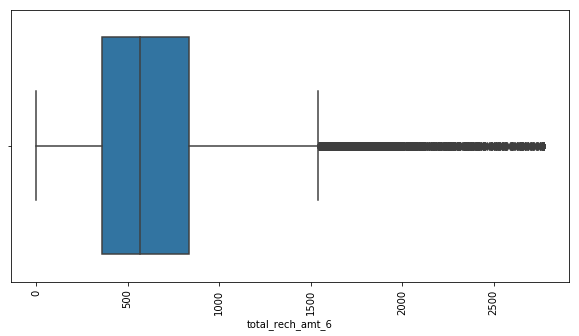

oUTLIERS: total_rech_amt_7 -1517.5 2822.5


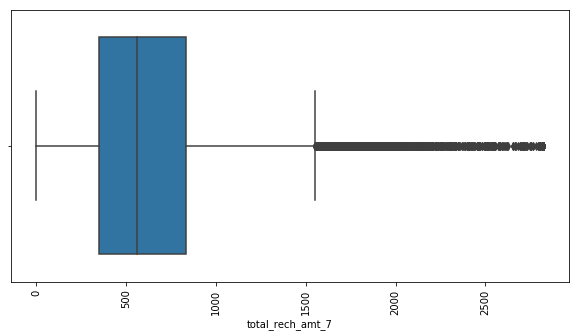

oUTLIERS: total_rech_amt_8 -1723.5 2872.5


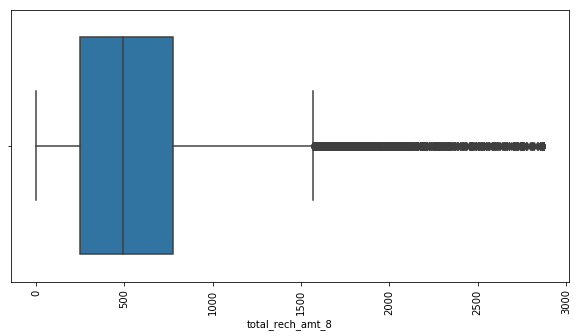

oUTLIERS: max_rech_amt_6 -348.5 647.5


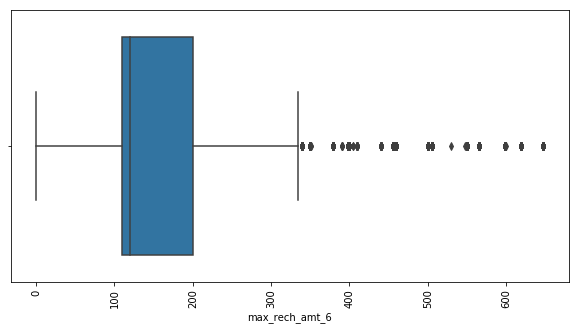

oUTLIERS: max_rech_amt_7 -348.5 647.5


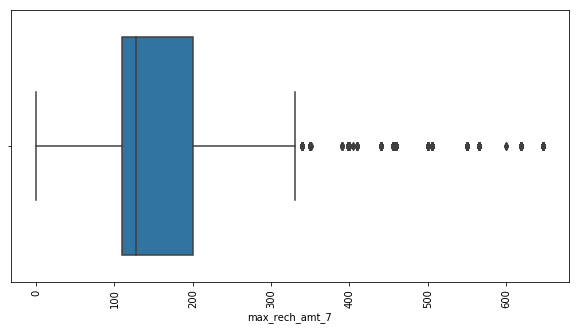

oUTLIERS: max_rech_amt_8 -378.0 630.0


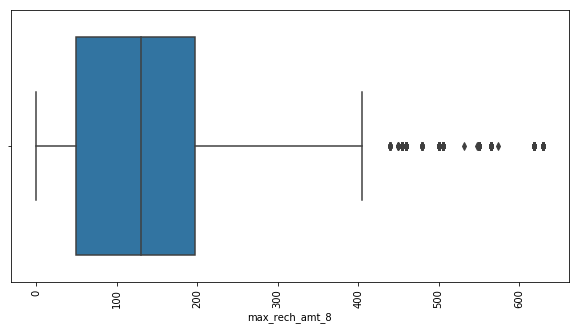

oUTLIERS: last_day_rch_amt_6 -375.0 625.0


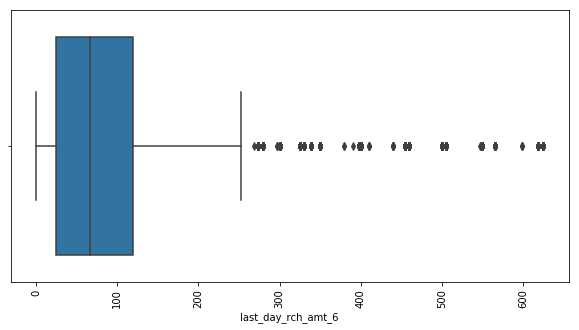

oUTLIERS: last_day_rch_amt_7 -375.0 625.0


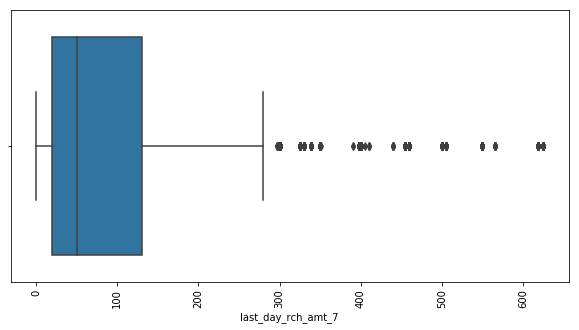

oUTLIERS: last_day_rch_amt_8 -343.5 572.5


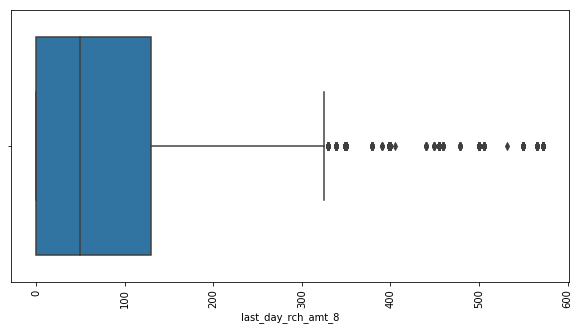

oUTLIERS: total_rech_data_6 -7.5 12.5


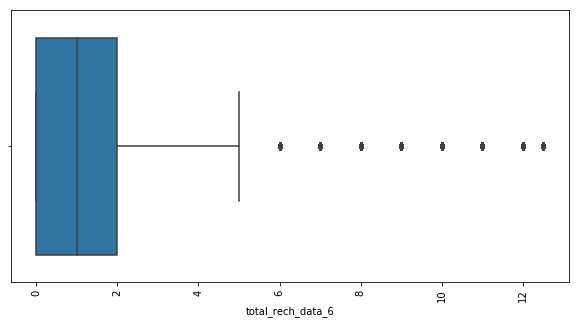

oUTLIERS: total_rech_data_7 -7.5 12.5


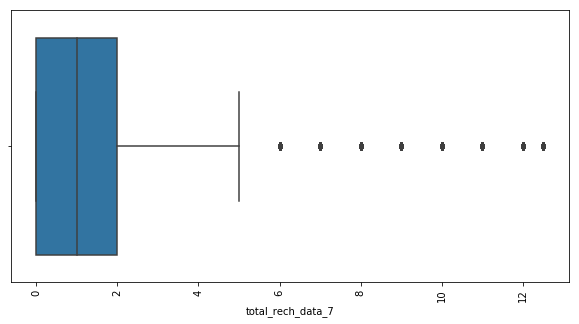

oUTLIERS: total_rech_data_8 -7.5 12.5


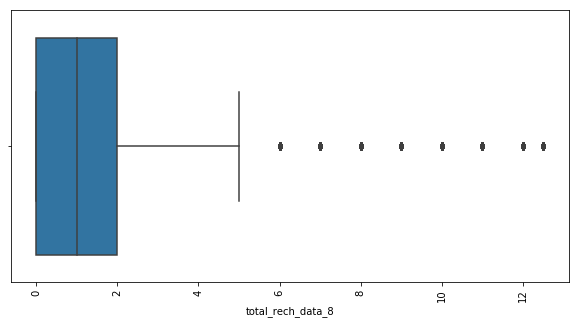

oUTLIERS: max_rech_data_6 -378.0 630.0


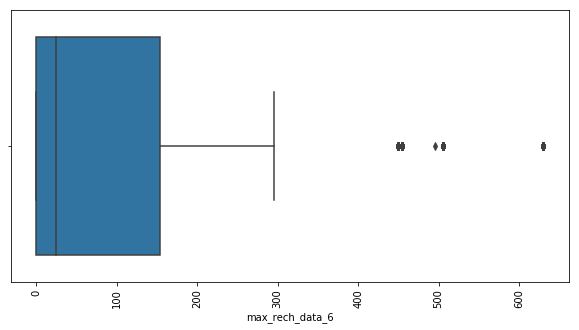

oUTLIERS: max_rech_data_7 -378.0 630.0


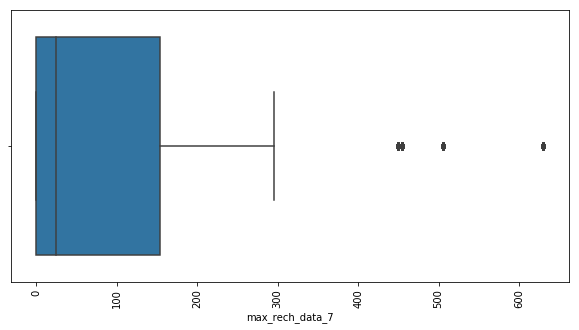

oUTLIERS: max_rech_data_8 -378.0 630.0


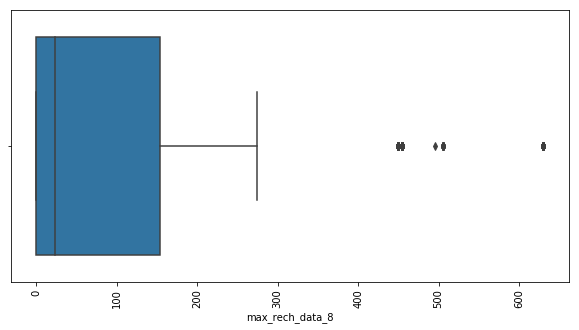

oUTLIERS: count_rech_2g_6 -6.0 10.0


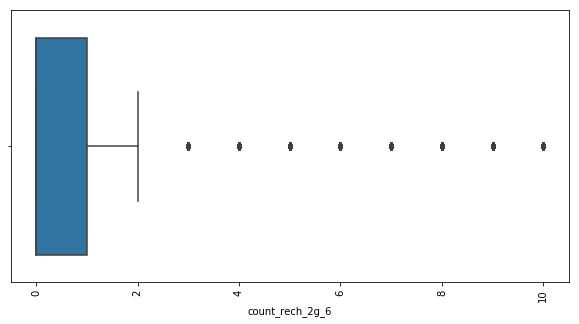

oUTLIERS: count_rech_2g_7 -7.5 12.5


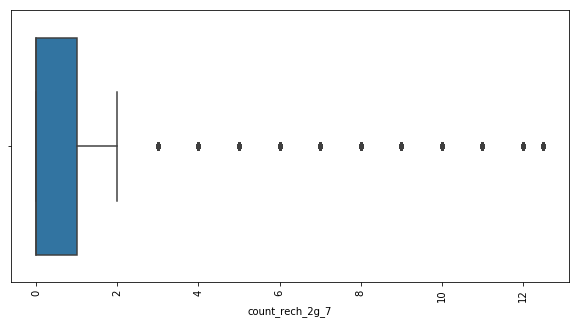

oUTLIERS: count_rech_2g_8 -6.0 10.0


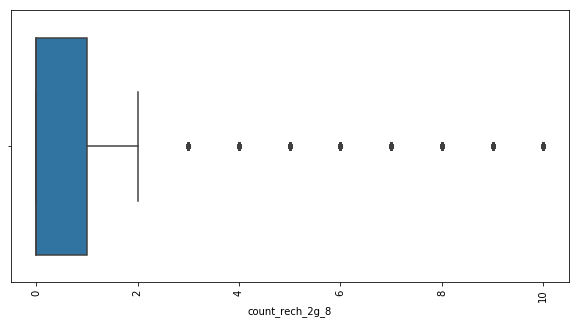

oUTLIERS: count_rech_3g_6 -1.5 2.5


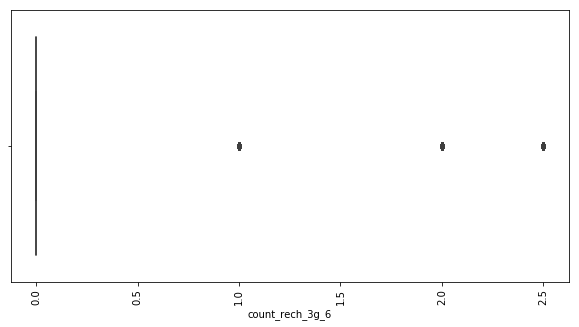

oUTLIERS: count_rech_3g_7 -1.5 2.5


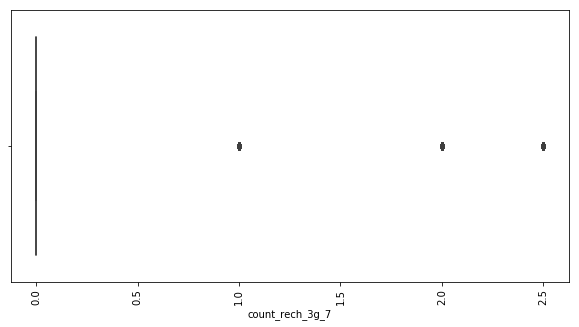

oUTLIERS: count_rech_3g_8 -1.5 2.5


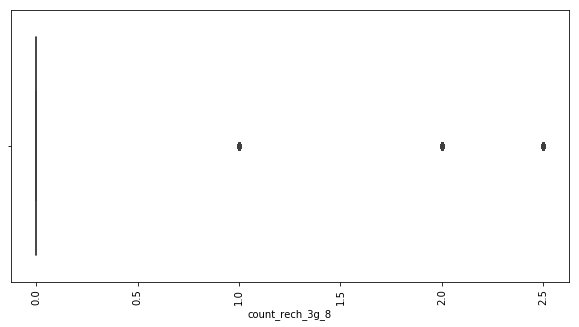

oUTLIERS: av_rech_amt_data_6 -462.0 770.0


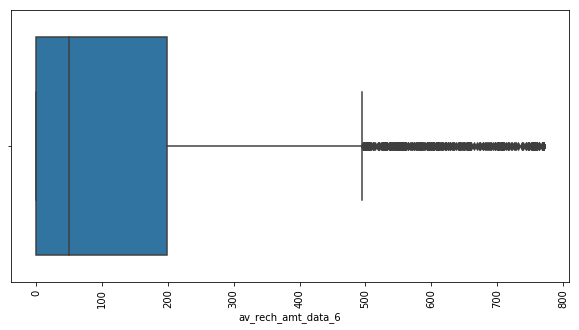

oUTLIERS: av_rech_amt_data_7 -517.5 862.5


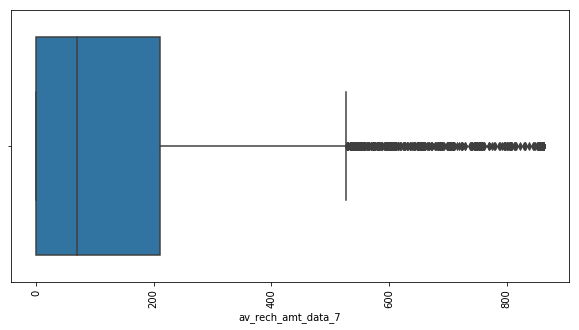

oUTLIERS: av_rech_amt_data_8 -462.0 770.0


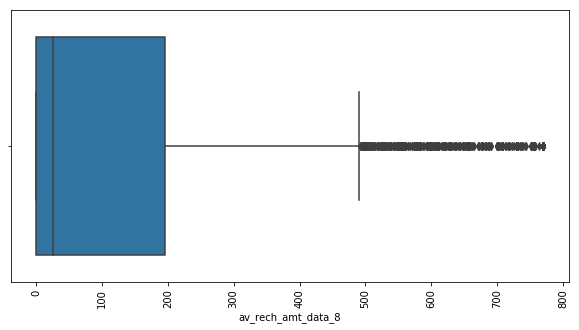

oUTLIERS: vol_2g_mb_6 -615.7725 1026.2875


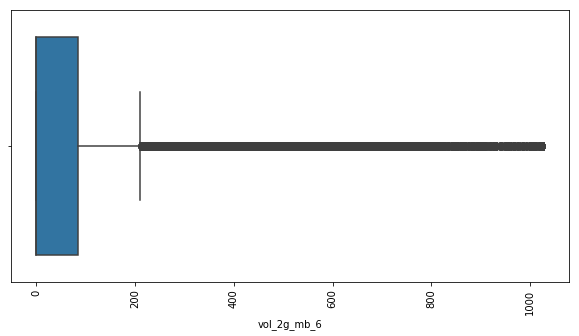

oUTLIERS: vol_2g_mb_7 -600.6825000000001 1001.1375000000002


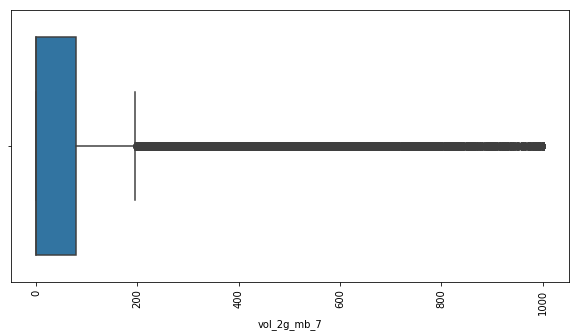

oUTLIERS: vol_2g_mb_8 -478.905 798.175


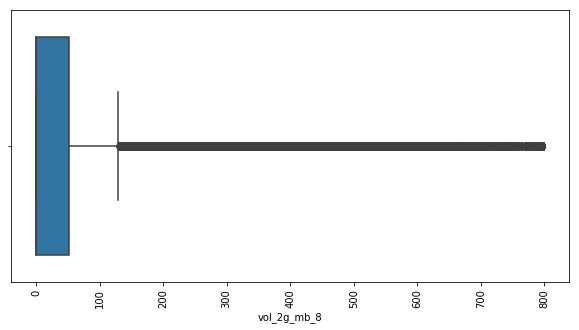

oUTLIERS: vol_3g_mb_6 -1635.7275000000002 2726.2125000000005


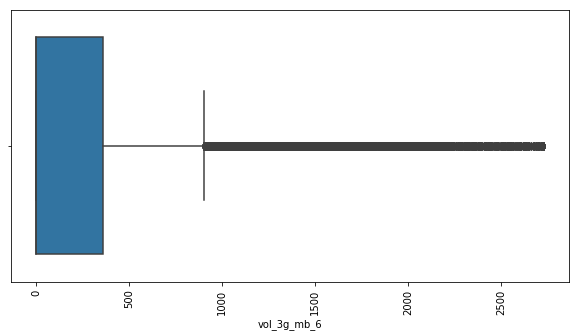

oUTLIERS: vol_3g_mb_7 -1760.355 2933.925


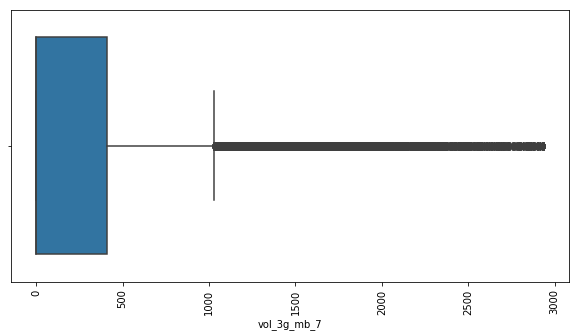

oUTLIERS: vol_3g_mb_8 -1659.5174999999997 2765.8624999999993


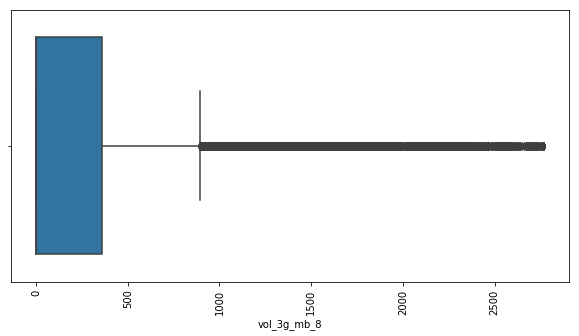

oUTLIERS: arpu_3g_6 -325.4625 542.4375


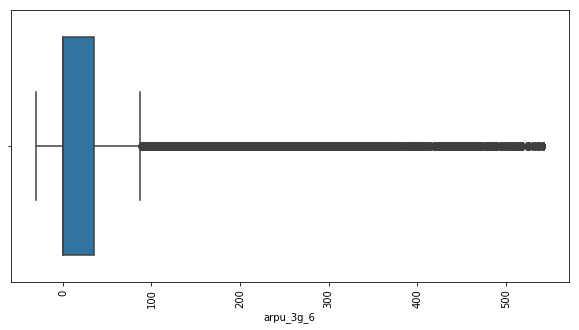

oUTLIERS: arpu_3g_7 -324.2175 540.3625


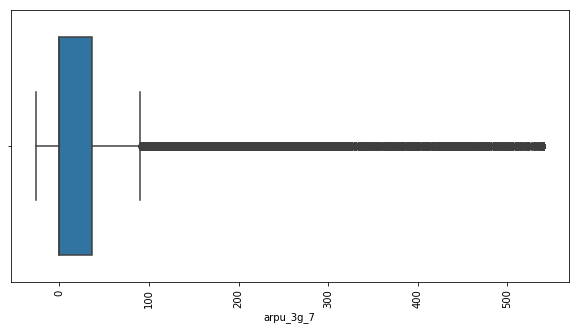

oUTLIERS: arpu_3g_8 -318.6975 531.1625


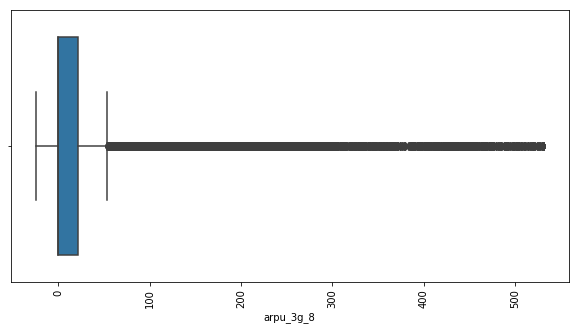

oUTLIERS: arpu_2g_6 -318.255 530.425


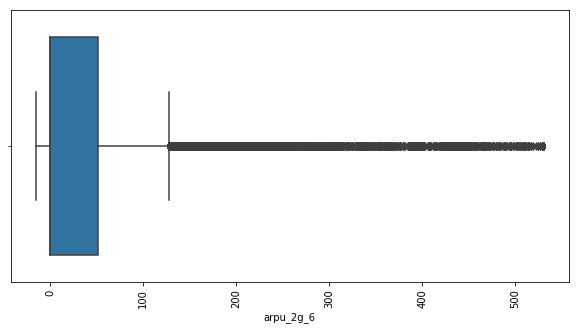

oUTLIERS: arpu_2g_7 -318.255 530.425


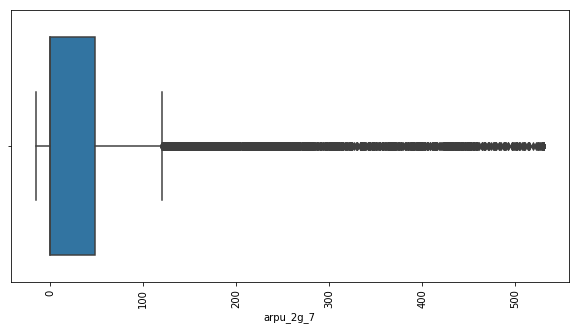

oUTLIERS: arpu_2g_8 -318.255 530.425


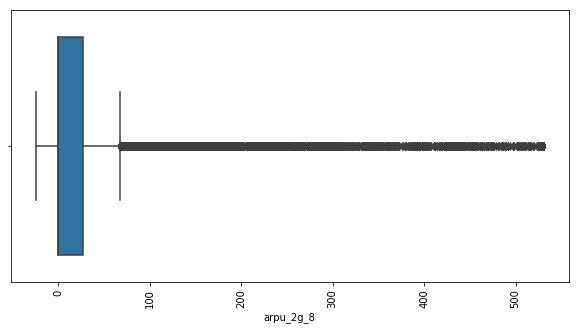

oUTLIERS: night_pck_user_6 0.0 0.0


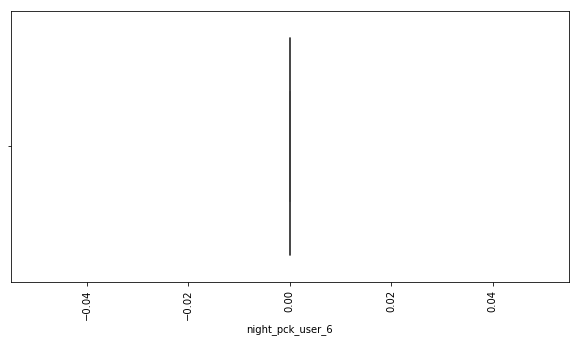

oUTLIERS: night_pck_user_7 0.0 0.0


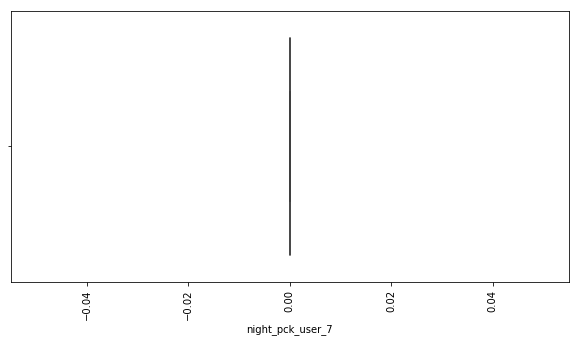

oUTLIERS: night_pck_user_8 0.0 0.0


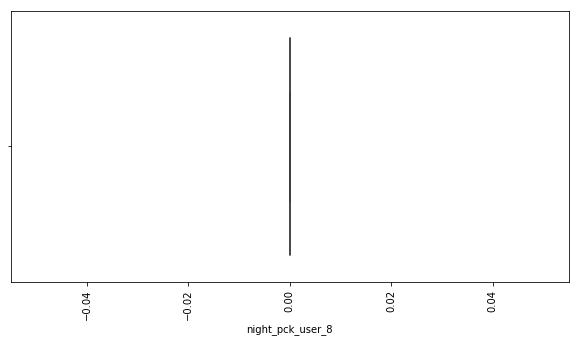

oUTLIERS: monthly_2g_6 -1.5 2.5


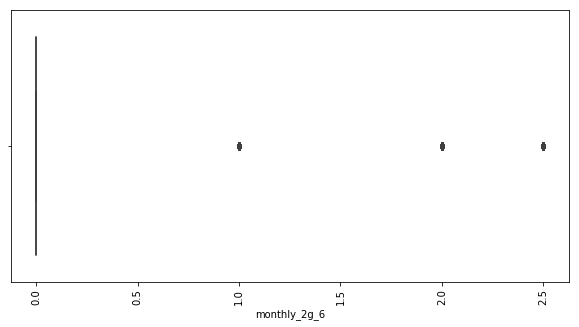

oUTLIERS: monthly_2g_7 -1.5 2.5


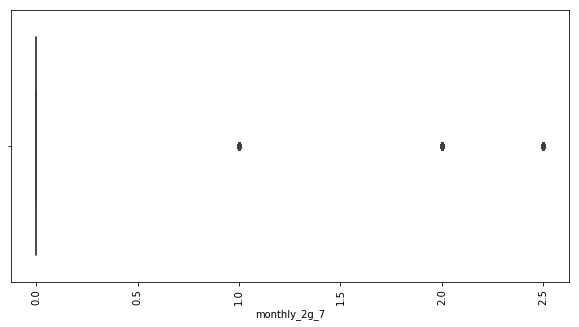

oUTLIERS: monthly_2g_8 -1.5 2.5


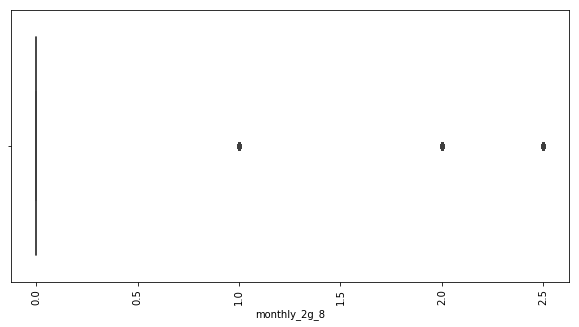

oUTLIERS: sachet_2g_6 -6.0 10.0


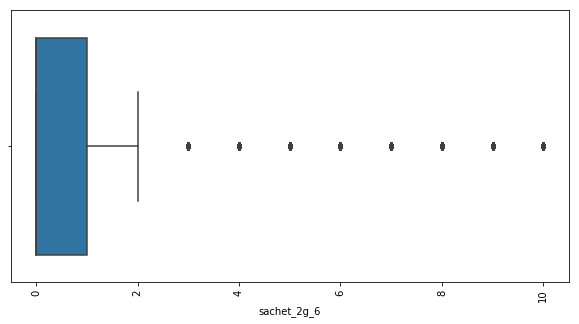

oUTLIERS: sachet_2g_7 -7.5 12.5


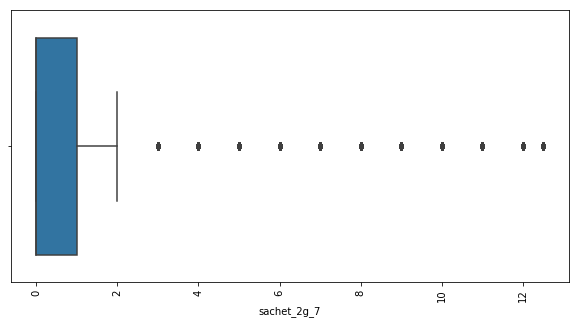

oUTLIERS: sachet_2g_8 -6.0 10.0


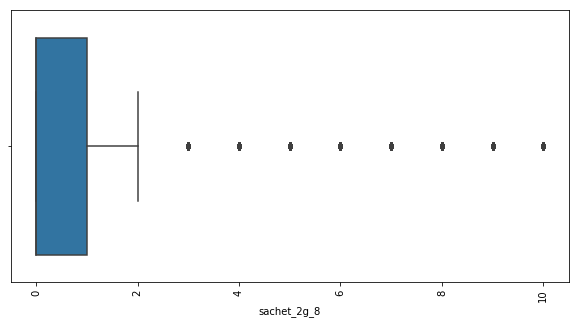

oUTLIERS: monthly_3g_6 -1.5 2.5


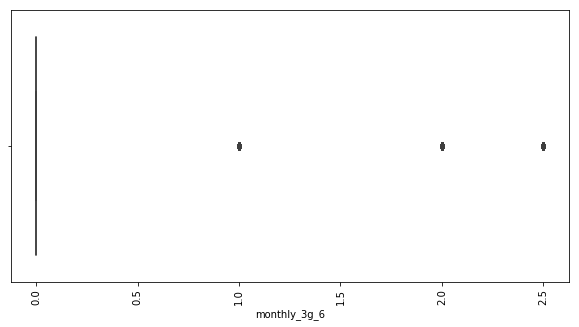

oUTLIERS: monthly_3g_7 -1.5 2.5


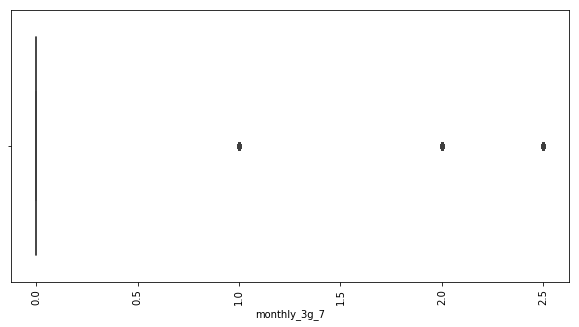

oUTLIERS: monthly_3g_8 -1.5 2.5


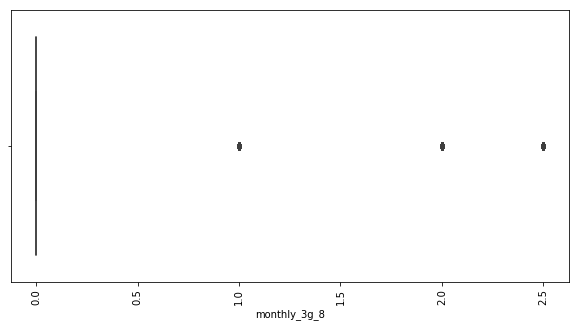

oUTLIERS: sachet_3g_6 -1.5 2.5


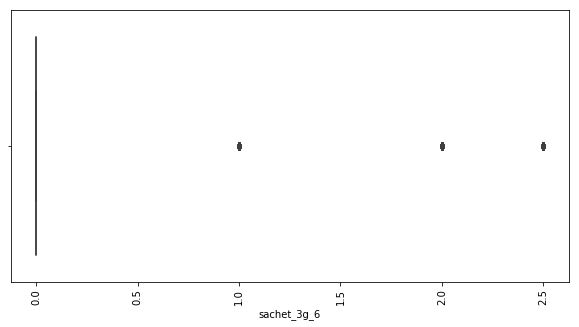

oUTLIERS: sachet_3g_7 -1.5 2.5


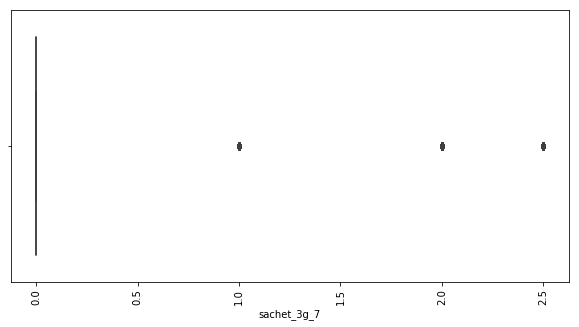

oUTLIERS: sachet_3g_8 0.0 0.0


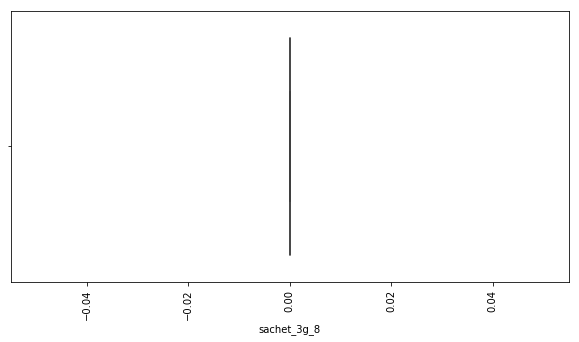

oUTLIERS: fb_user_6 -1.5 2.5


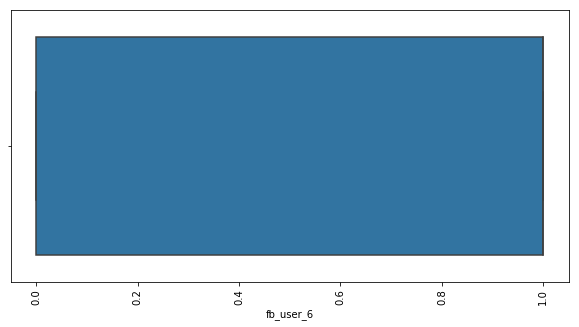

oUTLIERS: fb_user_7 -1.5 2.5


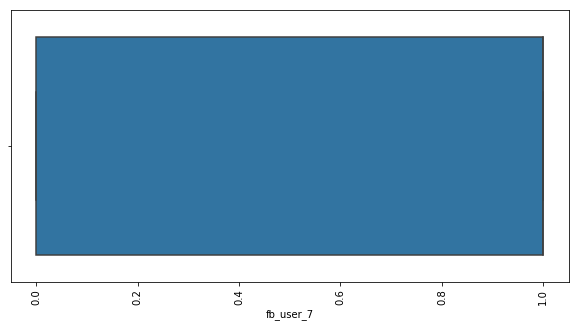

oUTLIERS: fb_user_8 -1.5 2.5


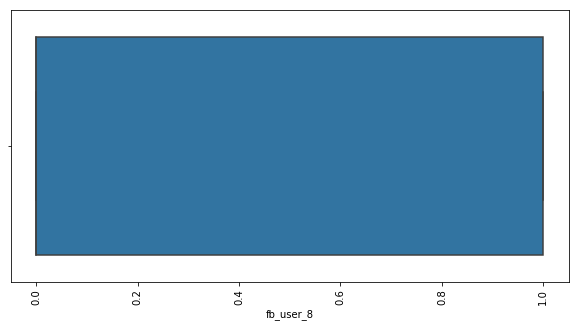

oUTLIERS: aon -3618.75 6639.25


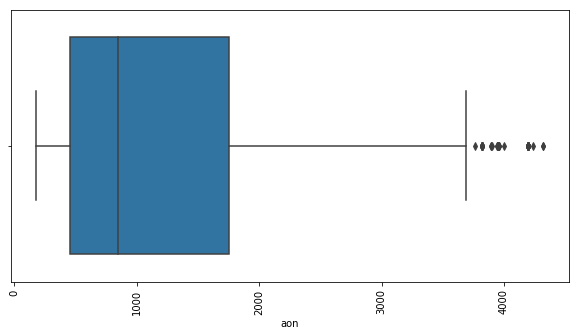

oUTLIERS: aug_vbc_3g -872.685 1454.475


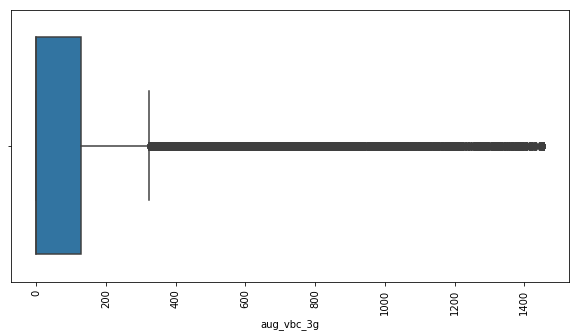

oUTLIERS: jul_vbc_3g -918.78 1531.3


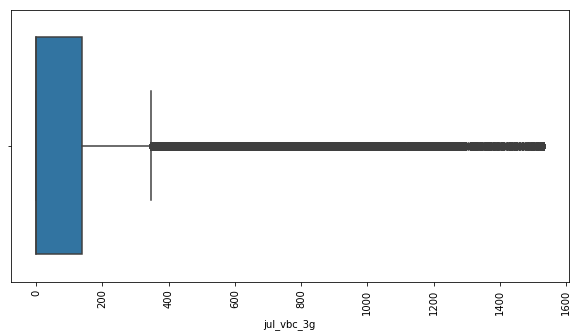

oUTLIERS: jun_vbc_3g -800.3775 1333.9625


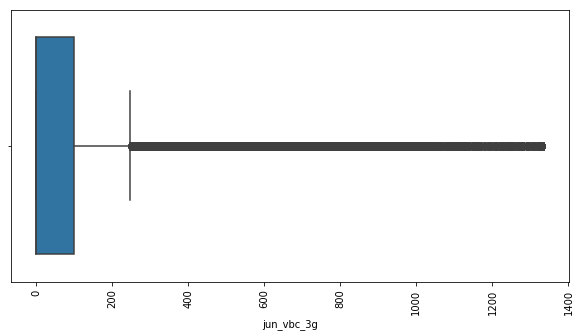

oUTLIERS: sep_vbc_3g -1.395 2.325


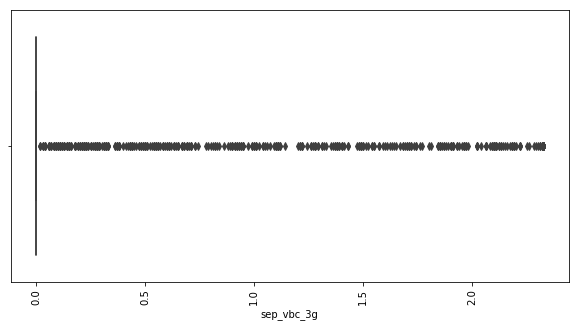

oUTLIERS: avg_rech_amt_6 -156.75 297.25


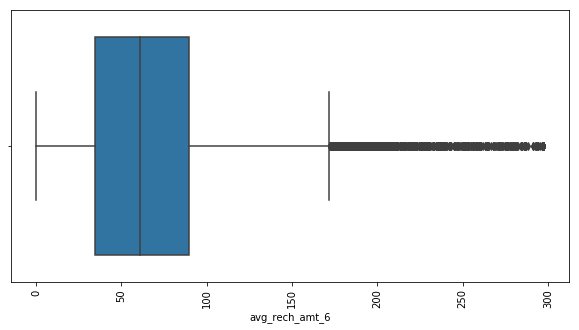

oUTLIERS: avg_rech_amt_7 -171.125 319.875


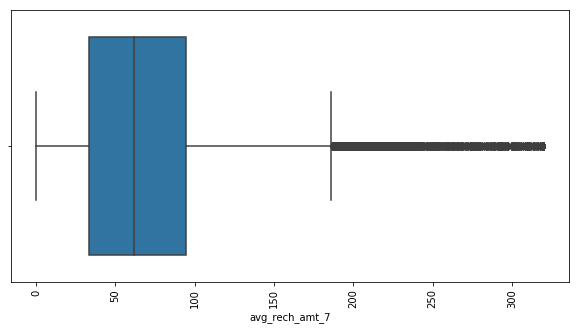

oUTLIERS: avg_rech_amt_8 -230.0 386.0


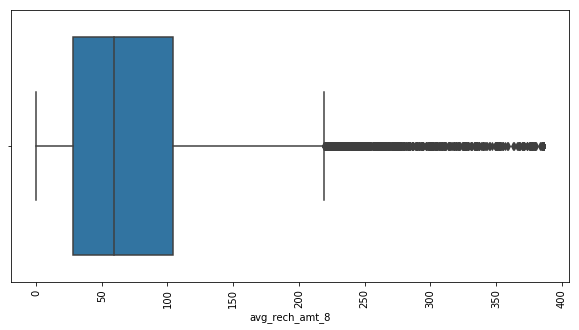

oUTLIERS: total_rech_num_data_6 -7.5 12.5


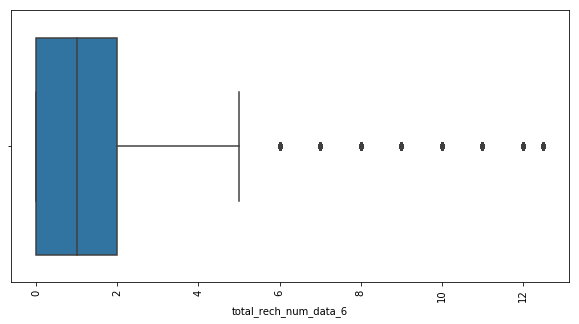

oUTLIERS: total_rech_num_data_7 -7.5 12.5


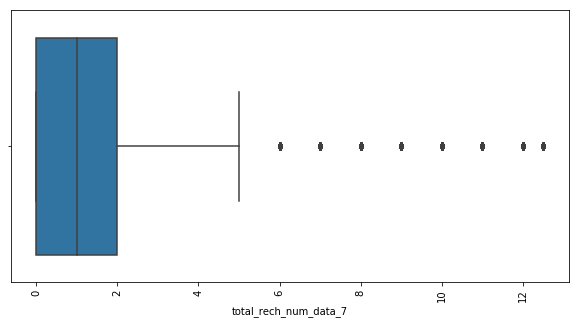

oUTLIERS: total_rech_num_data_8 -7.5 12.5


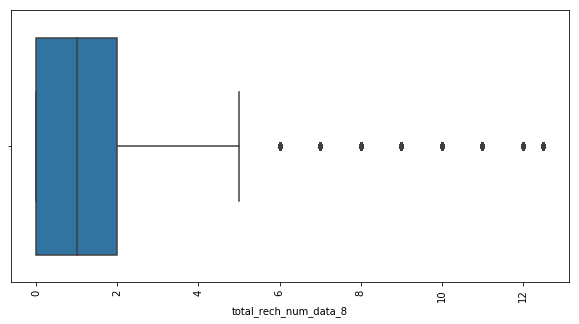

oUTLIERS: total_rech_amt_data_6 -1692.0 2820.0


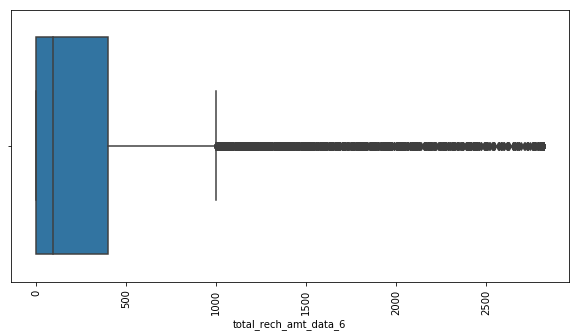

oUTLIERS: total_rech_amt_data_7 -2061.0 3435.0


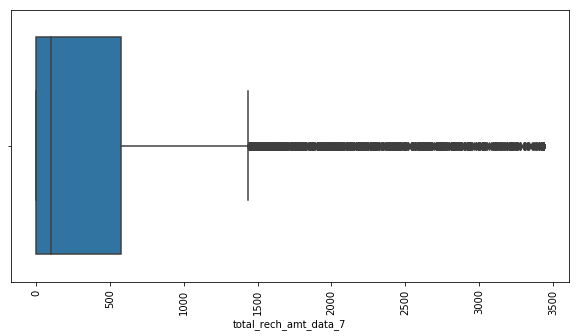

oUTLIERS: total_rech_amt_data_8 -1632.0 2720.0


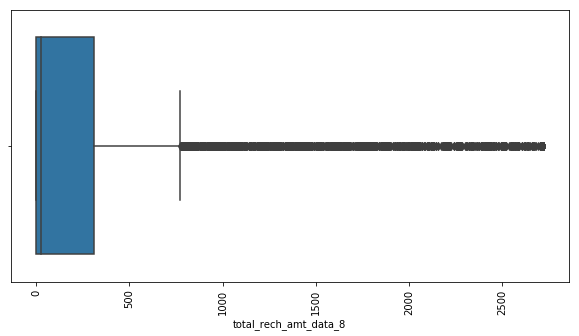

oUTLIERS: total_month_rech_6 -2415.0 4673.0


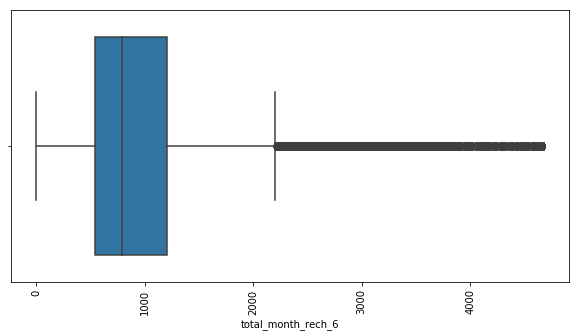

oUTLIERS: total_month_rech_7 -2660.5 5087.5


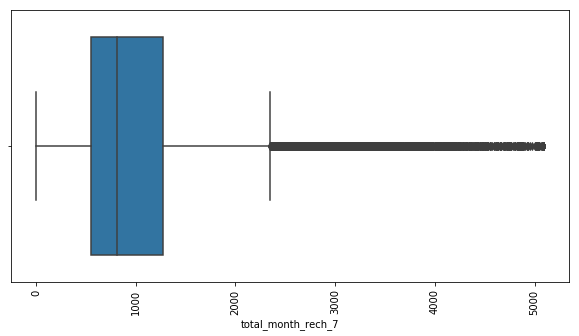

oUTLIERS: total_month_rech_8 -3060.0 5100.0


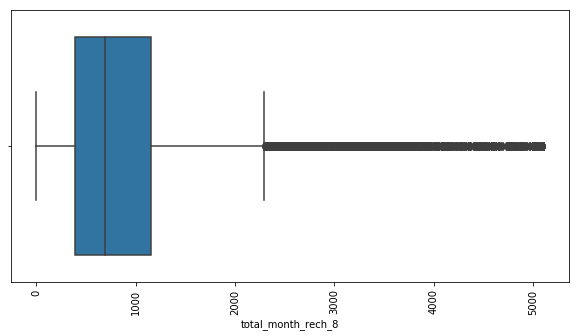

oUTLIERS: Churn 0.0 0.0


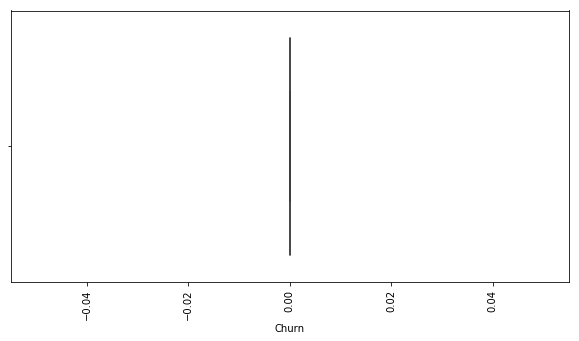

oUTLIERS: Total_revenue_6 -6049756.875 11583838.125


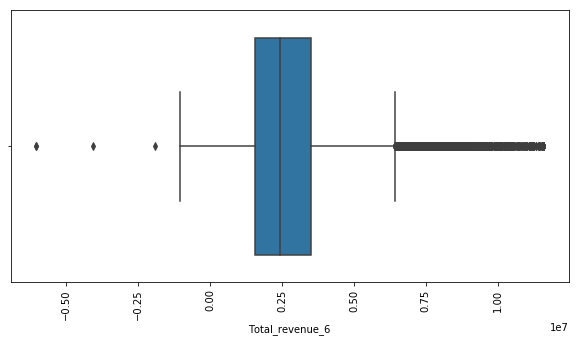

oUTLIERS: Total_revenue_7 -6040200.0 11596400.0


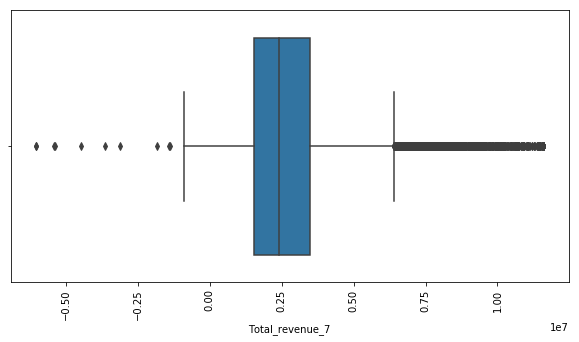

oUTLIERS: Total_revenue_8 -7206922.5 12149737.5


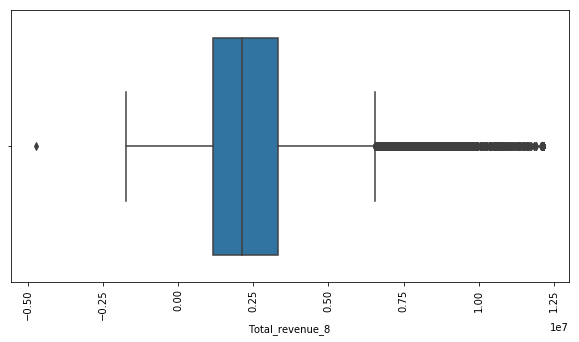

oUTLIERS: Good_Phase -10396731.25 21443558.75


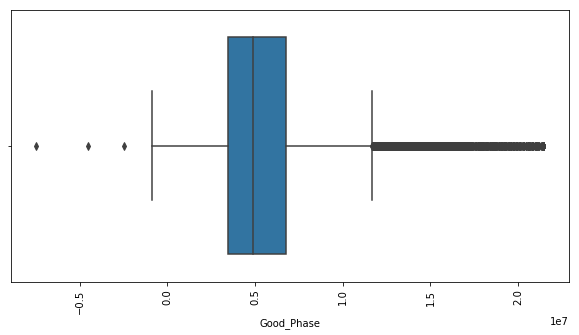

oUTLIERS: Action_Phase -7206922.5 12149737.5


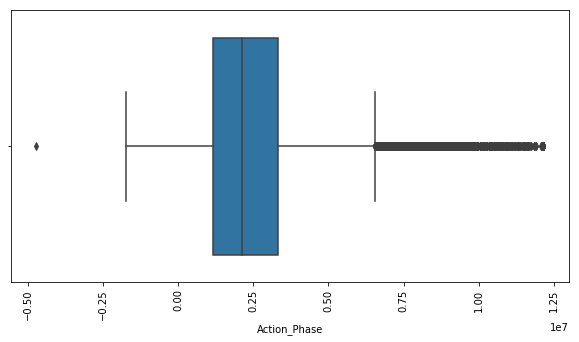

oUTLIERS: Chrun_Phase -7020003.75 11700006.25


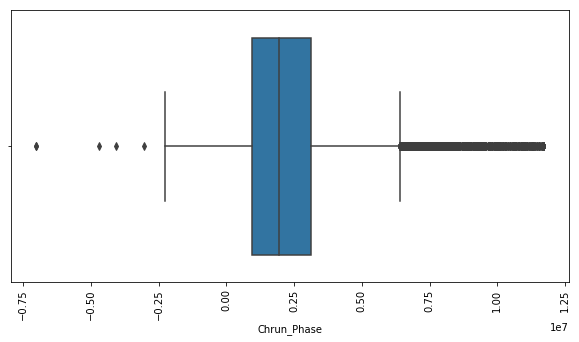

In [75]:
# Removal of the data sets from the outliers.Let us take the lower and upper limits are 0.05 and .9 on the upper. so that we could avoid loosing more data.
test_box_Df2 = list(Highvalu_users.columns) 
new_copy = Highvalu_users[test_box_Df2]
for i in new_copy.columns:
    Q1 = new_copy[i].quantile(0.05)
    Q3 = new_copy[i].quantile(0.90)

    IQR = Q3 - Q1
    
    lower_fence = Q1 - 1.5*IQR
    upper_fence = Q3 + 1.5*IQR

    new_copy[i][new_copy[i] <= lower_fence] = lower_fence
    new_copy[i][new_copy[i] >= upper_fence] = upper_fence
    
    print("oUTLIERS:",i,lower_fence,upper_fence)
    
    plt.figure(1,figsize=(10,5))
    sns.boxplot(new_copy[i])
    plt.xticks(rotation =90,fontsize =10)
    plt.show()

In [76]:
## Inferences : We have cleaned the data and now we can proceed for the modelling which we defined as we took lower ranges of the quartiles due to avoid loss of data

In [77]:
# We have stored the cleaned data in newcopy. Let us check the head again
new_copy.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,...,total_month_rech_6,total_month_rech_7,total_month_rech_8,Churn,Total_revenue_6,Total_revenue_7,Total_revenue_8,Good_Phase,Action_Phase,Chrun_Phase
0,197.385,214.816,213.8030,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,614.0,504.0,504.0,0,986925.0,1074080.0,1069015.0,2061005.0,1069015.0,105500.0
1,1069.180,1349.850,2429.9475,57.84,54.68,52.29,453.43,567.16,325.91,16.23,...,1580.0,790.0,3638.0,0,5345900.0,6749250.0,12149737.5,12095150.0,12149737.5,2500000.0
2,378.721,492.223,137.3620,413.69,351.03,35.08,94.66,80.63,136.48,0.00,...,437.0,955.0,327.0,0,1893605.0,2461115.0,686810.0,4354720.0,686810.0,833935.0
3,514.453,597.753,637.7600,102.41,132.11,85.14,757.93,896.68,983.39,0.00,...,600.0,680.0,718.0,0,2572265.0,2988765.0,3188800.0,5561030.0,3188800.0,2892980.0
4,74.350,193.897,366.9660,48.96,50.66,33.58,85.41,89.36,205.89,0.00,...,0.0,1166.0,979.0,0,371750.0,969485.0,1834830.0,1341235.0,1834830.0,4057400.0


In [78]:
# check the data shape again before modelling.
new_copy.shape

(29906, 171)

## 9. PCA 

In [79]:
# Let us do the PCA to reduce the dimentionality of the data and proceed with the Logistic regression first and move forward to highermodels 

#Improting the PCA module
from sklearn.decomposition import PCA
pca = PCA(svd_solver='randomized', random_state=42)

In [80]:
# apply the PCA
pca.fit(X_train_re)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
  svd_solver='randomized', tol=0.0, whiten=False)

In [81]:
#List of PCA components.It would be the same as the number of variables
pca.components_

array([[-4.81869556e-03, -2.57263990e-03,  1.39242071e-04, ...,
        -3.72978856e-03,  1.39242071e-04,  8.12026559e-04],
       [ 2.06388731e-04,  7.32962728e-03,  1.15413891e-02, ...,
         4.32700863e-03,  1.15413891e-02,  7.72865934e-03],
       [ 7.23251873e-03, -2.82185947e-03,  4.65234594e-03, ...,
         1.74041510e-03,  4.65234594e-03,  3.90078783e-03],
       ...,
       [ 0.00000000e+00, -9.08730104e-08, -6.55193175e-08, ...,
         2.73252954e-07,  5.96124322e-01, -1.97121849e-16],
       [-0.00000000e+00,  7.75094340e-08,  5.41993229e-09, ...,
        -2.57450018e-07,  3.79644870e-01,  2.90530552e-16],
       [ 7.36362931e-01,  7.10306548e-02, -6.29072736e-07, ...,
        -2.46199695e-01,  3.13812872e-07, -6.93889390e-17]])

In [82]:
#Let's check the variance ratios
pca.explained_variance_ratio_[:50]

array([0.53718254, 0.11844641, 0.08294487, 0.0466835 , 0.02485673,
       0.02239093, 0.01660988, 0.01629109, 0.01342661, 0.01184189,
       0.00878391, 0.00782242, 0.00622421, 0.00561049, 0.00504674,
       0.00425253, 0.0038614 , 0.00366186, 0.003485  , 0.0033865 ,
       0.00309713, 0.00299797, 0.00284038, 0.0025981 , 0.00251062,
       0.00235223, 0.00218462, 0.00214787, 0.00210425, 0.00198229,
       0.00178806, 0.00159046, 0.00137197, 0.00133411, 0.00131232,
       0.00120946, 0.00116336, 0.00100002, 0.00097232, 0.0009027 ,
       0.00082708, 0.00080219, 0.00074827, 0.0007305 , 0.00068837,
       0.00067247, 0.00063142, 0.00061814, 0.00061648, 0.00056762])

<BarContainer object of 50 artists>

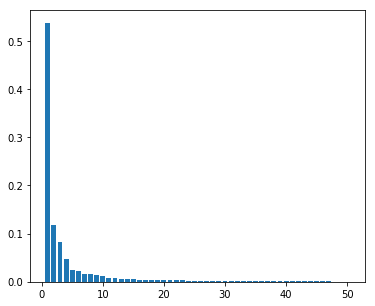

In [83]:
# Import the matplot and visualse the pca variance ratio in a bar graph.
import matplotlib.pyplot as plt
plt.figure(figsize = (6,5))        # Size of the figure

plt.bar(range(1,len(pca.explained_variance_ratio_[:50])+1), pca.explained_variance_ratio_[:50])

In [84]:
# most of the data in the 0 to 2 ranges.  let us see the cummulative vairance ratio.
var_cumu = np.cumsum(pca.explained_variance_ratio_)

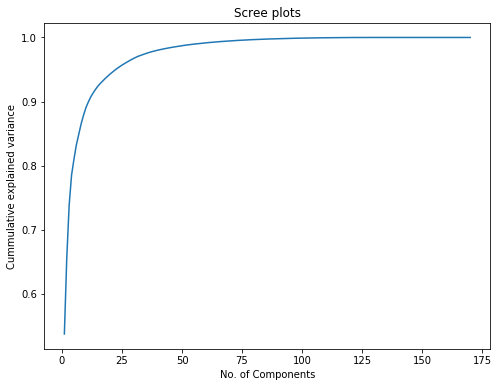

In [85]:
# We can see 0 to 10 most of the data are lying. 
# Make the scree plots cleary for choosing the no. of PCA 
plt.figure(figsize=(8,6))
plt.title('Scree plots')
plt.xlabel('No. of Components')
plt.ylabel('Cummulative explained variance')

plt.plot(range(1,len(var_cumu)+1), var_cumu)
plt.show()

In [86]:
# Looks. we will take 35 components for desctribe the 95% of the varaince in the datasets.

In [87]:
#Using incremental PCA for efficiency - saves a lot of time on larger datasets
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=40)

In [88]:
# let us fit the data
X_train_pca = pca_final.fit_transform(X_train_re)
X_train_pca.shape

(38468, 40)

In [89]:
#creating correlation matrix for the principal components
corrmat = np.corrcoef(X_train_pca.transpose())
# 1s ----> 0s in diagonals
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",corrmat_nodiag.max(), ", min corr: ", corrmat_nodiag.min(),)
# we see that correlations are indeed very close to 0

max corr: 0.009726298919185748 , min corr:  -0.01820604588712157


In [90]:
# Seems there is no correlation int the data sets between any two variables in PCA. We dont have any multicolinearity.

In [91]:
#Applying selected components to the test data - 35 components
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(8972, 40)

For the prediction of churn customers we will be fitting variety of models and select one which is the best predictor of churn. Models trained are,

1. Logistic Regression
2. Decision Tree
3. Random Forest
4. Boosting models - Gradient Boosting Classifier and XGBoost Classifier
5. SVM

## 10. Logistic Regression &PCA:

In [92]:
#Import needed libraries
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

lr = LogisticRegression(class_weight='balanced')

In [93]:
#Fit the algorithm on the data
def model_fit(alg, X_train, y_train, performCV=True, cv_folds=5):
    alg.fit(X_train, y_train)
        
    #Predict training set:
    dtrain_predictions = alg.predict(X_train)
    dtrain_predprob = alg.predict_proba(X_train)[:,1]
    
    #Perform cross-validation:
    if performCV:
        cv_score = cross_val_score(alg, X_train, y_train, cv=cv_folds, scoring='roc_auc')
    
    #Print model report:
    print ("\nModel Summary:")
    print ("Accuracy : %.4g" % metrics.roc_auc_score(y_train, dtrain_predictions))
    print ("Recall/Sensitivity : %.4g" % metrics.recall_score(y_train, dtrain_predictions))
    print ("AUC Score (Train): %f" % metrics.roc_auc_score(y_train, dtrain_predprob))
    
    if performCV:
        print ("CV Score : Mean - %.7g | Std - %.7g | Min - %.7g | Max - %.7g" % (np.mean(cv_score),np.std(cv_score),np.min(cv_score),np.max(cv_score)))

In [94]:
# Let us fit the model. 
model_fit(lr, X_train_pca, y_train_re)


Model Summary:
Accuracy : 0.8284
Recall/Sensitivity : 0.8417
AUC Score (Train): 0.900628
CV Score : Mean - 0.8997186 | Std - 0.002458384 | Min - 0.8974411 | Max - 0.9044004


In [95]:
# Define the Modelmetrics .
def Model_metrics(Actual_churn=False,Predict_churn=False):

    confusion = metrics.confusion_matrix(Actual_churn, Predict_churn)

    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    print("Roc_auc_score : {}".format(metrics.roc_auc_score(Actual_churn, Predict_churn)))
    # Let's see the sensitivity of our logistic regression model
    print('Sensitivity/Recall : {}'.format(TP / float(TP+FN)))
    # Let us calculate specificity
    print('Specificity: {}'.format(TN / float(TN+FP)))
    # Calculate false postive rate - predicting churn when customer does not have churned
    print('False Positive Rate: {}'.format(FP/ float(TN+FP)))
    # positive predictive value 
    print('Positive predictive value: {}'.format(TP / float(TP+FP)))
    # Negative predictive value
    print('Negative Predictive value: {}'.format(TN / float(TN+ FN)))
    # sklearn precision score value 
    print('sklearn precision score value: {}'.format(metrics.precision_score(Actual_churn, Predict_churn)))

In [96]:
# predictions on Test data
pred_probs_test = lr.predict(X_test_pca)
Model_metrics(y_test,pred_probs_test)

Roc_auc_score : 0.8144880206642444
Sensitivity/Recall : 0.8105849582172702
Specificity: 0.8183910831112188
False Positive Rate: 0.1816089168887812
Positive predictive value: 0.27967323402210476
Negative Predictive value: 0.9802641126106516
sklearn precision score value: 0.27967323402210476


In [97]:
# check the accuracy, recall and precision again,
print("Accuracy : {}".format(metrics.accuracy_score(y_test,pred_probs_test)))
print("Recall : {}".format(metrics.recall_score(y_test,pred_probs_test)))
print("Precision : {}".format(metrics.precision_score(y_test,pred_probs_test)))

Accuracy : 0.8177663843067321
Recall : 0.8105849582172702
Precision : 0.27967323402210476


In [98]:
#Making prediction on the test data
pred_probs_train = lr.predict_proba(X_train_pca)[:,1]
print("roc_auc_score(Train) {:2.2}".format(metrics.roc_auc_score(y_train_re, pred_probs_train)))

roc_auc_score(Train) 0.9


In [99]:
# Let us define for the cutoff values
#Function to find the optimal cutoff for classifing as churn/non-churn
# Let's create columns with different probability cutoffs 
def Optimal_Cutoff(df):
    #Function to find the optimal cutoff for classifing as churn/non-churn
    # Let's create columns with different probability cutoffs 
    numbers = [float(x)/10 for x in range(10)]
    for i in numbers:
        df[i] = df.churn_Prob.map( lambda x: 1 if x > i else 0)
    #print(df.head())
    
    # Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
     # TP = confusion[1,1] # true positive 
    # TN = confusion[0,0] # true negatives
    # FP = confusion[0,1] # false positives
    # FN = confusion[1,0] # false negatives
    
    cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
    
    from sklearn.metrics import confusion_matrix
    
    num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    for i in num:
        cm1 = metrics.confusion_matrix(df.churn, df[i] )
        total1=sum(sum(cm1))
        accuracy = (cm1[0,0]+cm1[1,1])/total1
        
        speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
        sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
        cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
    print(cutoff_df)
    
    # Let's plot accuracy sensitivity and specificity for various probabilities.
    cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
    plt.show()

In [100]:
def predictChurnWithProb(model,X,y,prob):
    # Funtion to predict the churn using the input probability cut-off
    # Input arguments: model instance, x and y to predict using model and cut-off probability
    
    # predict
    pred_probs = model.predict_proba(X)[:,1]
    
    y_df= pd.DataFrame({'churn':y, 'churn_Prob':pred_probs})
    # Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
    y_df['final_predicted'] = y_df.churn_Prob.map( lambda x: 1 if x > prob else 0)
    # Let's see the head
    Model_metrics(y_df.churn,y_df.final_predicted)
    return y_df

In [101]:
cut_off_prob=0.5
y_train_df = predictChurnWithProb(lr,X_train_pca,y_train_re,cut_off_prob)
y_train_df.head()

Roc_auc_score : 0.8283768326921077
Sensitivity/Recall : 0.8416865966517625
Specificity: 0.8150670687324529
False Positive Rate: 0.18493293126754706
Positive predictive value: 0.8198622505823965
Negative Predictive value: 0.8373571199658156
sklearn precision score value: 0.8198622505823965


,churn,churn_Prob,final_predicted
0,0,0.764598,1
1,0,0.013876,0
2,0,0.123787,0
3,0,0.032589,0
4,0,0.824896,1


##### Let Draw the ROC curve:

It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).

The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.

The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [102]:
# Let us define the roc curveL
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

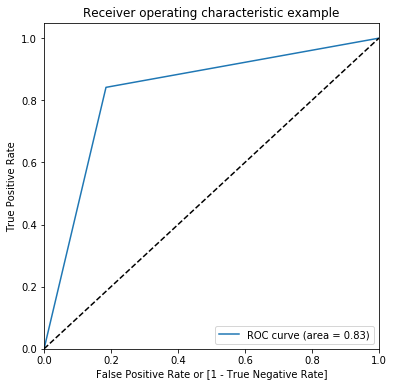

(array([0.        , 0.18493293, 1.        ]),
 array([0.       , 0.8416866, 1.       ]),
 array([2, 1, 0], dtype=int64))

In [103]:
# Check the ROC curve
draw_roc(y_train_df.churn, y_train_df.final_predicted)

In [104]:
# the ROC curve should be on the top left. showing good fit.

In [105]:

#draw_roc(y_pred_final.Churn, y_pred_final.predicted)
print("roc_auc_score : {:2.2f}".format(metrics.roc_auc_score(y_train_df.churn, y_train_df.final_predicted)))

roc_auc_score : 0.83


Finding Optimal Cutoff Point:
A trade off between sensitivity(or recall) and specificity is to be considered in doing so.We need to tune the probability to get a better tradeoff for sensitivity and specificity
# finding cut-off with the right balance of the metrices
# sensitivity vs specificity trade-off
findOptimalCutoff(y_train_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.672923  0.981699  0.364147
0.2   0.2  0.742929  0.954352  0.531507
0.3   0.3  0.785328  0.919881  0.650775
0.4   0.4  0.814053  0.884839  0.743267
0.5   0.5  0.828377  0.841687  0.815067
0.6   0.6  0.828975  0.781065  0.876885
0.7   0.7  0.813273  0.710773  0.915774
0.8   0.8  0.776230  0.601643  0.950816
0.9   0.9  0.601695  0.218311  0.985079


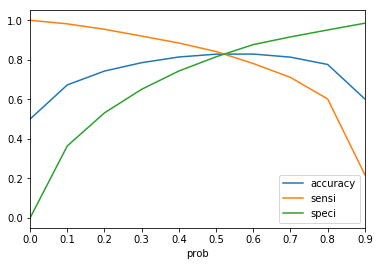

In [106]:

# finding cut-off with the right balance of the metrices
# sensitivity vs specificity trade-off
Optimal_Cutoff(y_train_df)

In [107]:
# Note that the cutoff is between the 0.5 to 0.6. we choose to take the 0.52. at this point there will be balance of accuracy, sensitivity and specificity


In [108]:
# predicting with the choosen cut-off on train
cut_off_prob = 0.52
A = predictChurnWithProb(lr,X_train_pca,y_train_re,cut_off_prob)
A.head()

Roc_auc_score : 0.8297026099615266
Sensitivity/Recall : 0.8319642300093584
Specificity: 0.8274409899136945
False Positive Rate: 0.1725590100863055
Positive predictive value: 0.8282180011386574
Negative Predictive value: 0.8312007102940409
sklearn precision score value: 0.8282180011386574


,churn,churn_Prob,final_predicted
0,0,0.764598,1
1,0,0.013876,0
2,0,0.123787,0
3,0,0.032589,0
4,0,0.824896,1


In [109]:
# Let us predict on the test set

# predicting with the choosen cut-off on test
B = predictChurnWithProb(lr,X_test_pca,y_test,cut_off_prob)
B.head()

Roc_auc_score : 0.8159739213130731
Sensitivity/Recall : 0.8008356545961003
Specificity: 0.831112188030046
False Positive Rate: 0.16888781196995395
Positive predictive value: 0.2920264093448451
Negative Predictive value: 0.9795801799228901
sklearn precision score value: 0.2920264093448451


,churn,churn_Prob,final_predicted
4265,0,0.454994,0
29221,0,0.587183,1
974,0,0.389371,0
1602,0,0.315994,0
10225,0,0.161361,0


### Conclusion on Logistic regression & PCA 

**A) Train Set :**

Roc_auc_score : 0.82

Sensitivity/Recall : 0.83

Specificity: 0.82

**B) for test set:**

Roc_auc_score : 0.81

Sensitivity/Recall : 0.80

Specificity: 0.83



## 11. Decision Tree:

In [110]:
# let us apply the Decision tree with PCA and Hyperparameters and fit.

Dt = DecisionTreeClassifier(class_weight='balanced',
                             max_features='auto',
                             min_samples_split=100,
                             min_samples_leaf=100,
                             max_depth=6,
                             random_state=10)
model_fit(Dt, X_train_pca, y_train_re)


Model Summary:
Accuracy : 0.7872
Recall/Sensitivity : 0.8145
AUC Score (Train): 0.861680
CV Score : Mean - 0.8366197 | Std - 0.007413873 | Min - 0.825181 | Max - 0.8446376


In [111]:
# make predictions
pred_probs_test = Dt.predict(X_test_pca)
#Let's check the model metrices.
Model_metrics(Actual_churn=y_test,Predict_churn=pred_probs_test)

Roc_auc_score : 0.7369069980757198
Sensitivity/Recall : 0.713091922005571
Specificity: 0.7607220741458687
False Positive Rate: 0.23927792585413132
Positive predictive value: 0.20587052673904302
Negative Predictive value: 0.9682343870470316
sklearn precision score value: 0.20587052673904302


In [112]:

# Create the parameter grid based on the results of random search 
param_grid = {'max_depth': range(5,15,3),'min_samples_leaf': range(100, 400, 50),'min_samples_split': range(100, 400, 100),
    'max_features': [8,10,15]}
# Create a based model
dt = DecisionTreeClassifier(class_weight='balanced',random_state=10)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = dt, param_grid = param_grid, 
                          cv = 3, n_jobs = 4,verbose = 1,scoring="f1_weighted")

In [113]:
# Fit the grid search to the data
grid_search.fit(X_train_pca, y_train_re)

Fitting 3 folds for each of 216 candidates, totalling 648 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    9.5s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   23.5s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:  1.1min
[Parallel(n_jobs=4)]: Done 648 out of 648 | elapsed:  1.8min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=DecisionTreeClassifier(class_weight='balanced', criterion='gini',
            max_depth=None, max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=10,
            splitter='best'),
       fit_params=None, iid='warn', n_jobs=4,
       param_grid={'max_depth': range(5, 15, 3), 'min_samples_leaf': range(100, 400, 50), 'min_samples_split': range(100, 400, 100), 'max_features': [8, 10, 15]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1_weighted', verbose=1)

In [114]:
# printing the optimal accuracy score and hyperparameters
print('Recall score',grid_search.best_score_)

Recall score 0.8073337755731108


In [115]:
# model with the best hyperparameters
dt_final = DecisionTreeClassifier(class_weight='balanced',
                             max_depth=14,
                             min_samples_leaf=100, 
                             min_samples_split=100,
                             max_features=15,
                             random_state=10)

In [116]:
# fit th model and get the model summary:
model_fit(dt_final,X_train_pca,y_train_re)


Model Summary:
Accuracy : 0.8324
Recall/Sensitivity : 0.8334
AUC Score (Train): 0.917693
CV Score : Mean - 0.8909724 | Std - 0.004395324 | Min - 0.8826847 | Max - 0.8953174


In [117]:
# make predictions in the test data
pred_probs_test = dt_final.predict(X_test_pca)
#Let's check the model metrices.
Model_metrics(Actual_churn=y_test,Predict_churn=pred_probs_test)

Roc_auc_score : 0.7690121376113412
Sensitivity/Recall : 0.7158774373259053
Specificity: 0.8221468378967773
False Positive Rate: 0.1778531621032227
Positive predictive value: 0.2593340060544904
Negative Predictive value: 0.9708154506437768
sklearn precision score value: 0.2593340060544904


In [118]:
# classification report
print(classification_report(y_test,pred_probs_test))

              precision    recall  f1-score   support

           0       0.97      0.82      0.89      8254
           1       0.26      0.72      0.38       718

   micro avg       0.81      0.81      0.81      8972
   macro avg       0.62      0.77      0.64      8972
weighted avg       0.91      0.81      0.85      8972



In [119]:
# After tunning aslo, we can see we get 71% of the churn.
# predicting churn with default cut-off 0.5
cut_off_prob = 0.5
y_train_df = predictChurnWithProb(dt_final,X_train_pca,y_train_re,cut_off_prob)
y_train_df.head()


Roc_auc_score : 0.8323801601330976
Sensitivity/Recall : 0.8334199854424457
Specificity: 0.8313403348237496
False Positive Rate: 0.1686596651762504
Positive predictive value: 0.8316903600705614
Negative Predictive value: 0.833072835261019
sklearn precision score value: 0.8316903600705614


,churn,churn_Prob,final_predicted
0,0,0.460000,0
1,0,0.010989,0
2,0,0.010000,0
3,0,0.177419,0
4,0,0.630000,1


     prob  accuracy     sensi     speci
0.0   0.0  0.584330  1.000000  0.168660
0.1   0.1  0.729359  0.987782  0.470937
0.2   0.2  0.781481  0.966102  0.596860
0.3   0.3  0.805527  0.943382  0.667672
0.4   0.4  0.824192  0.900749  0.747634
0.5   0.5  0.832380  0.833420  0.831340
0.6   0.6  0.827987  0.789799  0.866174
0.7   0.7  0.807528  0.699283  0.915774
0.8   0.8  0.769263  0.585370  0.953156
0.9   0.9  0.682359  0.376781  0.987938


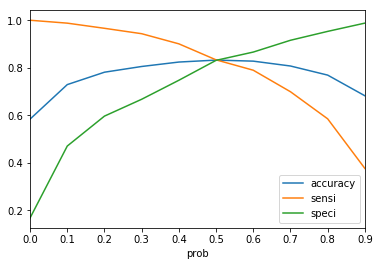

In [120]:
# finding cut-off with the right balance of the metrices
Optimal_Cutoff(y_train_df)

In [121]:
# We can see that the cut off value is between 0.5 to 0.6. Let us chck again the cutoff as 0.52 and run again.
cut_off_prob = 0.5
y_train_df = predictChurnWithProb(dt_final,X_train_pca,y_train_re,cut_off_prob)
y_train_df.head()

Roc_auc_score : 0.8323801601330976
Sensitivity/Recall : 0.8334199854424457
Specificity: 0.8313403348237496
False Positive Rate: 0.1686596651762504
Positive predictive value: 0.8316903600705614
Negative Predictive value: 0.833072835261019
sklearn precision score value: 0.8316903600705614


,churn,churn_Prob,final_predicted
0,0,0.460000,0
1,0,0.010989,0
2,0,0.010000,0
3,0,0.177419,0
4,0,0.630000,1


In [122]:
# At 0.52 we can see there is a balance in the sensitivity, specificity and acccuracy.


In [123]:

#Lets see how it performs on test data.
y_test_df= predictChurnWithProb(dt_final,X_test_pca,y_test,cut_off_prob)
y_test_df.head()

Roc_auc_score : 0.7690121376113412
Sensitivity/Recall : 0.7158774373259053
Specificity: 0.8221468378967773
False Positive Rate: 0.1778531621032227
Positive predictive value: 0.2593340060544904
Negative Predictive value: 0.9708154506437768
sklearn precision score value: 0.2593340060544904


,churn,churn_Prob,final_predicted
4265,0,0.228395,0
29221,0,0.161111,0
974,0,0.256684,0
1602,0,0.538462,1
10225,0,0.183673,0


### Conclusions:

**A) Train data**

Accuracy score : 0.83

Sensitivity/Recall : 0.83

Specificity: 0.83

**B) Test data**

Accuracy score : 0.76

Sensitivity/Recall : 0.70

Specificity: 0.82



## 12. Random Forest:

In [124]:
# Again let us appy the Random forest pca and hypertuning with maxdepth
parameters = {'max_depth': range(10, 30, 5)}
rfc = RandomForestClassifier()
rfgs = GridSearchCV(rfc, parameters,n_jobs=-1,
                    cv=5, 
                   scoring="f1")
rfgs.fit(X_train_pca,y_train_re)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'max_depth': range(10, 30, 5)}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score='warn', scoring='f1', verbose=0)

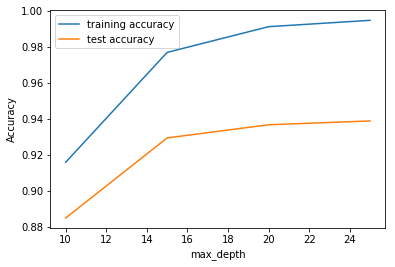

In [125]:
scores = rfgs.cv_results_
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [126]:
# We can see that the max_depth after 20th both the curves there were no significant change observed.

In [127]:
# Let us tune with the n_estimators 
parameters = {'n_estimators': range(50, 150, 25)}
rf1 = RandomForestClassifier(max_depth=20,n_jobs=-1,random_state=10)
rfgs = GridSearchCV(rf1, parameters, 
                    cv=3, 
                   scoring="recall")

In [128]:
# AGain fit the parameters

rfgs.fit(X_train_pca,y_train_re)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=20, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=-1,
            oob_score=False, random_state=10, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'n_estimators': range(50, 150, 25)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='recall', verbose=0)

In [129]:
# plotting accuracies with max_depth
def plt_traintest_acc(score,param):
    scores = score
    plt.figure()
    plt.plot(scores["param_"+param], 
    scores["mean_train_score"], 
    label="training accuracy")
    plt.plot(scores["param_"+param], 
    scores["mean_test_score"], 
    label="test accuracy")
    plt.xlabel(param)
    plt.ylabel("f1")
    plt.legend()
    plt.show()

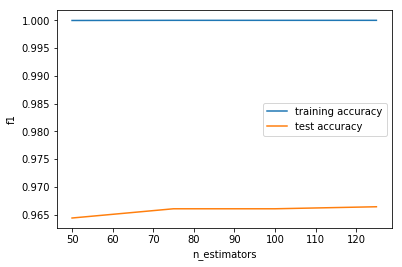

In [130]:
# check the plot
plt_traintest_acc(rfgs.cv_results_,'n_estimators')

In [131]:
# We can see between 70 to 80, let us take 80 as our n_estimators 

In [132]:
# Max features tuning with 80 
parameters = {'max_features': [4, 8, 14, 20, 24]}
rf3 = RandomForestClassifier(max_depth=20,n_estimators=80,n_jobs=-1,random_state=10)
rfgs = GridSearchCV(rf3, parameters,cv=5,scoring="f1")

In [133]:
# Let us fit again and check 
rfgs.fit(X_train_pca,y_train_re)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=20, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=80, n_jobs=-1,
            oob_score=False, random_state=10, verbose=0, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'max_features': [4, 8, 14, 20, 24]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1', verbose=0)

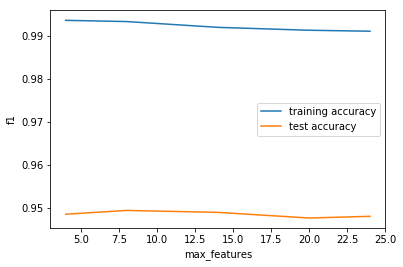

In [134]:
# check the acc. max features
plt_traintest_acc(rfgs.cv_results_,'max_features')

In [135]:
# As we see that at the 7.5 and later it is declining. 
# Let us tune the min sample leaf
parameters = {'min_samples_leaf': range(100, 400, 50)}
rf4 = RandomForestClassifier(max_depth=20,n_estimators=80,max_features=8,n_jobs=-1,random_state=10)
rfgs = GridSearchCV(rf4, parameters,cv=3, scoring="f1")


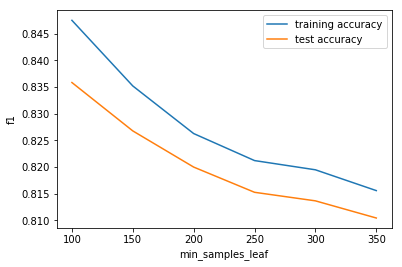

In [136]:
# Let us fit again and plt the curve 
rfgs.fit(X_train_pca,y_train_re)
plt_traintest_acc(rfgs.cv_results_,'min_samples_leaf')

In [137]:
# As we see that the Min samples leaf is 100.
# let us tune min samples split.
parameters = {'min_samples_split': range(50, 300, 50)}
rf5 = RandomForestClassifier(max_depth=20,n_estimators=80,max_features=8,n_jobs=-1,min_samples_leaf=100,random_state=10)
rfgs = GridSearchCV(rf5, parameters,cv=3,scoring="f1")

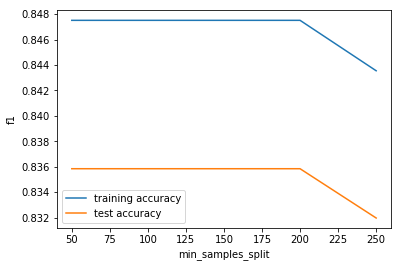

In [138]:
## Let us fit again and plt the curve 
rfgs.fit(X_train_pca,y_train_re)
plt_traintest_acc(rfgs.cv_results_,'min_samples_split')

In [139]:
# the min samples split is 50 later almost flat and it is declining at 200.
# Final - tunned in all aspects 

rf_final = RandomForestClassifier(max_depth=20,n_estimators=80,n_jobs=-1,max_features=8,min_samples_leaf=100,min_samples_split=50,random_state=10)

In [140]:
# check the train set.
model_fit(rf_final,X_train_pca,y_train_re)


Model Summary:
Accuracy : 0.8598
Recall/Sensitivity : 0.8553
AUC Score (Train): 0.939649
CV Score : Mean - 0.9220308 | Std - 0.003190788 | Min - 0.9165704 | Max - 0.9260594


In [141]:
# predict on test data
predictions = rf_final.predict(X_test_pca)

In [142]:
# Check the model metrics in test predictions
Model_metrics(y_test,predictions)

Roc_auc_score : 0.7973885203291322
Sensitivity/Recall : 0.7367688022284122
Specificity: 0.8580082384298522
False Positive Rate: 0.1419917615701478
Positive predictive value: 0.31099353321575546
Negative Predictive value: 0.9740063265025444
sklearn precision score value: 0.31099353321575546


In [143]:
# After fine tunning we can see the recall is for the final Random forest is only 73% with 80% accuracy.

In [144]:
# Let us check the cutoff optimal value as we did for the other models
# predicting churn with default cut-off 0.5
cut_off_prob=0.5
y_train_df = predictChurnWithProb(rf_final,X_train_pca,y_train_re,cut_off_prob)
y_train_df.head()

Roc_auc_score : 0.8597535614016845
Sensitivity/Recall : 0.8552563169387543
Specificity: 0.8642508058646148
False Positive Rate: 0.13574919413538525
Positive predictive value: 0.8630187293426368
Negative Predictive value: 0.8565466068944195
sklearn precision score value: 0.8630187293426368


,churn,churn_Prob,final_predicted
0,0,0.534249,1
1,0,0.050150,0
2,0,0.214368,0
3,0,0.214830,0
4,0,0.799864,1


     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.598471  0.999948  0.196995
0.2   0.2  0.737210  0.993501  0.480919
0.3   0.3  0.818343  0.964334  0.672351
0.4   0.4  0.854580  0.915930  0.793231
0.5   0.5  0.859754  0.855256  0.864251
0.6   0.6  0.846860  0.775606  0.918114
0.7   0.7  0.814989  0.673391  0.956587
0.8   0.8  0.736040  0.489342  0.982739
0.9   0.9  0.603437  0.209057  0.997816


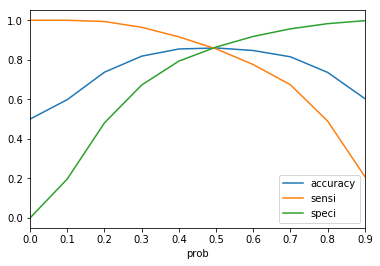

In [145]:
# Let us see the cut-off with the metrics of accuracy, sensitvity and specificity
Optimal_Cutoff(y_train_df)

In [146]:
# We can see the optimal value is lying in 0.5 to 0.6. let us take as 0.52
cut_off_prob=0.52
A = predictChurnWithProb(rf_final,X_train_pca,y_train_re,cut_off_prob)
A.head()

Roc_auc_score : 0.8590516793178746
Sensitivity/Recall : 0.8411146927316211
Specificity: 0.8769886659041282
False Positive Rate: 0.1230113340958719
Positive predictive value: 0.872411561691113
Negative Predictive value: 0.8466171451515759
sklearn precision score value: 0.872411561691113


,churn,churn_Prob,final_predicted
0,0,0.534249,1
1,0,0.050150,0
2,0,0.214368,0
3,0,0.214830,0
4,0,0.799864,1


In [147]:
# Make the prediction on the test:
y_test_df= predictChurnWithProb(rf_final,X_test_pca,y_test,cut_off_prob)
y_test_df.head()

Roc_auc_score : 0.7912137476351467
Sensitivity/Recall : 0.7144846796657381
Specificity: 0.8679428156045553
False Positive Rate: 0.13205718439544464
Positive predictive value: 0.3200249532127261
Negative Predictive value: 0.972180757226218
sklearn precision score value: 0.3200249532127261


,churn,churn_Prob,final_predicted
4265,0,0.373259,0
29221,0,0.296170,0
974,0,0.661381,1
1602,0,0.281235,0
10225,0,0.193917,0


### Conclusions:
Random Forest:

**A) Train set:**

Roc_auc_score : 0.85

Sensitivity/Recall : 0.84

Specificity: 0.87

**B) Test set:**

Roc_auc_score : 0.79

Sensitivity/Recall : 0.71

Specificity: 0.86

## 13.Boosting Models:

In [148]:
# Gradient boosing classifier with PCA and hypertuning 
# Impor the needed libraries
from sklearn.ensemble import GradientBoostingClassifier  

# Fitting the default GradientBoostingClassifier
Gb = GradientBoostingClassifier(random_state=10)
model_fit(Gb, X_train_pca, y_train_re)


Model Summary:
Accuracy : 0.8569
Recall/Sensitivity : 0.857
AUC Score (Train): 0.928573
CV Score : Mean - 0.9209584 | Std - 0.003251067 | Min - 0.9157847 | Max - 0.9255222


In [149]:
# Let us tune the n_estimators
param_test_1 = {'n_estimators':range(20,150,10)}
gsearch_1 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1, min_samples_split=500,min_samples_leaf=50,max_depth=8,max_features='sqrt',subsample=0.8,random_state=10), 
param_grid = param_test_1, scoring='f1',n_jobs=4,iid=False, cv=3)
gsearch_1.fit(X_train_pca, y_train_re)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=8,
              max_features='sqrt', max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=50, min_sa...      subsample=0.8, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False),
       fit_params=None, iid=False, n_jobs=4,
       param_grid={'n_estimators': range(20, 150, 10)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1', verbose=0)

In [150]:
# Let us check the best n_estimators first
print('gsearch_1.best_params_\ngsearch1.best_score_')

gsearch_1.best_params_
gsearch1.best_score_


In [151]:
# check the score and n_estimators
print("The best n_estimators: {}".format(gsearch_1.best_params_))
print("The best score: {}".format(gsearch_1.best_score_))


The best n_estimators: {'n_estimators': 140}
The best score: 0.9110299273404517


In [152]:
# Let us use the n_estimators =140 and tune the hyperparameters of max depth min samples spli & Learning rate is taken as 0.1.
param_test_2 = {'max_depth':range(5,16,2), 'min_samples_split':range(200,1001,200)}
gsearch_2 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1, n_estimators=140, max_features='sqrt', subsample=0.8, random_state=10), 
param_grid = param_test_2, scoring='f1',n_jobs=4,iid=False, cv=3)
gsearch_2.fit(X_train_pca, y_train_re)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features='sqrt', max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_sam...      subsample=0.8, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False),
       fit_params=None, iid=False, n_jobs=4,
       param_grid={'max_depth': range(5, 16, 2), 'min_samples_split': range(200, 1001, 200)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1', verbose=0)

In [153]:
# check the score and hyper tune parameters
print("The best max depth & min samples split: {}".format(gsearch_2.best_params_))
print("The best score: {}".format(gsearch_2.best_score_))


The best max depth & min samples split: {'max_depth': 15, 'min_samples_split': 200}
The best score: 0.9515890870977528


In [154]:
# Let us tune the hyperparameters of  min samples leaf.
param_test_3 = {'min_samples_leaf':range(30,71,10)}
gsearch_3 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1,n_estimators=140,max_depth = 15,min_samples_split =200, max_features='sqrt', subsample=0.8, random_state=10), 
param_grid = param_test_3, scoring='f1',n_jobs=4,iid=False, cv=3)
gsearch_3.fit(X_train_pca, y_train_re)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=15,
              max_features='sqrt', max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_sa...      subsample=0.8, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False),
       fit_params=None, iid=False, n_jobs=4,
       param_grid={'min_samples_leaf': range(30, 71, 10)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1', verbose=0)

In [155]:
# check again the score and hyper tune parameter min_samples_leaf
print("The best min_samples_leaf: {}".format(gsearch_3.best_params_))
print("The best score: {}".format(gsearch_3.best_score_))

The best min_samples_leaf: {'min_samples_leaf': 30}
The best score: 0.9505855560957662


In [156]:
# Check again the Max_features hypertuning and do the gridsearch.
param_test_4 = {'max_features':range(7,20,2)}
gsearch_4 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1,n_estimators=140,max_depth=15, min_samples_split=200, min_samples_leaf=30, subsample=0.8, random_state=10),
param_grid = param_test_4, scoring='f1',n_jobs=4,iid=False, cv=3)
gsearch_4.fit(X_train_pca, y_train_re)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=15,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=30, min_sam...      subsample=0.8, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False),
       fit_params=None, iid=False, n_jobs=4,
       param_grid={'max_features': range(7, 20, 2)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1', verbose=0)

In [157]:
# check again the score and hyper tune parameter 
print("The best max_features: {}".format(gsearch_4.best_params_))
print("The best score: {}".format(gsearch_4.best_score_))

The best max_features: {'max_features': 19}
The best score: 0.9538521835837549


In [158]:
# The Final Model for Gradient boosting with max_features =19 
Gb_final = GradientBoostingClassifier(learning_rate=0.1,n_estimators=140,max_features=19,max_depth=15, min_samples_split=200, min_samples_leaf=40, subsample=0.8, random_state=10)
model_fit(Gb_final, X_train_pca, y_train_re)


Model Summary:
Accuracy : 0.9999
Recall/Sensitivity : 1
AUC Score (Train): 1.000000
CV Score : Mean - 0.9897496 | Std - 0.001172286 | Min - 0.9884862 | Max - 0.9916945


In [159]:
# predictions on Test data & check the metrics on test data
test_predict = Gb_final.predict(X_test_pca)
Model_metrics(y_test,test_predict)

Roc_auc_score : 0.7525631195611749
Sensitivity/Recall : 0.5626740947075209
Specificity: 0.9424521444148292
False Positive Rate: 0.05754785558517082
Positive predictive value: 0.459613196814562
Negative Predictive value: 0.961201037934017
sklearn precision score value: 0.459613196814562


In [160]:
# Let us do the predict the churn for the default cutoff and fine tune later.
cut_off_prob=0.5
y_train_df = predictChurnWithProb(Gb_final,X_train_pca,y_train_re,cut_off_prob)
y_train_df.head()

Roc_auc_score : 0.9998960174690652
Sensitivity/Recall : 1.0
Specificity: 0.9997920349381304
False Positive Rate: 0.0002079650618696059
Positive predictive value: 0.9997920781786048
Negative Predictive value: 1.0
sklearn precision score value: 0.9997920781786048


,churn,churn_Prob,final_predicted
0,0,0.015764,0
1,0,0.003528,0
2,0,0.011301,0
3,0,0.017075,0
4,0,0.112056,0


     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.977436  1.000000  0.954872
0.2   0.2  0.994255  1.000000  0.988510
0.3   0.3  0.998596  1.000000  0.997192
0.4   0.4  0.999662  1.000000  0.999324
0.5   0.5  0.999896  1.000000  0.999792
0.6   0.6  0.999974  1.000000  0.999948
0.7   0.7  1.000000  1.000000  1.000000
0.8   0.8  0.999740  0.999480  1.000000
0.9   0.9  0.993059  0.986118  1.000000


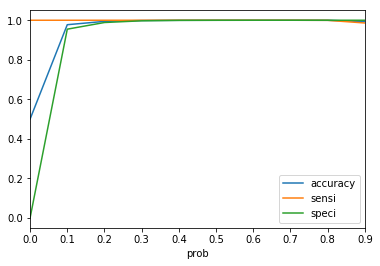

In [161]:
# let see the optimal cutoff:
Optimal_Cutoff(y_train_df)

In [162]:
# We can see that the optimal cutoff points between 0.2 to 0.3. let us take as 0.2 and proceed.
cut_off_prob=0.2
A = predictChurnWithProb(Gb_final,X_train_pca,y_train_re,cut_off_prob)
A.head()

Roc_auc_score : 0.9942549651658522
Sensitivity/Recall : 1.0
Specificity: 0.9885099303317043
False Positive Rate: 0.011490069668295726
Positive predictive value: 0.9886404523258803
Negative Predictive value: 1.0
sklearn precision score value: 0.9886404523258803


,churn,churn_Prob,final_predicted
0,0,0.015764,0
1,0,0.003528,0
2,0,0.011301,0
3,0,0.017075,0
4,0,0.112056,0


In [163]:
# Let us do predict in the test data:
y_test_df= predictChurnWithProb(Gb_final,X_test_pca,y_test,cut_off_prob)
y_test_df.head()

Roc_auc_score : 0.7924288249202042
Sensitivity/Recall : 0.6949860724233984
Specificity: 0.88987157741701
False Positive Rate: 0.11012842258299006
Positive predictive value: 0.3544034090909091
Negative Predictive value: 0.9710470650449498
sklearn precision score value: 0.3544034090909091


,churn,churn_Prob,final_predicted
4265,0,0.660561,1
29221,0,0.027891,0
974,0,0.350811,1
1602,0,0.005007,0
10225,0,0.027484,0


### Conclusions:

The Model in the training data is completely overfitting as we see sensitivity and accuracy is 0.1 as we see it has lower performance in the test set.

**A)Train set**

Roc_auc_score : 0.99

Sensitivity/Recall : 1.0

Specificity: 0.98

**B)Test set**

Roc_auc_score : 0.79

Sensitivity/Recall : 0.69

Specificity: 0.88

## Let us do with the Xgboosting:

In [164]:
# Import the needed libraries
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
# Fitting the XGBClassifier
XGb = XGBClassifier(learning_rate =0.1,n_estimators=1000,max_depth=5,min_child_weight=1,gamma=0,subsample=0.8,colsample_bytree=0.8,
                    objective= 'binary:logistic',nthread=4,scale_pos_weight=1,seed=27)

In [165]:
# Model fit and performance on Train data
model_fit(XGb, X_train_pca, y_train_re)


Model Summary:
Accuracy : 0.9989
Recall/Sensitivity : 0.9998
AUC Score (Train): 0.999998
CV Score : Mean - 0.9878012 | Std - 0.001491175 | Min - 0.9864242 | Max - 0.9899268


In [166]:
# Let us tune the hyperparameters one by one
param_test_1 = {'max_depth':range(3,10,2),'min_child_weight':range(1,6,2)}
gsearch_1 = GridSearchCV(estimator = XGBClassifier( learning_rate =0.1, n_estimators=140, max_depth=5,
             min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,objective= 'binary:logistic', nthread=4, scale_pos_weight=1, seed=27), 
            param_grid = param_test_1, scoring='f1',n_jobs=4,iid=False, cv=3)
gsearch_1.fit(X_train_pca, y_train_re)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=0.8, gamma=0,
       learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=140, n_jobs=1,
       nthread=4, objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=27, silent=None,
       subsample=0.8, verbosity=1),
       fit_params=None, iid=False, n_jobs=4,
       param_grid={'max_depth': range(3, 10, 2), 'min_child_weight': range(1, 6, 2)},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1', verbose=0)

In [167]:
# check again the score and hyper tune parameter 
print("The best ma_depth & min_child_weight: {}".format(gsearch_1.best_params_))
print("The best score: {}".format(gsearch_1.best_score_))

The best ma_depth & min_child_weight: {'max_depth': 9, 'min_child_weight': 1}
The best score: 0.9510190430106246


In [168]:
# Let us tune the hyperparameters one by one
param_test_2 = {'gamma':[i/10.0 for i in range(0,5)]}
gsearch_2 = GridSearchCV(estimator = XGBClassifier( learning_rate=0.1, n_estimators=140, max_depth=9,min_child_weight=1, gamma=0, subsample=0.8, colsample_bytree=0.8,
             objective= 'binary:logistic', nthread=4, scale_pos_weight=1,seed=27), param_grid = param_test_2, scoring='f1',n_jobs=4,iid=False, cv=3)
gsearch_2.fit(X_train_pca, y_train_re)

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=0.8, gamma=0,
       learning_rate=0.1, max_delta_step=0, max_depth=9,
       min_child_weight=1, missing=None, n_estimators=140, n_jobs=1,
       nthread=4, objective='binary:logistic', random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=27, silent=None,
       subsample=0.8, verbosity=1),
       fit_params=None, iid=False, n_jobs=4,
       param_grid={'gamma': [0.0, 0.1, 0.2, 0.3, 0.4]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='f1', verbose=0)

In [169]:
# check again the score and hyper tune parameter 
print("The best gamma: {}".format(gsearch_2.best_params_))
print("The best score: {}".format(gsearch_2.best_score_))

The best gamma: {'gamma': 0.2}
The best score: 0.9510519987552373


In [170]:
# Final XGb boosing with gamma 0.2 & fit the model.
XGb = XGBClassifier( learning_rate=0.1, n_estimators=140, max_depth=9,min_child_weight=1, gamma=0.2, subsample=0.8, colsample_bytree=0.8,
     objective= 'binary:logistic', nthread=4, scale_pos_weight=1,seed=27)
model_fit(XGb, X_train_pca, y_train_re)


Model Summary:
Accuracy : 0.9968
Recall/Sensitivity : 0.9996
AUC Score (Train): 0.999951
CV Score : Mean - 0.9881786 | Std - 0.001263071 | Min - 0.9864732 | Max - 0.9902064


In [171]:
# Predict on the test data and do the model metrics.
test_predict = XGb.predict(X_test_pca)
Model_metrics(y_test,test_predict)

Roc_auc_score : 0.7596470488184002
Sensitivity/Recall : 0.5821727019498607
Specificity: 0.9371213956869396
False Positive Rate: 0.06287860431306033
Positive predictive value: 0.44610458911419426
Negative Predictive value: 0.9626633478531424
sklearn precision score value: 0.44610458911419426


In [172]:
# Take the default cutoff and check again
# predicting churn with default cut-off 0.5
cut_off_prob=0.5
y_train_df = predictChurnWithProb(XGb,X_train_pca,y_train_re,cut_off_prob)
y_train_df.head()

Roc_auc_score : 0.9967505459082875
Sensitivity/Recall : 0.9995840698762608
Specificity: 0.9939170219403141
False Positive Rate: 0.0060829780596859725
Positive predictive value: 0.993951300211963
Negative Predictive value: 0.9995816993464053
sklearn precision score value: 0.993951300211963


,churn,churn_Prob,final_predicted
0,0,0.151843,0
1,0,0.000497,0
2,0,0.037093,0
3,0,0.008139,0
4,0,0.399669,0


     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.947749  1.000000  0.895498
0.2   0.2  0.978970  1.000000  0.957939
0.3   0.3  0.989342  0.999948  0.978736
0.4   0.4  0.994541  0.999792  0.989290
0.5   0.5  0.996751  0.999584  0.993917
0.6   0.6  0.997868  0.998856  0.996881
0.7   0.7  0.997582  0.996257  0.998908
0.8   0.8  0.992929  0.986378  0.999480
0.9   0.9  0.966232  0.932567  0.999896


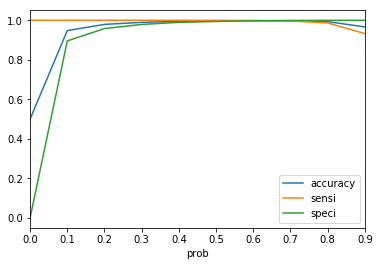

In [173]:
# Finding optimal cut-off probability
Optimal_Cutoff(y_train_df)

In [174]:
# the optimal cutoff point will be between 0.3 to 0.5, taken as 0.4
cut_off_prob=0.4
A = predictChurnWithProb(XGb,X_train_pca,y_train_re,cut_off_prob)
A.head()

Roc_auc_score : 0.9945409171259229
Sensitivity/Recall : 0.9997920349381304
Specificity: 0.9892897993137153
False Positive Rate: 0.010710200686284704
Positive predictive value: 0.9894011113397818
Negative Predictive value: 0.9997898276586801
sklearn precision score value: 0.9894011113397818


,churn,churn_Prob,final_predicted
0,0,0.151843,0
1,0,0.000497,0
2,0,0.037093,0
3,0,0.008139,0
4,0,0.399669,0


In [175]:
# Let us predict in the test data
y_test_df= predictChurnWithProb(XGb,X_test_pca,y_test,cut_off_prob)
y_test_df.head()

Roc_auc_score : 0.7790820420992811
Sensitivity/Recall : 0.637883008356546
Specificity: 0.920281075842016
False Positive Rate: 0.07971892415798401
Positive predictive value: 0.4103942652329749
Negative Predictive value: 0.9669042769857433
sklearn precision score value: 0.4103942652329749


,churn,churn_Prob,final_predicted
4265,0,0.464521,1
29221,0,0.035588,0
974,0,0.185921,0
1602,0,0.024481,0
10225,0,0.013329,0


### Conclusions:

**A) Train set**

Roc_auc_score : 0.99

Sensitivity/Recall : 0.99

Specificity: 0.98

**B) Test set**

Roc_auc_score : 0.77

Sensitivity/Recall : 0.63

Specificity: 0.92

## 14. SVM :

In [176]:
# Let us try doing the model test in SVC and check. https://www.geeksforgeeks.org/svm-hyperparameter-tuning-using-gridsearchcv-ml/
# note that we are using cost C=1
from sklearn.svm import SVC 

Sv = SVC(C = 1)

# fit
Sv.fit(X_train_pca, y_train_re)

# predict on train
S_predict = Sv.predict(X_train_pca)


In [177]:
# check the model metrics
Model_metrics(y_train_re,S_predict)

Roc_auc_score : 0.8125194967245503
Sensitivity/Recall : 0.7982218987210149
Specificity: 0.8268170947280857
False Positive Rate: 0.17318290527191432
Positive predictive value: 0.8217191179618926
Negative Predictive value: 0.8038313788920339
sklearn precision score value: 0.8217191179618926


In [178]:
# Predict on test data
S_predict = Sv.predict(X_test_pca)
Model_metrics(y_test,S_predict)

Roc_auc_score : 0.8006836222903321
Sensitivity/Recall : 0.7715877437325905
Specificity: 0.8297795008480736
False Positive Rate: 0.17022049915192633
Positive predictive value: 0.2827973455844819
Negative Predictive value: 0.9766148581206331
sklearn precision score value: 0.2827973455844819


In [179]:
# Let us do the hyper tunning 
# specify range of parameters (C) as a list
params = {"C": [0.1, 1, 10, 100, 1000]}

Svm= SVC()

# set up grid search and fit on the train set.

model_cv = GridSearchCV(estimator = Svm, param_grid = params, scoring= 'f1',cv = 5, verbose = 1,n_jobs=4,return_train_score=True) 
model_cv.fit(X_train_pca, y_train_re)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  25 out of  25 | elapsed: 13.7min finished


GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=4,
       param_grid={'C': [0.1, 1, 10, 100, 1000]}, pre_dispatch='2*n_jobs',
       refit=True, return_train_score=True, scoring='f1', verbose=1)

In [180]:
# check again the score and hyper tune parameter 
print("The best params: {}".format(model_cv.best_params_))
print("The best score: {}".format(model_cv.best_score_))

The best params: {'C': 1000}
The best score: 0.846038233117927


In [181]:
# use the C as 1000 and run again
Sv_final = SVC(C = 1000)

# fit
Sv_final.fit(X_train_pca, y_train_re)

# predict on train
S_predict = Sv_final.predict(X_train_pca)

In [182]:
# check the model metrics
Model_metrics(y_train_re,S_predict)

Roc_auc_score : 0.8522668191743787
Sensitivity/Recall : 0.8409587189352189
Specificity: 0.8635749194135385
False Positive Rate: 0.13642508058646147
Positive predictive value: 0.8604181073461354
Negative Predictive value: 0.8444760791092583
sklearn precision score value: 0.8604181073461354


In [183]:
# Check in the test set
S_predict = Sv_final.predict(X_test_pca)
Model_metrics(y_test,S_predict)

Roc_auc_score : 0.8111363917081141
Sensitivity/Recall : 0.7534818941504178
Specificity: 0.8687908892658105
False Positive Rate: 0.13120911073418948
Positive predictive value: 0.333128078817734
Negative Predictive value: 0.9759118127381601
sklearn precision score value: 0.333128078817734


### Conclusions:

**A) Train set:**

Roc_auc_score : 0.85

Sensitivity/Recall : 0.84

Specificity: 0.86

**B) Test set:**

Roc_auc_score : 0.81

Sensitivity/Recall : 0.75

Specificity: 0.86

## 15. Conclusions:

We have used the data set in all the Models. The best choice will be selected based on the test data Recall. 

Especailly for this chrun case , the Recall / Sensitivity is most important and telecom industry must work on these customers to retain rather than acquiring new customers. 

As it will more costly in acquiring due to convience the customers, advertisements etc., so better to retain the customers and improve the services on the varaibles to avoid risk which will decline the revenue of the company..

Summary of the Models:

1. Logistic Regression with PCA:


A) Train Set :
Roc_auc_score : 0.82
**Sensitivity/Recall : 0.83**
Specificity: 0.82

B) Test set:
Roc_auc_score : 0.81
**Sensitivity/Recall : 0.80**
Specificity: 0.83

2. Decision Tree :

A) Train data
Accuracy score : 0.83
**Sensitivity/Recall : 0.83**
Specificity: 0.83

B) Test data
Accuracy score : 0.76
**Sensitivity/Recall : 0.70**
Specificity: 0.82

3. Random Forest :

A) Train set:
Roc_auc_score : 0.85
**Sensitivity/Recall : 0.84**
Specificity: 0.87

B) Test set:
Roc_auc_score : 0.79
**Sensitivity/Recall : 0.71**
Specificity: 0.86

4. Boosting Models:

A) Train set
Roc_auc_score : 0.99
**Sensitivity/Recall : 0.99**
Specificity: 0.98

B) Test set
Roc_auc_score : 0.77
**Sensitivity/Recall : 0.63**
Specificity: 0.92

5. SVC :

A) Train set:
Roc_auc_score : 0.85
**Sensitivity/Recall : 0.84**
Specificity: 0.86

B) Test set:
Roc_auc_score : 0.81
**Sensitivity/Recall : 0.75**
Specificity: 0.86


We Suggest to see that the Recall/ Senstivity for the Logistic regression wiht PCA is good for the prediction as is 0.80 compared to other models. WE can see that SVC is ok as we got 0.75 recall. Boosting models are overfitting the data.

In [184]:
# Let us see the top variables which contributes more to the chrun rather than false postives.

In [185]:
# Random forest is used to derive the churn

# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': [8,10,12],
    'min_samples_leaf': range(100, 400, 200),
    'min_samples_split': range(200, 500, 200),
    'n_estimators': [100,200, 300], 
    'max_features': [12, 15, 20]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = 4,verbose = 1)

In [188]:
# Fit the grid search to the data
grid_search.fit(X_train_re, y_train_re)

Fitting 3 folds for each of 108 candidates, totalling 324 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:  4.0min
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed: 29.9min
[Parallel(n_jobs=4)]: Done 324 out of 324 | elapsed: 47.2min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
       fit_params=None, iid='warn', n_jobs=4,
       param_grid={'max_depth': [8, 10, 12], 'min_samples_leaf': range(100, 400, 200), 'min_samples_split': range(200, 500, 200), 'n_estimators': [100, 200, 300], 'max_features': [12, 15, 20]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=1)

In [189]:
# printing the optimal accuracy score and hyperparameters
print('Accuracy is',grid_search.best_score_,'using',grid_search.best_params_)

Accuracy is 0.9530258916502028 using {'max_depth': 12, 'max_features': 20, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 300}


In [190]:
# Apply rf calssifier with hyper tuning and fit the model
rf = RandomForestClassifier(max_depth=12,max_features=20,min_samples_leaf=100,min_samples_split=200,n_estimators=300,random_state=10)
rf.fit(X_train_re, y_train_re)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=12, max_features=20, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=100, min_samples_split=200,
            min_weight_fraction_leaf=0.0, n_estimators=300, n_jobs=None,
            oob_score=False, random_state=10, verbose=0, warm_start=False)

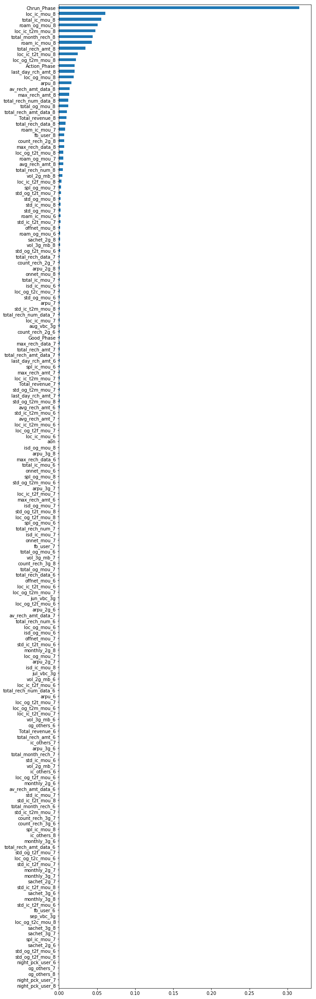

In [193]:
# Plot the bar graph
plt.figure(figsize=(10,40))
feat_importances = pd.Series(rf.feature_importances_, index=X.columns)
feat_importances.nlargest(len(X.columns)).sort_values().plot(kind='barh', align='center')

#### We can see that the top 25 variables the telecom company must concentrate.

Inorder to improve the service they need to really work on these variables to be more competitive in the market which will help them to improve the revenue of the orgaisation. 

Also, where there is always there is decrease in these varibles will drastically affect the revenue and the customer will be lost if we dont take necessary steps. 

Do launch programs to retain the customer rather than acquiring the new customer. as it will more costly to acquire the new customers rather than retianing the old customers.